# Acqusition Risk Analytics - BFSI Capstone

>Submitted By       : ***Srinivasan. G, Naveed.J, Denny.J and Abhishek. C***<br>
>Batch              : ***September - 2018***<br>

## Business Understanding
>- A Credit card provider company who issue credit card to its customers based on the number of applications they receive every year. However, the company experienced in recent years, there were increase in credit loss as it perceived that it is due to acquiring 'bad' customers.
>- The objective of this project, to mitigate the `credit risk`, by predicting the right customer during acquisition of new customers by using predictive models, based on the past data of the applicants who are seeking for credit cards.
>- Also, the objective to identify the factors which are influencing the credit risk and create strategies to mitigate the risk and assess financial benefit.
>- Also, Build an application scorecard to identify the cut off score which one would not grant credit cards to the applicants.

## Data Provided
>- `Demographic Data` - The information of the applicant at the time of credit card application. (e.g., age, gender, income,martial status etc.,)
>- `Credit Bureau Data` - The information obtained from Credit Bureau (e.g,CIBIL) and contains variables such as number of times 30/60/90 Days Past Due (DPD) in last 6 months or 1 year ,outstanding balance, number of trades (Personal,home and Auto) etc.,

##  Deliverable.
>***Solution Approach***
>- This is binary supervised clasiffication problem. We aim at building models such as Logistic Regression (standard and WOE), Random Forest, Decision Tree, SVM (Linear and Polynomial) models to identify the customers who are at risk of defaulting if offered a credit card. We have followed CRISP-DM Framework It involves following series of steps ;
  - Business understanding and Data Understanding
  - Data Cleansing and Preparation
  - Exploratory Data Analysis (Univariate & Bi-Variate Analaysis using visual plots in seaborn etc.,)
  - Data Transformation and Model Building
  - Model Evaluation
  - Application Score Card Calculation
  - Assessing the Financial Benfit of the Model
  
> - **The final submission includes, Jupyter Notebook contains all the above steps ,including standard and WOE Models.**
> - **A final presentation pdf, includes all the details as part of Mid submission along with final identified model,Application Score card calculation and Assessment of Financial Benefits of the model identified.**
  
>***Mid Submission***
>- The Capstone Project Mid submission includes ;
   - Explain the approach used to solve the problem in detail
   - Describe how you have subsetted and cleaned the data, identified important predictor variables using EDA, etc.
   - Also, explain how you will build and evaluate the models using Bivariate/Multivariate Analysis, choose the best one, and    create an application scorecard using the model. 
  - No  Code is required for mid submission. The approach paper, which also includes the future roadmap, is to be submitted in PDF format.

## Constraints
>- The data is highly imbalanced. Only 4.2% of data is about defaulters. We will be using sampling techniques such as SMOTE, SMOTE TOMEX while generating the models.

## Assumptions
>- There are 1425 rows for which the target Performance Tag (Dependent Variable) are Null. These Customer who are having target variable nulls are considered as 'rejected' Applicants and will be evaluated separately using the predicted models.
>- It is assumed that all the outstanding balance which are nulls will be considered as 0 and attributed as credit loss for financial strategy.
>- The missing Data,outliers and invalid data has been imputed either by replacing the values with mean/median values.

## Library Setup

### Import Libraries

In [784]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [785]:
# General Libraries.
# Generic Libraries
import datetime
from collections import Counter

# Importing Pandas and NumPy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas.core.algorithms as algos
from pandas import Series
import scipy.stats.stats as stats
import re
import traceback
import string
import time

#Scikit learn libraries.
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

#Scikit Libraries.
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import svm
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LassoCV, LassoLarsCV, LassoLarsIC
from imblearn.over_sampling import SMOTE

#Logistic Regression Libraries
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score 
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_curve, auc, log_loss
from sklearn.metrics import mean_squared_error

#Class Imbalance
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from collections import Counter

# Random Forest Classifier.
from sklearn.ensemble import RandomForestClassifier 

#undersampler.
from imblearn.under_sampling import RandomUnderSampler
%matplotlib inline

### Setup Jupyter notebook options

In [786]:
# Set up jupyter notebook options to work.
from IPython.display import display, HTML
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Some pandas display options.
pd.set_option('display.max_columns', 60)
pd.set_option('display.max_rows',200)
pd.options.display.float_format = '{:,.4f}'.format

## Reading and Understanding the Data

In [787]:
# Read Demographic Data
df_demo = pd.read_csv('Demographic data.csv')  

# Read Credit Data
df_credit = pd.read_csv('Credit Bureau data.csv')

In [788]:
# Check Dimensions
df_demo.shape

(71295, 12)

In [789]:
# Demographics Column Information and data type.
df_demo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71295 entries, 0 to 71294
Data columns (total 12 columns):
Application ID                                 71295 non-null int64
Age                                            71295 non-null int64
Gender                                         71293 non-null object
Marital Status (at the time of application)    71289 non-null object
No of dependents                               71292 non-null float64
Income                                         71295 non-null float64
Education                                      71176 non-null object
Profession                                     71281 non-null object
Type of residence                              71287 non-null object
No of months in current residence              71295 non-null int64
No of months in current company                71295 non-null int64
Performance Tag                                69870 non-null float64
dtypes: float64(3), int64(4), object(5)
memory usage: 6.5+ MB


In [790]:
# Check first few rows.
df_demo.head()

,Application ID,Age,Gender,Marital Status (at the time of application),No of dependents,Income,Education,Profession,Type of residence,No of months in current residence,No of months in current company,Performance Tag
0,954457215,48,F,Married,2.0000,40.0000,Bachelor,SAL,Rented,113,56,0.0000
1,432830445,31,M,Married,4.0000,55.0000,Professional,SE_PROF,Rented,112,46,0.0000
2,941387308,32,M,Single,2.0000,46.0000,Bachelor,SE_PROF,Rented,104,49,0.0000
3,392161677,43,M,Married,1.0000,53.0000,Bachelor,SE,Rented,94,53,0.0000
4,182011211,35,F,Married,5.0000,44.0000,Professional,SAL,Rented,112,43,0.0000


In [791]:
# Inspect Dimensions Credit Bureau Data.
df_credit.shape

(71295, 19)

In [792]:
# Credit Bureau Column Information and data type.
df_credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71295 entries, 0 to 71294
Data columns (total 19 columns):
Application ID                                                     71295 non-null int64
No of times 90 DPD or worse in last 6 months                       71295 non-null int64
No of times 60 DPD or worse in last 6 months                       71295 non-null int64
No of times 30 DPD or worse in last 6 months                       71295 non-null int64
No of times 90 DPD or worse in last 12 months                      71295 non-null int64
No of times 60 DPD or worse in last 12 months                      71295 non-null int64
No of times 30 DPD or worse in last 12 months                      71295 non-null int64
Avgas CC Utilization in last 12 months                             70237 non-null float64
No of trades opened in last 6 months                               71294 non-null float64
No of trades opened in last 12 months                              71295 non-null int64
No of P

#### ***Observations***
>- Obsereved following in the original data sets.
    - `Demographic Data`   -  `71,295`  rows and `12` columns
    - `Credit Bureau Data` -  `71, 295` rows and `19` columns <br>
>- The column names are too long and hence rename them to meaningful short names.

### Rename columns 
> - Rename the column names to a meaning ful short names for ;
    - `Demographic Data`
    - `Credit Bureau Data`

In [793]:
#Rename Columns names for original demographic dataframe with Meaning full Names
df_demo.rename(columns = {'Application ID' : 'Appl_ID',
                                    'Marital Status (at the time of application)' : 'Martial_Status',
                                    'No of dependents' : 'Num_Dependents',
                                    'Type of residence' : 'Residence_Type',
                                    'Profession '       : 'Profession',
                                    'No of months in current residence' : 'Num_Months_Cur_Res',
                                    'No of months in current company' : 'Num_Months_Cur_Comp',
                                    'Performance Tag' : 'Perf_Tag'},inplace=True)

In [794]:
#Rename Columns names for original Credit Bureau dataframe with Meaning full Names.
df_credit.rename(columns = {'Application ID' : 'Appl_ID',
                                    'No of times 90 DPD or worse in last 6 months'  : 'Num_90_DPD_6_Months',
                                    'No of times 60 DPD or worse in last 6 months'  : 'Num_60_DPD_6_Months',
                                    'No of times 30 DPD or worse in last 6 months'  : 'Num_30_DPD_6_Months',
                                    'No of times 90 DPD or worse in last 12 months' : 'Num_90_DPD_12_Months',
                                    'No of times 60 DPD or worse in last 12 months' : 'Num_60_DPD_12_Months',
                                    'No of times 30 DPD or worse in last 12 months' : 'Num_30_DPD_12_Months',
                                    'Avgas CC Utilization in last 12 months'        : 'Avg_CC_Util_12_Months',
                                    'No of trades opened in last 6 months'          : 'Num_Trades_Open_6_Months' ,
                                    'No of trades opened in last 12 months'         : 'Num_Trades_Open_12_Months',
                                    'No of PL trades opened in last 6 months'       : 'Num_PL_Trades_Open_6_Months',
                                    'No of PL trades opened in last 12 months'      : 'Num_PL_Trades_Open_12_Months',
                                    'No of Inquiries in last 6 months (excluding home & auto loans)' :  'Num_Inq_6_Months',
                                    'No of Inquiries in last 12 months (excluding home & auto loans)' : 'Num_Inq_12_Months',
                                    'Presence of open home loan' : 'Open_Home_Loan',
                                    'Outstanding Balance'        : 'Outstanding_Bal',
                                    'Total No of Trades'         : 'Total_Trades',
                                    'Presence of open auto loan' : 'Open_Auto_Loan',
                                    'Performance Tag'            : 'Perf_Tag'},inplace=True )

In [795]:
# Check Demographic
df_demo.head()

# Check credit bureau
df_credit.head()

,Appl_ID,Age,Gender,Martial_Status,Num_Dependents,Income,Education,Profession,Residence_Type,Num_Months_Cur_Res,Num_Months_Cur_Comp,Perf_Tag
0,954457215,48,F,Married,2.0000,40.0000,Bachelor,SAL,Rented,113,56,0.0000
1,432830445,31,M,Married,4.0000,55.0000,Professional,SE_PROF,Rented,112,46,0.0000
2,941387308,32,M,Single,2.0000,46.0000,Bachelor,SE_PROF,Rented,104,49,0.0000
3,392161677,43,M,Married,1.0000,53.0000,Bachelor,SE,Rented,94,53,0.0000
4,182011211,35,F,Married,5.0000,44.0000,Professional,SAL,Rented,112,43,0.0000


,Appl_ID,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan,Perf_Tag
0,954457215,0,0,0,0,0,0,4.0000,1.0000,2,0,0,0,0,1.0000,"2,999,395.0000",4,0,0.0000
1,432830445,0,0,0,0,0,0,3.0000,1.0000,2,0,0,0,0,0.0000,"3,078.0000",5,0,0.0000
2,941387308,0,0,0,0,0,0,7.0000,0.0000,0,0,0,0,0,1.0000,"3,004,972.0000",2,0,0.0000
3,392161677,0,0,0,0,0,0,11.0000,1.0000,1,0,0,0,0,1.0000,"3,355,373.0000",4,1,0.0000
4,182011211,0,0,0,0,0,0,12.0000,0.0000,1,0,0,0,0,1.0000,"3,014,283.0000",4,0,0.0000


## Data Cleaning and Preparation

### Verify Duplicate Record in Demographic & Credit Bureau Data on Application ID

In [796]:
# Count the number of duplicates by Application ID in Demographic & Credit Bureau.
df_demo['Appl_ID'].duplicated().sum()
df_credit['Appl_ID'].duplicated().sum()

3

3

In [797]:
# Check duplicates based on Application ID on demographic before Merging
df_demo_duplicated = df_demo[df_demo.duplicated('Appl_ID',keep=False)].sort_values("Appl_ID")
df_demo_duplicated

,Appl_ID,Age,Gender,Martial_Status,Num_Dependents,Income,Education,Profession,Residence_Type,Num_Months_Cur_Res,Num_Months_Cur_Comp,Perf_Tag
5243,653287861,26,M,Married,3.0000,25.0000,Bachelor,SAL,Rented,112,58,0.0000
42637,653287861,40,M,Married,5.0000,32.0000,Phd,SE,Rented,45,46,1.0000
48602,671989187,27,M,Married,2.0000,35.0000,Professional,SAL,Living with Parents,108,7,0.0000
59022,671989187,57,M,Married,4.0000,7.0000,Professional,SE,Rented,42,3,0.0000
24386,765011468,57,M,Single,4.0000,4.5000,Bachelor,SAL,Company provided,6,56,0.0000
27586,765011468,38,M,Married,4.0000,4.5000,Professional,SAL,Rented,6,72,0.0000


In [798]:
# Check duplicates in credit bureau based on Application ID
df_credit_duplicated = df_credit[df_credit.duplicated('Appl_ID',keep=False)].sort_values("Appl_ID")
df_credit_duplicated

,Appl_ID,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan,Perf_Tag
5243,653287861,0,0,0,0,0,0,15.0000,0.0000,0,0,0,0,0,0.0000,"10,494.0000",2,0,0.0000
42637,653287861,1,1,1,2,2,2,113.0000,2.0000,5,1,3,1,3,0.0000,"628,075.0000",6,0,1.0000
48602,671989187,1,2,3,2,2,3,63.0000,2.0000,6,1,4,3,5,0.0000,"806,473.0000",7,1,0.0000
59022,671989187,0,1,2,0,2,3,76.0000,3.0000,7,1,4,2,6,0.0000,"822,298.0000",7,0,0.0000
24386,765011468,0,0,0,0,0,0,11.0000,1.0000,2,0,1,2,2,0.0000,"212,656.0000",3,0,0.0000
27586,765011468,0,0,0,0,0,0,11.0000,1.0000,3,0,0,1,3,0.0000,"29,817.0000",6,0,0.0000


In [799]:
# Drop the duplicates, (653287861,671989187 and 765011468 ) but keep the first one from both demo graphic and credit bureau
df_demo = df_demo.drop_duplicates(subset='Appl_ID',keep='first')
df_credit = df_credit.drop_duplicates(subset='Appl_ID',keep='first')

#Verify the duplciates again.
df_demo['Appl_ID'].duplicated().sum()
df_credit['Appl_ID'].duplicated().sum()

0

0

### Merge the DemoGraphics & Credit Bureau Data on Application ID

In [800]:
# Verify the number of rows before combining both data set.
df_demo.shape

(71292, 12)

In [801]:
df_credit.shape

(71292, 19)

In [802]:
# Merge only applicant with demographic and Credit bureau for combined analysis.
df_combined = pd.merge(left=df_demo,right=df_credit,how='inner',on=['Appl_ID','Perf_Tag']) 

In [803]:
# Verified the final combined data set used for our analysis.
df_combined.shape

(71292, 29)

In [804]:
# Check the Performance Tag Count.
df_combined.Perf_Tag.value_counts()

0.0000    66920
1.0000     2947
Name: Perf_Tag, dtype: int64

In [805]:
#Take a backup original merged data frame 
df_master_data_backup = df_combined.copy()

### Find rows where dependent Perf_Tag Not populated or NaN

In [806]:
# The number of rows of 'NaN' in dependent Performance Tag.
df_combined['Perf_Tag'].isnull().sum()

1425

In [807]:
# Remove all the Rejected applicant Data (missing Values of dependent Performance Tag) before EDA 
df_rejected = df_combined.loc[(df_combined['Perf_Tag'].isnull()),:]
print("% Total Applicants Rejected in the Sample Data = {:.2f}%".format(len(df_rejected)/len(df_combined)*100))

% Total Applicants Rejected in the Sample Data = 2.00%


### Prepare Final combined master for EDA

In [808]:
## So Dataset for EDA is the remaining after removing Performance Tag which does not have 0 or 1. (Null Values)
df_combined_eda = df_combined.loc[~(df_combined['Perf_Tag'].isnull()),:]
df_combined_eda.shape

(69867, 29)

#### ***Observations***
> - Removed 3 duplicate Application ID rows (keeping first) from both demographic and credit bureau data
> - Merge both demographic & credit bureau data to form combine data set.
> - Only 2% of the rows have NaN or Null values for dependant variable - `performance.tag`
>- **Assumption-1**::
    - So model should be built on data where credit card was approved(0/1). 
    - The dependant variable - `performance.tag` having null for applicants for which credit were not issued in the first place.
    -  So removing these rows of rejected_applicants, the data frame `df_rejected`, will be used later evaluation of the predicted model.

### Verify and drop rows having high percentage Nan values - DemoGraphic & Credit Bureau

In [809]:
# find out the percentage of nulls in Combined Data set.
df_combined_missing = round(100*(df_combined_eda.isnull().sum()/df_combined_eda.shape[0]),4) \
                                          .reset_index().sort_values(by=[0],ascending=False)\
                                          .rename(columns = {"index":"Var_Name",0:"Percentage"})

# print only the columns var some nulls
df_combined_missing = df_combined_missing.loc[(df_combined_missing['Percentage'] != 0.0),:]
df_combined_missing

,Var_Name,Percentage
18,Avg_CC_Util_12_Months,1.4642
26,Outstanding_Bal,0.3893
25,Open_Home_Loan,0.3893
6,Education,0.1689
7,Profession,0.0186
8,Residence_Type,0.0115
3,Martial_Status,0.0086
4,Num_Dependents,0.0043
2,Gender,0.0029
19,Num_Trades_Open_6_Months,0.0014


In [810]:
# Set up Seborn plot attributes
sns.set()
sns.set(style="whitegrid",palette='muted',color_codes=True)

# Create a consistent palette for seaborn plots.
flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]

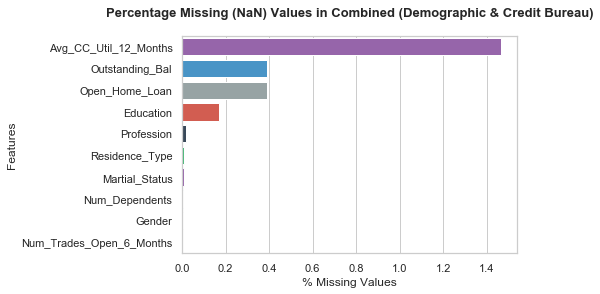

In [811]:
# Plot Percentage Missing Values from Demographic Data.
plt.figure(figsize=(6, 4))
dmplot = sns.barplot(data=df_combined_missing, y= 'Var_Name', x = 'Percentage',ci = None,palette=flatui)
dmplot.set_xlabel("% Missing Values")
dmplot.set_ylabel("Features")
dmplot.set_title("Percentage Missing (NaN) Values in Combined (Demographic & Credit Bureau)",
                 fontdict={'fontsize':13,'fontweight':'bold'},loc='center',pad=20) 

plt.show();

In [812]:
# Check number of rows having null values.
df_counts = df_combined_eda.isnull().sum() \
            .reset_index().sort_values(by=[0],ascending=False)\
            .rename(columns = {"index":"Var_Name",0:"counts"})
# print only the columns var some nulls
df_counts = df_counts.loc[(df_counts['counts'] != 0.0),:]
df_counts

,Var_Name,counts
18,Avg_CC_Util_12_Months,1023
26,Outstanding_Bal,272
25,Open_Home_Loan,272
6,Education,118
7,Profession,13
8,Residence_Type,8
3,Martial_Status,6
4,Num_Dependents,3
2,Gender,2
19,Num_Trades_Open_6_Months,1


In [813]:
# Total number of null values (exlcuding perf_tag column)
df_counts['counts'].sum()

1718

In [814]:
# Percentage Null Values EDA Data set.
print("Percentage Nulls in the EDA Dataset = {:.2f}%".format(100*(df_counts['counts'].sum()/len(df_combined_eda.index))))

Percentage Nulls in the EDA Dataset = 2.46%


#### ***Observations***
>- In the combined eda data (demographic & credit bureau) data 
   - The rows having Null Values are observed in the following columns ;
     - Avg_CC_Util_12_Months - `1023` 
     - Outstanding_Bal       - `272`
     - Open_Home_Loan        - `272`
     - Education             - `118`
     - Profession            -  `13`
     - Residence_Type        -   `8`
     - Martial_Status        -   `6`
     - Num_Dependents        -   `3`
     - Gender                -   `2`
     - Num_Trades_Open_6_Months- `1`
 
 > - The percentage of null value rows are approximately **`2.5%`** of the total rows.
 > - We cannot impute the below categorical columns for null values. Hence we will drop them from final EdA data.
   - **`Gender`**
   - **`Martial_Status`**
   - **`Education`**
   - **`Profession`**
   - **`Residence_Type`**
 > - **As per the discussion during the Mentor Call we will not drop the NA columns but impute with median.**
 > - **Assumption 2:**::
 > - For following columns we handle missing values by assigning `median value to respective NA records`.
   - **`Num_Dependents`**
   - **`Num_Trades_Open_6_Months`**
   - **`Open_Home_Loan`**
   - **`Outstanding_Bal`**
 > - The NaN values in **`Avg_CC_Util_12_Months`** is indicating no usage (assumption) by CC user. So we will impute the value with `0` to NaN **`Avg_CC_Util_12_Months`**.
 > -  Percentage Nulls in the EDA Dataset is **`2.46%`**  

In [815]:
#Impute median values for Num_Dependents, Num_Trades_Open_6_Months, Open_Home_Loan and Outstanding_Bal
#Num_Dependents
med_num_dependents =df_combined_eda['Num_Dependents'].median()
df_combined_eda.loc[(df_combined_eda['Num_Dependents'].isnull()),'Num_Dependents'] = med_num_dependents

#Num_Trades_Open_6_Months
med_num_trades_open_6_months = df_combined_eda['Num_Trades_Open_6_Months'].median()
df_combined_eda.loc[(df_combined_eda['Num_Trades_Open_6_Months'].isnull()),'Num_Trades_Open_6_Months'] = \
                                                                     med_num_trades_open_6_months

#Open_Home_Loan
med_open_home_loan = df_combined_eda['Open_Home_Loan'].median()
df_combined_eda.loc[(df_combined_eda['Open_Home_Loan'].isnull()),'Open_Home_Loan'] = med_open_home_loan 

#Outstanding_Bal
med_outstanding_bal = df_combined_eda['Outstanding_Bal'].median()
df_combined_eda.loc[(df_combined_eda['Outstanding_Bal'].isnull()),'Outstanding_Bal'] = med_outstanding_bal

#Avg_CC_Util_12_Months
df_combined_eda.loc[(df_combined_eda['Avg_CC_Util_12_Months'].isnull()),'Avg_CC_Util_12_Months'] = 0

# Drop rows having categorical columns identified with Null values
#df_combined_eda = df_combined_eda.dropna(subset=['Gender','Martial_Status','Education','Profession','Residence_Type'],axis=0)

# Repalcing empty strings with values with maximum freq for the following columns
# Gender with 'M'
# Martial_Stats with "Married"
# Education with "Professional"
# Profession with "Sal"
# Residence_Type = "Rented"
df_combined_eda.loc[(df_combined_eda['Gender'].isnull()),'Gender'] = "M"
df_combined_eda.loc[(df_combined_eda['Martial_Status'].isnull()),'Martial_Status'] = "Married"
df_combined_eda.loc[(df_combined_eda['Education'].isnull()),'Education'] = "Professional"
df_combined_eda.loc[(df_combined_eda['Profession'].isnull()),'Profession'] = "SAL"
df_combined_eda.loc[(df_combined_eda['Residence_Type'].isnull()),'Residence_Type'] = "Rented"

In [816]:
# Verify after dropping nulls.
print(df_combined_eda.isnull().sum())

Appl_ID                         0
Age                             0
Gender                          0
Martial_Status                  0
Num_Dependents                  0
Income                          0
Education                       0
Profession                      0
Residence_Type                  0
Num_Months_Cur_Res              0
Num_Months_Cur_Comp             0
Perf_Tag                        0
Num_90_DPD_6_Months             0
Num_60_DPD_6_Months             0
Num_30_DPD_6_Months             0
Num_90_DPD_12_Months            0
Num_60_DPD_12_Months            0
Num_30_DPD_12_Months            0
Avg_CC_Util_12_Months           0
Num_Trades_Open_6_Months        0
Num_Trades_Open_12_Months       0
Num_PL_Trades_Open_6_Months     0
Num_PL_Trades_Open_12_Months    0
Num_Inq_6_Months                0
Num_Inq_12_Months               0
Open_Home_Loan                  0
Outstanding_Bal                 0
Total_Trades                    0
Open_Auto_Loan                  0
dtype: int64


In [817]:
# Verify the shape of the combined data frame.
print(df_combined_eda.shape)
print(df_combined_eda.info())

(69867, 29)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 69867 entries, 0 to 71291
Data columns (total 29 columns):
Appl_ID                         69867 non-null int64
Age                             69867 non-null int64
Gender                          69867 non-null object
Martial_Status                  69867 non-null object
Num_Dependents                  69867 non-null float64
Income                          69867 non-null float64
Education                       69867 non-null object
Profession                      69867 non-null object
Residence_Type                  69867 non-null object
Num_Months_Cur_Res              69867 non-null int64
Num_Months_Cur_Comp             69867 non-null int64
Perf_Tag                        69867 non-null float64
Num_90_DPD_6_Months             69867 non-null int64
Num_60_DPD_6_Months             69867 non-null int64
Num_30_DPD_6_Months             69867 non-null int64
Num_90_DPD_12_Months            69867 non-null int64
Num_60_DPD_12_Months

#### ***Observations***
> - All null values present in both Demographic and credit bureau are imputed with appropriate values 
> - The rejected target performance tags are copied to rejected data frame for later user during scorecard
> - Removed 3 duplicate Application ID rows (keeping first) from both demographic and credit bureau data
> - Merge both demographic & credit bureau data to form combine data set.
> - The merged combined data frame (`df_combined_eda`) has 69867 rows and 29 columns , after data cleansing.

## Data Analysis

### Univariate Analysis - Categorical Variables

In [818]:
# Identify categorical Variables from the combined 
cat_cols =  [ 'Gender', 'Martial_Status', 
             'Education', 'Profession', 'Residence_Type', 
             'Num_Dependents', 'Num_90_DPD_6_Months', 'Num_60_DPD_6_Months', 
             'Num_30_DPD_6_Months', 'Num_90_DPD_12_Months', 'Num_60_DPD_12_Months',
             'Num_30_DPD_12_Months', 'Num_PL_Trades_Open_6_Months', 'Num_PL_Trades_Open_12_Months', 
             'Num_Trades_Open_6_Months','Num_Trades_Open_12_Months',
             'Num_Inq_6_Months', 'Num_Inq_12_Months', 'Open_Auto_Loan', 'Open_Home_Loan','Perf_Tag']

# Create a new data frame to hold categorical and discrete variables to analyse distribution.
df_categorical = df_combined_eda[cat_cols]

# shape 
df_categorical.shape

(69867, 21)

#### Function to Plot Univariate Categorical Variable Distribution

In [819]:
def Univariate_Categorical(xcol,title,xorient,arot):
    df_ = "df_" + xcol 
    df_ = df_categorical[xcol].value_counts().reset_index()
    df_['percentage'] = 100 * (df_[xcol] / df_[xcol].sum())
    plt.figure(figsize=(6, 4))
    flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
    splot = sns.barplot(data=df_, x= 'index', y = 'percentage',ci = None,palette=flatui)
    splot.set_xlabel(xcol)
    
    #Orientation
    for item in splot.get_xticklabels():
        item.set_rotation(xorient)
    
    splot.set_ylabel("% Distribution")
    splot.set_title(title,fontdict={'fontsize':13,'fontweight':'bold'},loc='center',pad=20) 
    #splot.legend()
    
    
    for p in splot.patches:
        splot.annotate('{:.2f}%'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                       ha = 'center', va = 'center', xytext = (0, 12), textcoords = 'offset points',fontsize=11,
                        color='black',rotation=arot)
    plt.show();

#### Plot Gender Distribution

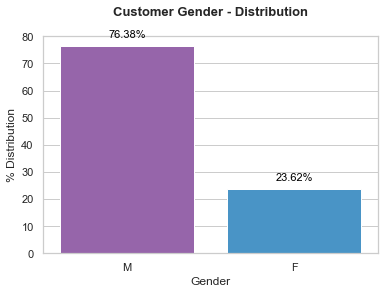

In [820]:
# Analyse Distribution of Gender
Univariate_Categorical("Gender","Customer Gender - Distribution",0,0)

#### Plot Marital Status Distribution

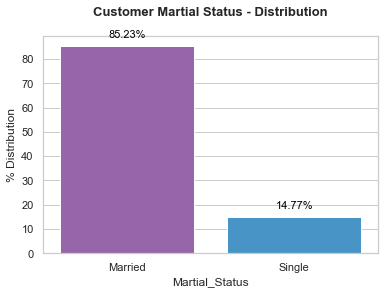

In [821]:
# Analyse Distribution of Martial Status
Univariate_Categorical("Martial_Status","Customer Martial Status - Distribution",0,0)

#### Plot Number of Dependents Distribution

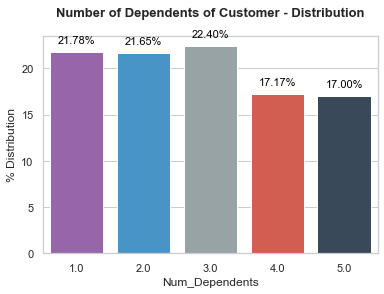

In [822]:
# Analyse Distribution of Number of Dependents
Univariate_Categorical("Num_Dependents","Number of Dependents of Customer - Distribution",0,0)

#### Plot Education Distribution

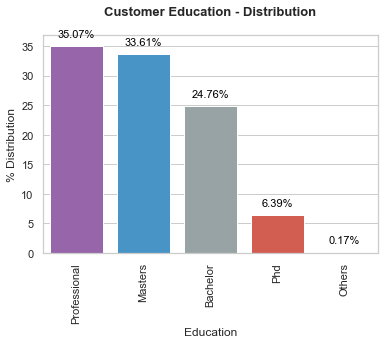

In [823]:
# Analyse Distribution of Education
Univariate_Categorical("Education","Customer Education - Distribution",90,0)

#### Plot Profession Distribution

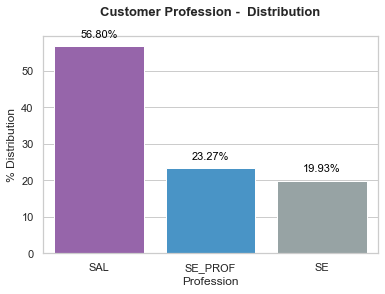

In [824]:
# Analyse Distribution of Profession
Univariate_Categorical("Profession","Customer Profession -  Distribution",0,0)

#### Plot Customer Residence Type Distribution

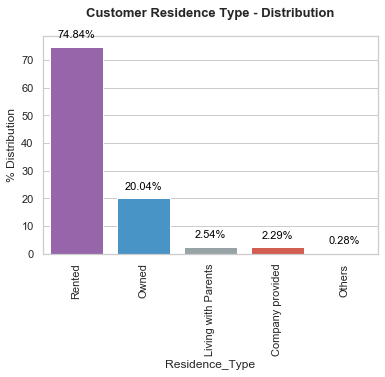

In [825]:
# Analyse Distribution of Residence Type
Univariate_Categorical("Residence_Type","Customer Residence Type - Distribution",90,0)

#### Plot Performance Tag Distribution

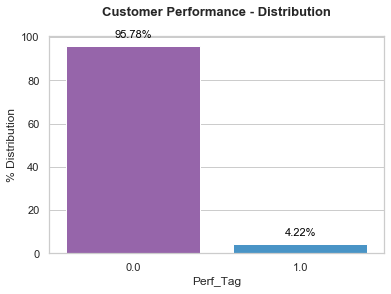

In [826]:
# Analyse Distribution of Performance as whole (Defaulters against Non Defaulters)
Univariate_Categorical("Perf_Tag","Customer Performance - Distribution",0,0)

#### Number of 90 DPD or worse last 6 Months Distribution

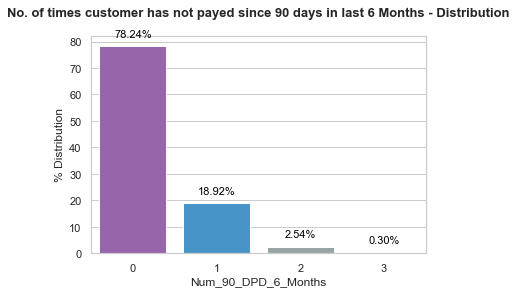

In [827]:
# Analyse distribution of Number of 90 DPD or worse in last 6 months.
Univariate_Categorical("Num_90_DPD_6_Months",
                       "No. of times customer has not payed since 90 days in last 6 Months - Distribution",0,0)

#### Number of 60 DPD or worse last 6 Months Distribution

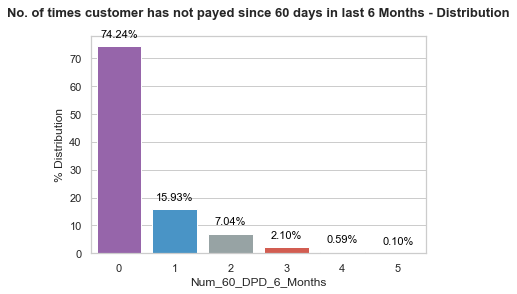

In [828]:
# Analyse distribution of Number of 60 DPD or worse in last 6 months.
Univariate_Categorical("Num_60_DPD_6_Months",
                       "No. of times customer has not payed since 60 days in last 6 Months - Distribution",0,0)

#### Number of 30 DPD or worse last 6 Months Distribution

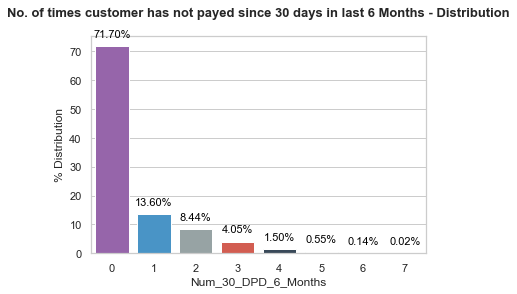

In [829]:
# Analyse distribution of Number of 30 DPD or worse in last 6 months.
Univariate_Categorical("Num_30_DPD_6_Months",
                       "No. of times customer has not payed since 30 days in last 6 Months - Distribution",0,0)

#### Number of 90 DPD or worse last 12 Months Distribution

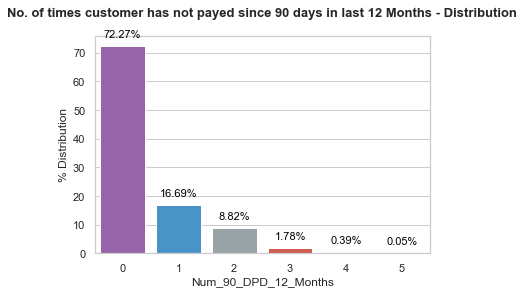

In [830]:
# Analyse distribution of number of 30 DPD or worse in last 6 months.
Univariate_Categorical("Num_90_DPD_12_Months",
                       "No. of times customer has not payed since 90 days in last 12 Months - Distribution",0,0)

#### Number of 60 DPD or worse last 12 Months Distribution

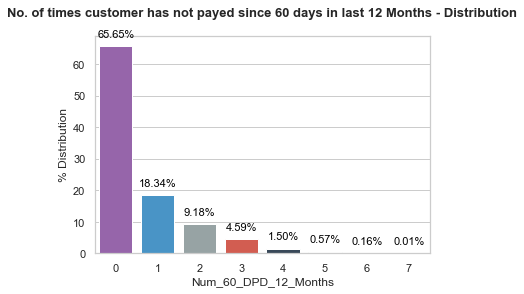

In [831]:
# Analyse distribution Number of 60 DPD or worse in last 12 months.
Univariate_Categorical("Num_60_DPD_12_Months",
                       "No. of times customer has not payed since 60 days in last 12 Months - Distribution",0,0)

#### Number of 30 DPD or worse last 12 Months Distribution

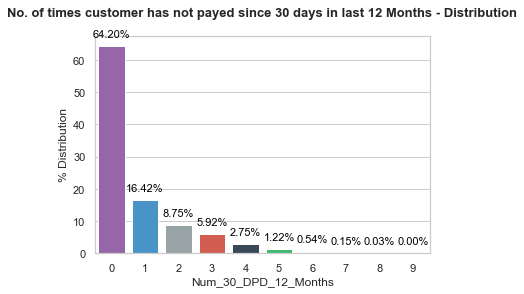

In [832]:
# Analyse distribution of  Number of 30 DPD or worse in last 12 months.
Univariate_Categorical("Num_30_DPD_12_Months",
                       "No. of times customer has not payed since 30 days in last 12 Months - Distribution",0,0)

#### Presence of Open Auto Loan Distribution

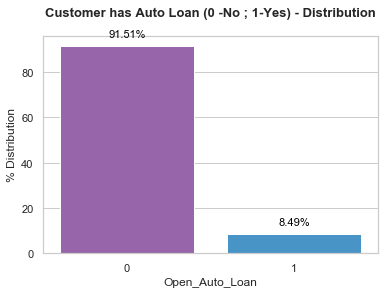

In [833]:
# Analyse the distribution of Open Auto Loans  .
Univariate_Categorical("Open_Auto_Loan","Customer has Auto Loan (0 -No ; 1-Yes) - Distribution",0,0)

#### Presence of Open Home Loan Distribution

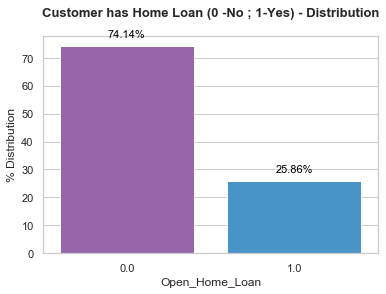

In [834]:
# Analyse the distribution of Open Home Loans  .
Univariate_Categorical("Open_Home_Loan","Customer has Home Loan (0 -No ; 1-Yes) - Distribution",0,0)

#### Number of Personal Loan Open since Last 6 months Distribution

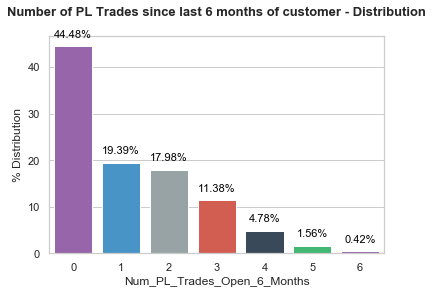

In [835]:
# Analyse Distribution of Number of Personal Loans open since last 6 months.
Univariate_Categorical("Num_PL_Trades_Open_6_Months",
                       "Number of PL Trades since last 6 months of customer - Distribution",0,0)

#### Number of Personal Loan Open since Last 12 months Distribution

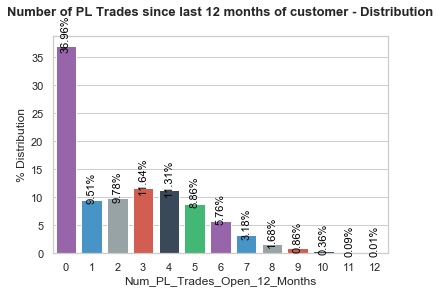

In [836]:
# Analyse Distribution of Number of Personal Loans open since last 12 months.
Univariate_Categorical("Num_PL_Trades_Open_12_Months",
                       "Number of PL Trades since last 12 months of customer - Distribution",0,90)

#### Number of inquiries by the customer last 6 months  (Excluding Home & Auto Loans) - Distribution

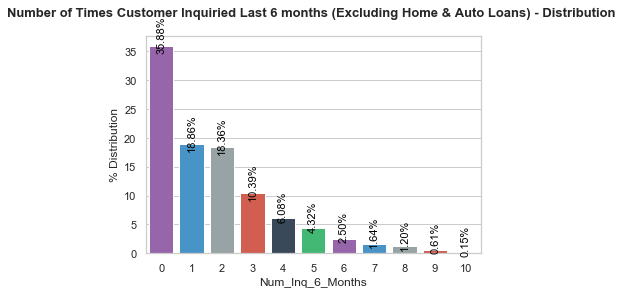

In [837]:
# Analyse Distribution of Number of Inqueries since  last 6 months.
Univariate_Categorical("Num_Inq_6_Months",
                       "Number of Times Customer Inquiried Last 6 months (Excluding Home & Auto Loans) - Distribution ",0,90)

#### Number of inquiries by the customer last 12 months (Excluding Home & Auto Loans) - Distribution 

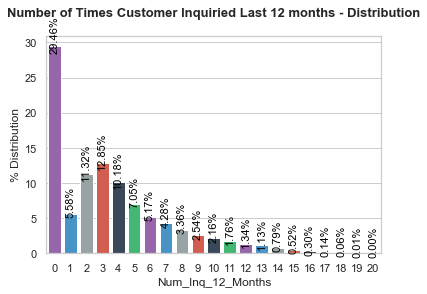

In [838]:
###### Analyse Distribution of Number of Inqueries since  last 6 months.
Univariate_Categorical("Num_Inq_12_Months","Number of Times Customer Inquiried Last 12 months - Distribution",0,90)

#### Number of Times Customer has done Trade in 6 months - Distribution 

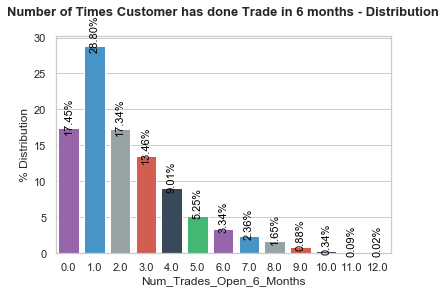

In [839]:
# Analyse Distribution of Number of Inqueries since  last 6 months.
Univariate_Categorical("Num_Trades_Open_6_Months",
                       "Number of Times Customer has done Trade in 6 months - Distribution",0,90)

#### Number of Times Customer has done Trade in 12 months - Distribution 

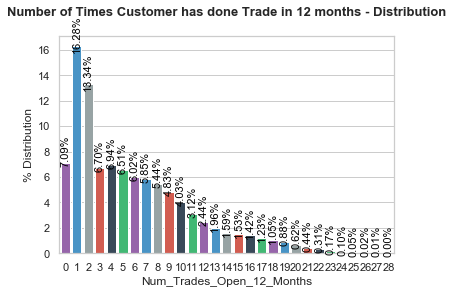

In [840]:
# Analyse Distribution of Number of Inqueries since  last 12 months.
Univariate_Categorical("Num_Trades_Open_12_Months",
                       "Number of Times Customer has done Trade in 12 months - Distribution",0,90)

#### ***Observations***
> - Following are the observation from the univariate analysis of categorical variables.
    -  `76%` is male population
    -  `85%` are married
    -   Percentage of dependents distribution is more or less same and `22% has 3` dependents
    -  `33.7%` masters and `35.07%` professional. others are `0.18%`
    -  `56.8%` are salaried.
    -  `74.8%` are rented. 
    - The Performance Percentage indicates the majority almost `95.8%` are 'good' (non default) customers. Only, `4.22%` of the population are 'bad' and defaulters.
    - `78.25%` are non-defaulters in Number of 90 DPD or worse defaulters for last 6 months.`0.3%` are 
defaulted 3 times or more.
    - `74.24%` are non-defaulters in Number of 60 DPD or worse defaulters for last 6 months. `0.10%` of defaulters 5 times  
    - `71.70%` are non-defaulters in Number of 30 DPD or worse defaulters for last 6 months. `0.02%` of defaulters 7 times  
    - `72.27%` are non-defaulters in Number of 90 DPD or worse defaulters for last 12 months.`0.05%` of defaulters 5 times  
    - `65.66%` are non-defaulters in Number of 60 DPD or worse defaulters for last 12 months.`0.01%` of defaulters 7 times  
    - `64.21%` are non-defaulters in Number of 30 DPD or worse defaulters for last 12 months.`0.03%` of defaulters 8 times
    - `91.52%` of customers do not have open auto loan  
    - `74.13%` of customers do not have open Home loan 
    - `44.49%` of customers do not have taken PL Loan last 6 months
    - `36.97%` of customer do not have taken PL loan last 12 months
    - `35.89%` of customer do not have inquired last 6 months (Inquiries excluding home and auto loans)
    - `29.47%` of customer do not have inquired last 12 months (inquiries excluding home and auto loans)

### Univariate Analysis - Continuous Variables

In [841]:
# Set up Seborn plot attributes
sns.set()
sns.set(style="whitegrid",palette='muted',color_codes=True)

# Create a consistent palette for seaborn plots.
flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]

In [842]:
# Identify Numeric Continuous Variables from the combined 
numeric_cols =  ['Age', 'Income', 'Num_Months_Cur_Res',
                 'Num_Months_Cur_Comp', 'Avg_CC_Util_12_Months',
                 'Num_Trades_Open_6_Months', 'Num_Trades_Open_12_Months', 
                 'Outstanding_Bal', 'Total_Trades']

# Create a new data frame to hold Numerical  variables to analyse distribution.
df_numerical = df_combined_eda[numeric_cols]

# shape 
df_numerical.shape

(69867, 9)

In [843]:
def draw_Hist_KDE(mtitle,xlabel,hcolor,dcolor):
    fig = plt.figure( figsize=(12,4) )
    title = fig.suptitle(mtitle + " - Distribution", fontsize=13, fontweight='bold',x=0.5,y=1.05)
    fig.subplots_adjust(top=0.88, wspace=0.5)
    
    mean=df_numerical[xlabel].mean()
    median=df_numerical[xlabel].median()
    mode=df_numerical[xlabel].mode().get_values()[0]
    
    #===========#
    # Histogram #
    #===========#
    ax1 = fig.add_subplot(1,2,1)
    ax1 = sns.distplot(df_numerical[xlabel],
                       bins=40,
                       hist_kws={"linewidth": 1,'alpha':1},
                       kde=True,
                       color=hcolor,
                      ax =ax1)

    ax1.set(xlabel=xlabel,ylabel='Frequency')
    
    # mean,median and mode,
    ax1.axvline(mean, color='tab:orange', linestyle='--',linewidth=2)
    ax1.axvline(median, color='tab:red', linestyle='-',linewidth=2)
    ax1.axvline(mode, color='tab:pink', linestyle='-',linewidth=2)
    plt.legend({'Mean':mean,'Median':median,'Mode':mode})
        
     
    #==============#
    # Density Plot #
    #==============#
    sns.set(color_codes=True)
    ax2 = fig.add_subplot(1,2,2) 
    ax2.set(xlabel=xlabel,ylabel='Density')
    ax2=sns.kdeplot(df_numerical[xlabel], ax=ax2, shade=True,color=dcolor)
    
    # mean,median and mode,
    ax2.axvline(mean, color='tab:orange', linestyle='--',linewidth=2)
    ax2.axvline(median, color='tab:red', linestyle='-',linewidth=2)
    ax2.axvline(mode, color='tab:pink', linestyle='-',linewidth=2)
    plt.legend({'Mean':mean,'Median':median,'Mode':mode})
    
    #plot 
    plt.tight_layout()
    plt.show();

In [844]:
def draw_Violin_Box(mtitle,xlabel,hcolor,dcolor):

    fig = plt.figure( figsize=(12,4) )
    #title = fig.suptitle(mtitle + "  Distribution", fontsize=16, fontweight='bold')
    fig.subplots_adjust(top=0.88, wspace=0.3)
    
    #=============#
    # Violin Plot #
    #=============#
    ax1 = fig.add_subplot(1,2,1)
    sns.violinplot(x=df_numerical[xlabel],scale='count',color=hcolor,inner='box',ax=ax1)
    ax1.set_xlabel(xlabel,size=12,alpha=0.8)
    #ax1.set_ylabel("Frequency",size=12,alpha=0.8)
    
    #==============#
    # Box Plot #
    #==============#
    ax2 = fig.add_subplot(1,2,2)
    sns.boxplot(y=df_numerical[xlabel],color=dcolor,ax=ax2,linewidth=1)
    ax2.set_xlabel(xlabel,size=12,alpha=0.8)
    ax2.set_ylabel("Frequency",size=12,alpha=0.8)
    for patch in ax2.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b, .3))
    
    #Plot and show.
    plt.tight_layout()
    plt.show();

count   69,867.0000
mean        44.9956
std          9.9301
min         -3.0000
1%          27.0000
5%          29.0000
10%         31.0000
20%         36.0000
30%         39.0000
40%         42.0000
50%         45.0000
60%         48.0000
70%         51.0000
80%         54.0000
90%         58.0000
max         65.0000
Name: Age, dtype: float64

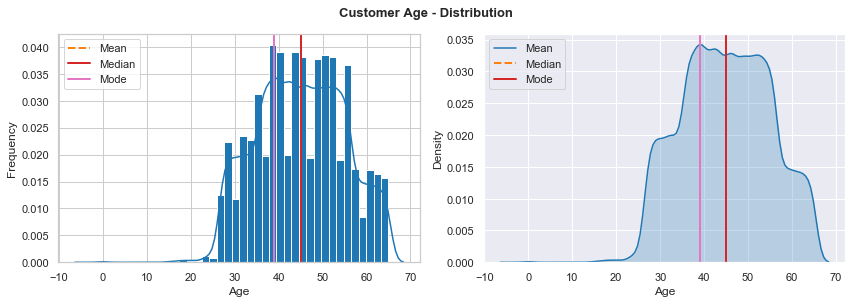

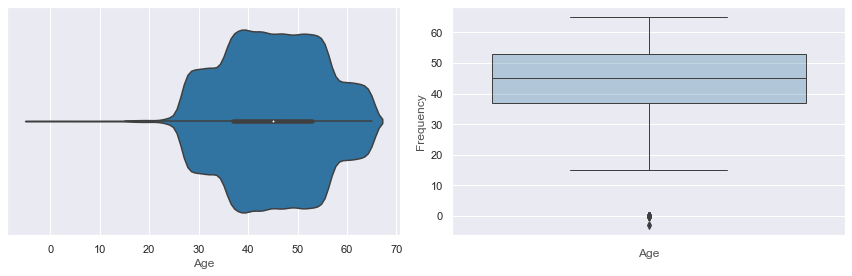

In [845]:
# Age Distribution details.
df_numerical['Age'].describe(percentiles = [0.01,.05,.10,.20,.30,.40,.50,.60,.70,.80,.90])

# plot Age Distribution.
draw_Hist_KDE("Customer Age","Age","tab:blue","tab:blue")
draw_Violin_Box("Customer Age","Age","tab:blue","tab:blue")

count   69,867.0000
mean        27.4090
std         15.4759
min         -0.5000
1%           4.5000
5%           4.5000
10%          6.0000
20%         11.0000
30%         17.0000
40%         22.0000
50%         27.0000
60%         32.0000
70%         37.0000
80%         42.0000
90%         49.0000
max         60.0000
Name: Income, dtype: float64

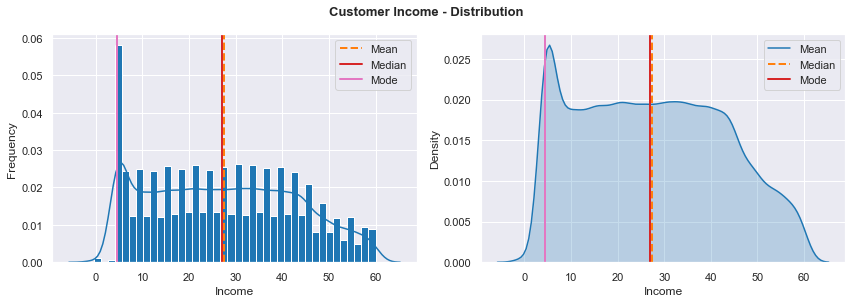

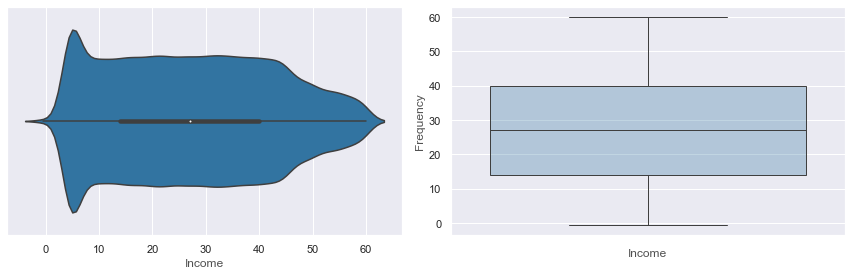

In [846]:
# Income Distribution details.
df_numerical['Income'].describe(percentiles = [0.01,.05,.10,.20,.30,.40,.50,.60,.70,.80,.90])

# Plot Income Distribution.
draw_Hist_KDE("Customer Income","Income","tab:blue","tab:blue")
draw_Violin_Box("Customer Income","Income","tab:blue","tab:blue")

count   69,867.0000
mean        34.6083
std         36.8463
min          6.0000
1%           6.0000
5%           6.0000
10%          6.0000
20%          6.0000
30%          6.0000
40%          6.0000
50%         10.0000
60%         29.0000
70%         50.0000
80%         73.0000
90%         98.0000
max        126.0000
Name: Num_Months_Cur_Res, dtype: float64

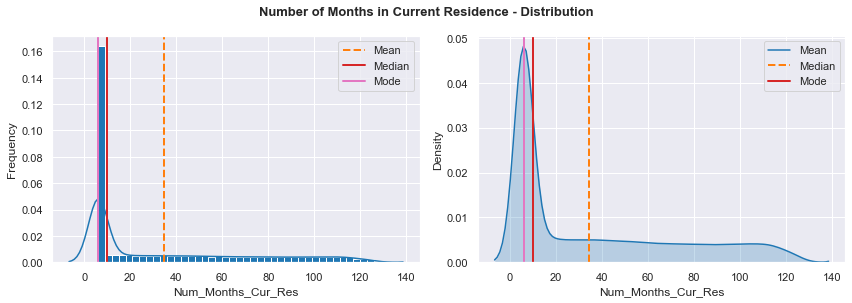

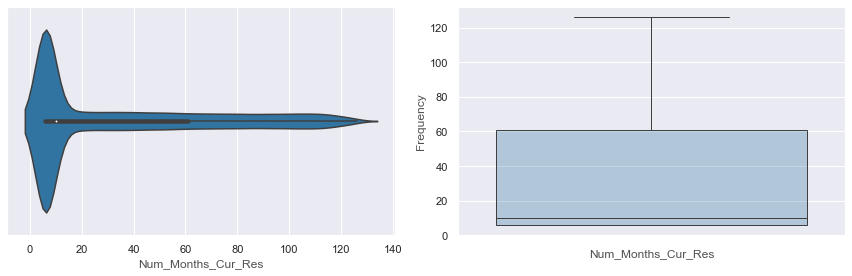

In [847]:
# Number of Months in Current Residence Distribution details.
df_numerical['Num_Months_Cur_Res'].describe(percentiles = [0.01,.05,.10,.20,.30,.40,.50,.60,.70,.80,.90])

# Number of Months Number of Months in Current Residence Current Distribution.
draw_Hist_KDE("Number of Months in Current Residence","Num_Months_Cur_Res","tab:blue","tab:blue")
draw_Violin_Box("Number of Months in Current Residence","Num_Months_Cur_Res","tab:blue","tab:blue")

count   69,867.0000
mean        34.1989
std         20.3498
min          3.0000
1%           3.0000
5%           3.0000
10%          6.0000
20%         13.0000
30%         20.0000
40%         27.0000
50%         34.0000
60%         41.0000
70%         48.0000
80%         54.0000
90%         62.0000
max        133.0000
Name: Num_Months_Cur_Comp, dtype: float64

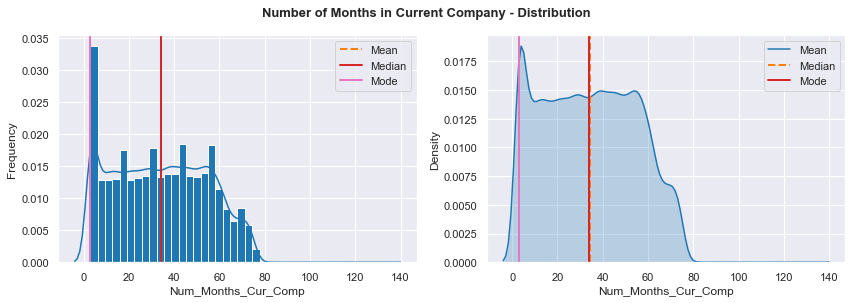

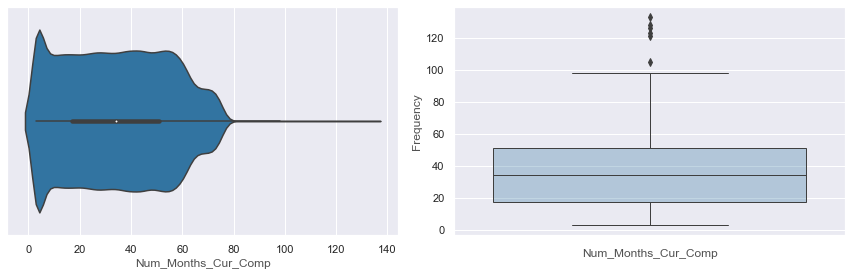

In [848]:
# Number of Months in Current Company Distribution details.
df_numerical['Num_Months_Cur_Comp'].describe(percentiles = [0.01,.05,.10,.20,.30,.40,.50,.60,.70,.80,.90])

# Plot Number of Months in Current Company.
draw_Hist_KDE("Number of Months in Current Company","Num_Months_Cur_Comp","tab:blue","tab:blue")
draw_Violin_Box("Number of Months in Current Company","Num_Months_Cur_Comp","tab:blue","tab:blue")

count   69,867.0000
mean        28.8351
std         29.5073
min          0.0000
1%           0.0000
5%           3.0000
10%          5.0000
20%          7.0000
30%          9.0000
40%         11.0000
50%         14.0000
60%         21.0000
70%         37.0000
80%         52.0000
90%         72.0000
max        113.0000
Name: Avg_CC_Util_12_Months, dtype: float64

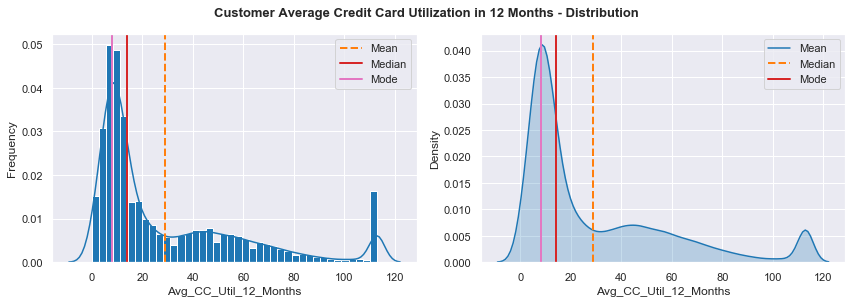

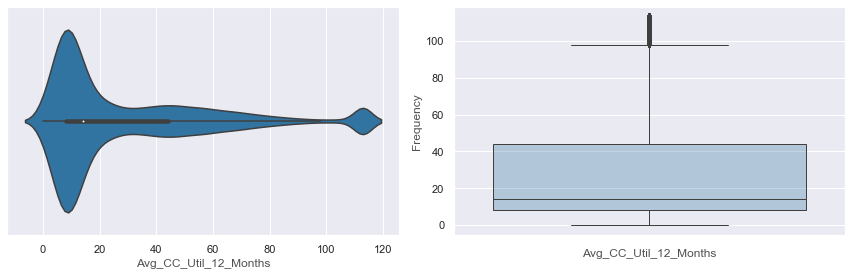

In [849]:
# Average Credit Card Utilisation Distribution details.
df_numerical['Avg_CC_Util_12_Months'].describe(percentiles = [0.01,.05,.10,.20,.30,.40,.50,.60,.70,.80,.90])

# Average Credit Card Utilisation.
draw_Hist_KDE("Customer Average Credit Card Utilization in 12 Months","Avg_CC_Util_12_Months","tab:blue","tab:blue")
draw_Violin_Box("Customer Average Credit Card Utilization in 12 Months","Avg_CC_Util_12_Months","tab:blue","tab:blue")

count      69,867.0000
mean    1,251,505.1388
std     1,284,022.4985
min             0.0000
1%              0.0000
5%          2,667.3000
10%         6,883.0000
20%        26,096.2000
30%       388,142.4000
40%       586,671.0000
50%       774,241.0000
60%       970,896.6000
70%     1,355,449.0000
80%     2,960,641.8000
90%     3,279,439.6000
max     5,218,801.0000
Name: Outstanding_Bal, dtype: float64

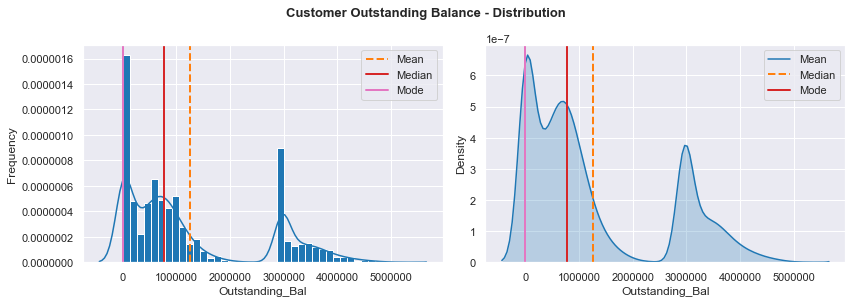

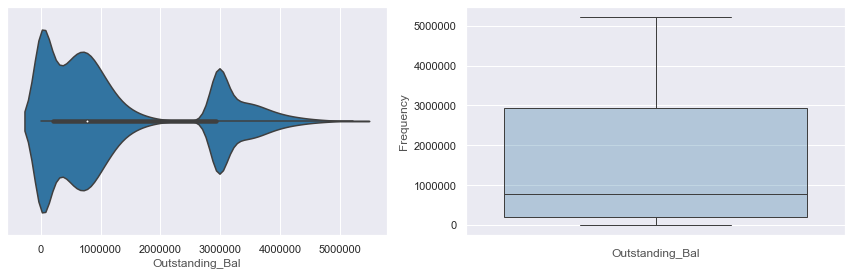

In [850]:
# Outstanding_Bal Distribution details.
df_numerical['Outstanding_Bal'].describe(percentiles = [0.01,.05,.10,.20,.30,.40,.50,.60,.70,.80,.90])

# Customer Outstaning Customer Outstanding Balance
draw_Hist_KDE("Customer Outstanding Balance","Outstanding_Bal","tab:blue","tab:blue")
draw_Violin_Box("Customer Outstanding Balance","Outstanding_Bal","tab:blue","tab:blue")

count   69,867.0000
mean         8.1748
std          7.1529
min          0.0000
1%           0.0000
5%           1.0000
10%          2.0000
20%          3.0000
30%          4.0000
40%          5.0000
50%          6.0000
60%          7.0000
70%          9.0000
80%         11.0000
90%         20.0000
max         44.0000
Name: Total_Trades, dtype: float64

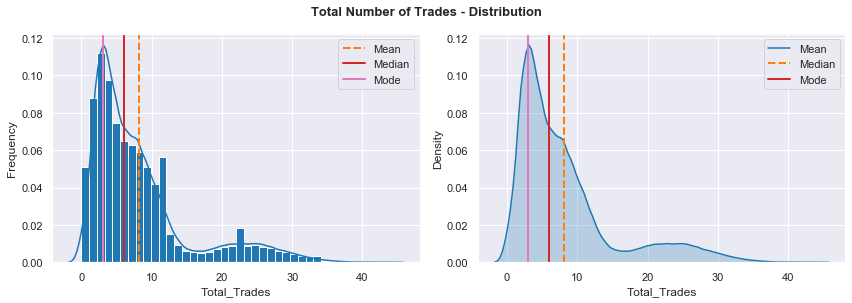

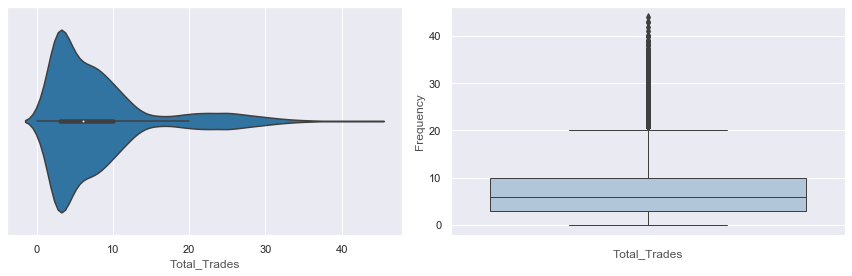

In [851]:
# Total Number of Trade Distribution details.
df_numerical['Total_Trades'].describe(percentiles = [0.01,.05,.10,.20,.30,.40,.50,.60,.70,.80,.90])

# Total Number of Trade Distribution.
draw_Hist_KDE("Total Number of Trades","Total_Trades","tab:blue","tab:blue")
draw_Violin_Box("Total Number of Trades","Total_Trades","tab:blue","tab:blue")

#### ***Observations***
> - To analyse distribution of numerical variables - Histograms, Density Diagrams, Box Plots and Histograms has been used.
> - Following are the observations of univariate analysis on the distribution of continuous numerical variables. 
     - normal distribution in the age group of `24 to 65 years`.one person has age `-3` and `16` members has age as `0`. Anything below we can consider outliers. However for WOE model we will not removing this outliers manually. 
     - Similarly, there very high spike at income `4.5` and `104` persons has income less than or equal to `0` (could be data sampling issue).
     -  The number of residence is very high at `6 months` in the distribution  
     -  Majority are `3 months` or older with current company 
     -  Majority of customers (approximately `8593`) have done only 3 trades 
     -  I Age distribution minimum value is -3 and there are outliers in the lower bound distribution
     - The number months with current company and Average Credit Card utilisation has higher order (above 95% quantile) has outliers
     - Similar outliers are present in Total number of trades (above 95% quantile)

### Bivariate Analysis - Categorical Variables

#### Functions for Bivariate Analysis

In [852]:
# Genric Functions for annotations.
def annotations(ax,textoffset,raxis):
     for p in ax.patches:
            height,width =p.get_height(),p.get_x()
            if (~np.isnan(height)):
                ax.annotate("{:.0f}".format(height), (p.get_x() + p.get_width() / 2.,
                p.get_height()),ha='center', va='center', 
                rotation=raxis, xytext=(0, textoffset), 
                textcoords='offset points',color='darkblue') 

In [853]:
def Bivariate_Categorical(df,xcol,ycol,title,xlab,ylab,orient):
    f, ax = plt.subplots(figsize=(6, 4))
    
    #palet = sns.hls_palette(8)
    colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
    palet = sns.xkcd_palette(colors)
    
    bvplot =sns.countplot(x=xcol,hue=ycol,data=df,palette=palet)
    bvplot.set_title(title,fontdict={'fontsize':12,'fontweight':'bold'},loc='center',pad=20)
    bvplot.set_xlabel(xlab)
    bvplot.set_ylabel(ylab)
    bvplot.axhline(0, color="k", clip_on=False)
    
    #Orientations.
    for item in bvplot.get_xticklabels():
        item.set_rotation(orient)
    
    #Annotations.
    annotations(bvplot,5,0)  
    plt.show();

#### Distribution - Gender against Performance 

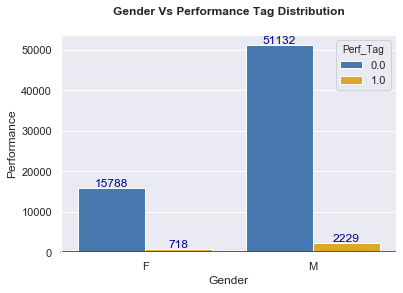

In [854]:
# Distribution of Martial Vs Performance.

Bivariate_Categorical(df_combined_eda,'Gender','Perf_Tag',"Gender Vs Performance Tag Distribution",
                                  "Gender","Performance",0)

#### Distribution - Marital against Performance 

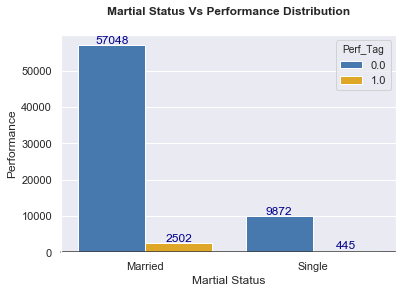

In [855]:
# Distribution of Martial Status Vs Performance.
Bivariate_Categorical(df_combined_eda,'Martial_Status','Perf_Tag',"Martial Status Vs Performance Distribution",
                                  "Martial Status","Performance",0)

#### Distribution - Number of Dependents against Performance 

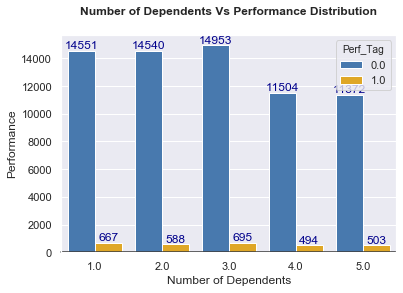

In [856]:
# Distribution of Number of Dependents Vs Performance.
Bivariate_Categorical(df_combined_eda,'Num_Dependents','Perf_Tag',"Number of Dependents Vs Performance Distribution",
                                  "Number of Dependents","Performance",0)

#### Distribution - Education against Performance 

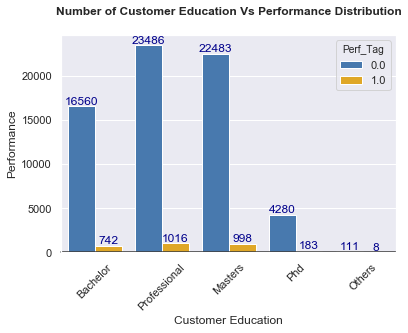

In [857]:
# Distribution of Customer Education Vs Performance.
Bivariate_Categorical(df_combined_eda,'Education','Perf_Tag',"Number of Customer Education Vs Performance Distribution",
                                  "Customer Education","Performance",45)

#### Distribution - Profession against Performance 

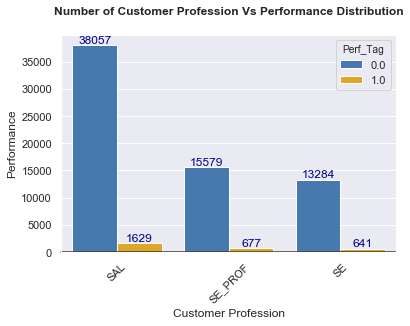

In [858]:
# Distribution of Customer Education Vs Performance.
Bivariate_Categorical(df_combined_eda,'Profession','Perf_Tag',"Number of Customer Profession Vs Performance Distribution",
                                  "Customer Profession","Performance",45)

#### Distribution - Residence Type against Performance 

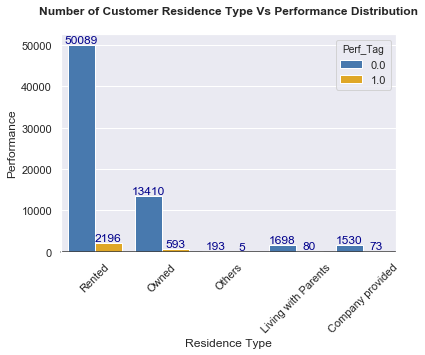

In [859]:
# Distribution of Customer Residence Type Vs Performance.
Bivariate_Categorical(df_combined_eda,'Residence_Type','Perf_Tag',
                                  "Number of Customer Residence Type Vs Performance Distribution",
                                  "Residence Type","Performance",45)

#### Distribution - Open Auto Loan against Performance 

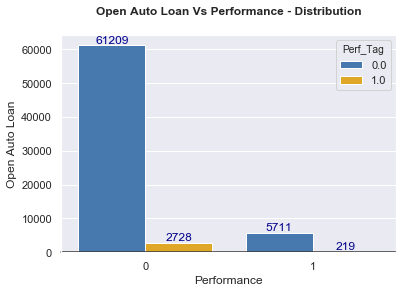

In [860]:
# Distribution of Open Auto Loan Vs Performance.
Bivariate_Categorical(df_combined_eda,'Open_Auto_Loan','Perf_Tag',"Open Auto Loan Vs Performance - Distribution",
                                  "Performance","Open Auto Loan",0)

#### ***Observations***
> - To analyse distribution of numerical variables - Histograms, Density Diagrams, Box Plots and Histograms has been used
> - The default customers for female and male customers are `717` and `2229` respectively.
  - The default are higher in Married cusomers than unmarried and they are `2502` and `445` respectively
  - The number of defaulters are more or less same for all customers having 1 or more 3 dependents. However, customer having `3 dependents` are the highest among all(`695`).
  - The good customers are bachelors, professional and Masters/PHD holders.
  - Most Non Defaulters are salaried customers.
  -  Rented or owned house owners are maximum among non deafulters
  - The most non-defaulters are having an opened home loan 

In [861]:
df_combined_eda.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69867 entries, 0 to 71291
Data columns (total 29 columns):
Appl_ID                         69867 non-null int64
Age                             69867 non-null int64
Gender                          69867 non-null object
Martial_Status                  69867 non-null object
Num_Dependents                  69867 non-null float64
Income                          69867 non-null float64
Education                       69867 non-null object
Profession                      69867 non-null object
Residence_Type                  69867 non-null object
Num_Months_Cur_Res              69867 non-null int64
Num_Months_Cur_Comp             69867 non-null int64
Perf_Tag                        69867 non-null float64
Num_90_DPD_6_Months             69867 non-null int64
Num_60_DPD_6_Months             69867 non-null int64
Num_30_DPD_6_Months             69867 non-null int64
Num_90_DPD_12_Months            69867 non-null int64
Num_60_DPD_12_Months            

#### Bivariate Analysis: Generic Function - Lineplot 

In [862]:
# Bivariate Line Plot.
def bivariate_line_plot(df,xcol,ycol,hcol,title,xlab,ylab):
    f, ax = plt.subplots(figsize=(8, 6))
    lplot = sns.lineplot(x=xcol, y=ycol,
                  hue=hcol,style=hcol,
                  estimator='mean',
                   palette="husl",
                  err_style=None,
                  dashes=True,
                  markers=True,
                  data=df)
    lplot.set_title(title,fontdict={'fontsize':12,'fontweight':'bold'},loc='center',pad=20)
    lplot.set_xlabel(xlab)
    lplot.set_ylabel(ylab)
    plt.tight_layout()
    plt.show();

#### Distribution - Income Against Average Credit Card Utilization

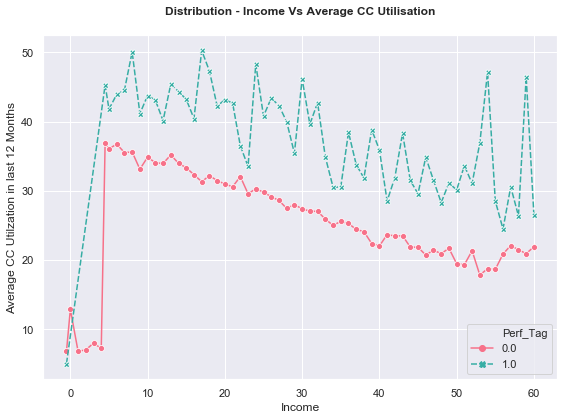

In [863]:
# Distribution - Income Against Avg_CC_Util_12_Months
bivariate_line_plot(df_combined_eda,"Income",
                    "Avg_CC_Util_12_Months",
                    "Perf_Tag",
                    "Distribution - Income Vs Average CC Utilisation",
                    "Income",
                    "Average CC Utilzation in last 12 Months")

#### ***Observations***
> - From the above plot it is clear that with increase in income The average CC usage is decreasing for whole population.
> - The average CC usage is >40 for a low income, >30 for middle income, >25 for higher income,they should be looked at.

#### Distribution - Income Against Outstanding Balance.

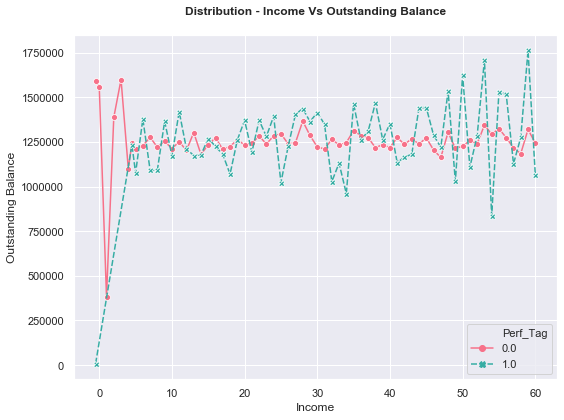

In [864]:
# Distribution - Income Against Outstanding_Balance
bivariate_line_plot(df_combined_eda,"Income",
                    "Outstanding_Bal",
                    "Perf_Tag",
                    "Distribution - Income Vs Outstanding Balance",
                    "Income",
                    "Outstanding Balance")

#### ***Observations***
>- For defaulters Outstanding balance is higher.
>- No upward/downward trend for outstanding balance with increasing income.

#### Distribution - Income Against Num_90_DPD_6_Months

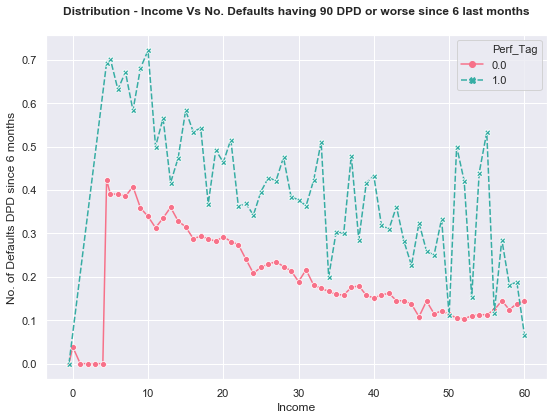

In [865]:
# Distribution - Income Against Num_90_DPD_12_Months
bivariate_line_plot(df_combined_eda,"Income",
                    "Num_90_DPD_6_Months",
                    "Perf_Tag",
                    "Distribution - Income Vs No. Defaults having 90 DPD or worse since 6 last months",
                    "Income",
                    "No. of Defaults DPD since 6 months")

#### ***Observations***
> - With increasing Income, DPD nos are decreasing. 
> - Also for defaulting users DPD nos are way higher.
> - High no of defaulters are in lower to medium income range. 

#### Distribution - Income Against Number of Inquiries made in last 12 months

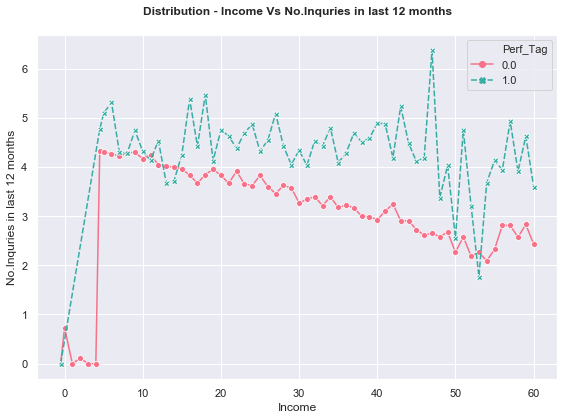

In [866]:
# Distribution - Income Against Num_Inq_6_Months
bivariate_line_plot(df_combined_eda,"Income",
                    "Num_Inq_12_Months",
                    "Perf_Tag",
                    "Distribution - Income Vs No.Inquries in last 12 months",
                    "Income",
                    "No.Inquries in last 12 months")

#### ***Observations***
>- With increase in income no of inquiries are decreasing for non defaulters.
>- With increase in income no of inquiries relatively higher for defaulters.

#### Distribution - Number of Dependents against Income

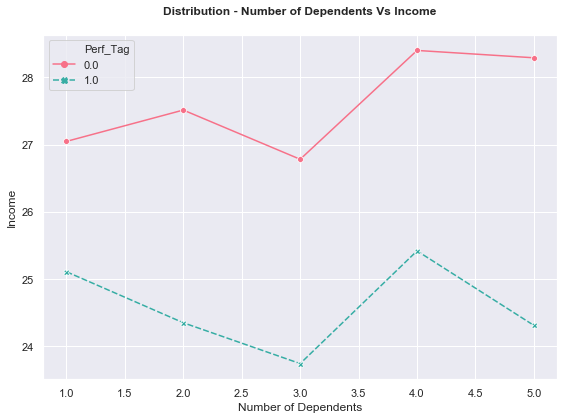

In [867]:
# Distribution - Number of Dependents Vs Income
bivariate_line_plot(df_combined_eda,"Num_Dependents",
                    "Income",
                    "Perf_Tag",
                    "Distribution - Number of Dependents Vs Income",
                    "Number of Dependents",
                    "Income")

#### ***Observations***
>- Income per no of dependants is very low for defaulters compared to non-defaulters. 

#### Distribution - Average Credit Card Utilization Vs No. of PL Trades Opened in last 12 months

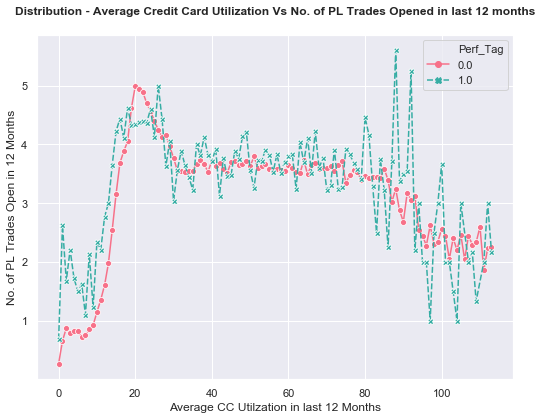

In [868]:
# Distribution - Number of Dependents Vs Income
bivariate_line_plot(df_combined_eda,"Avg_CC_Util_12_Months",
                    "Num_PL_Trades_Open_12_Months",
                    "Perf_Tag",
                    "Distribution - Average Credit Card Utilization Vs No. of PL Trades Opened in last 12 months",
                    "Average CC Utilzation in last 12 Months",
                    "No. of PL Trades Open in 12 Months")

#### ***Observations***
>- No of PL-trades opened is relatively higher for default users. 

#### Distribution - No of times 90 DPD or worse in last 6 months Vs Average Credit Card Utilization

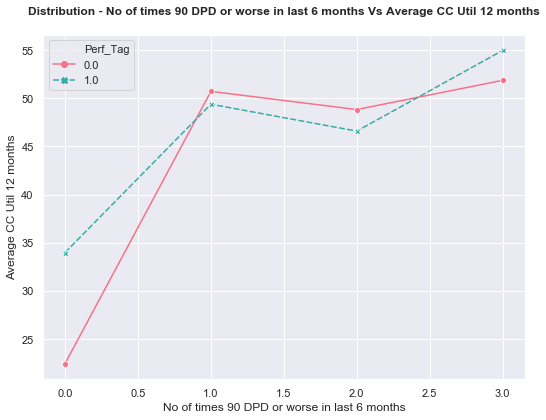

In [869]:
# Distribution - Number of Dependents Vs Income
bivariate_line_plot(df_combined_eda,"Num_90_DPD_6_Months",
                    "Avg_CC_Util_12_Months",
                    "Perf_Tag",
                    "Distribution - No of times 90 DPD or worse in last 6 months Vs Average CC Util 12 months",
                    "No of times 90 DPD or worse in last 6 months",
                    "Average CC Util 12 months")

#### ***Observations***
>- For default users Avg-CC-utilization is overall higher , Also CC-usage is going high with increasing DPD values. 

#### Distribution - Total Number of Trades Vs Outstanding Balance

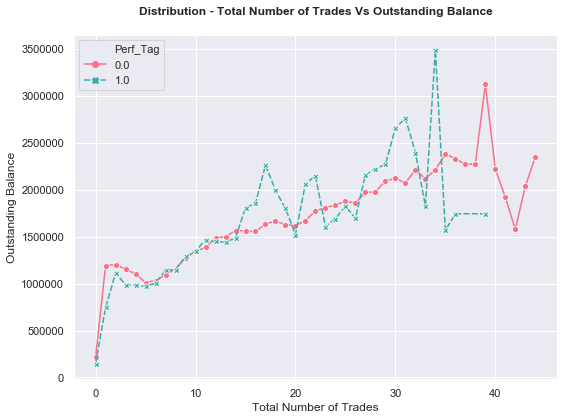

In [870]:
# Distribution - Total Number of Trades vs outstanding balance
bivariate_line_plot(df_combined_eda,"Total_Trades",
                    "Outstanding_Bal",
                    "Perf_Tag",
                    "Distribution - Total Number of Trades Vs Outstanding Balance",
                    "Total Number of Trades",
                    "Outstanding Balance")

#### ***Observations***
>- Total no of trades is overall in higher numbers for default users. 
>- Also outstanding balance is relatively higher for most of default users.

#### Distribution - No. of Inquiries in 12 months Vs Total Number of Trades

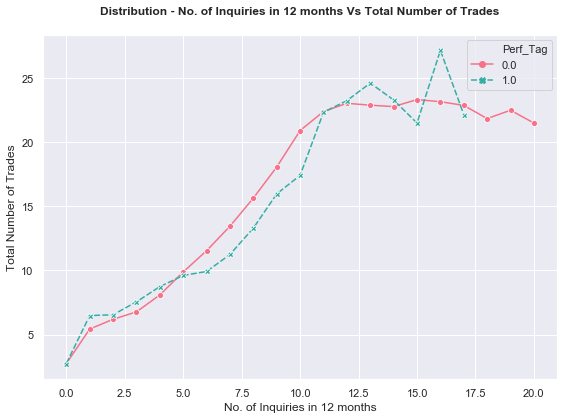

In [871]:
# Distribution - Number of Dependents Vs Income
bivariate_line_plot(df_combined_eda,"Num_Inq_12_Months",
                    "Total_Trades",
                    "Perf_Tag",
                    "Distribution - No. of Inquiries in 12 months Vs Total Number of Trades",
                    "No. of Inquiries in 12 months",
                    "Total Number of Trades")

#### ***Observations***
>- With increasing number of inquiries in last 12 months. 
>- Total no of trades increases, then gradually it becomes constant.
>- For default users total no of trades is higher.

#### Distribution - Income Against Outstanding Balance.

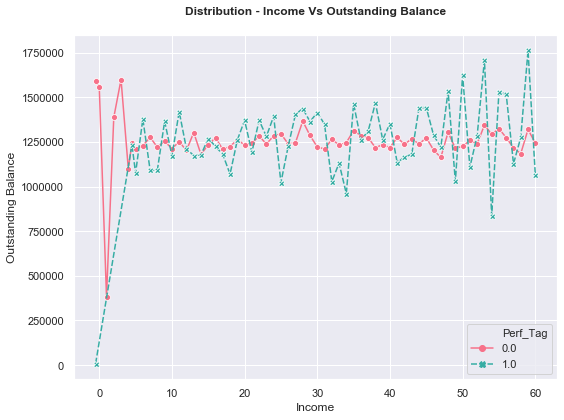

In [872]:
# Distribution - Income Against Outstanding_Balance
bivariate_line_plot(df_combined_eda,"Income",
                    "Outstanding_Bal",
                    "Perf_Tag",
                    "Distribution - Income Vs Outstanding Balance",
                    "Income",
                    "Outstanding Balance")

#### ***Observations***
>- For defaulters Outstanding balance is higher.
>- No upward/downward trend for outstanding balance with increasing income.

#### Bivariate Analysis: Visualizing correlation of Performance with other Independent variables

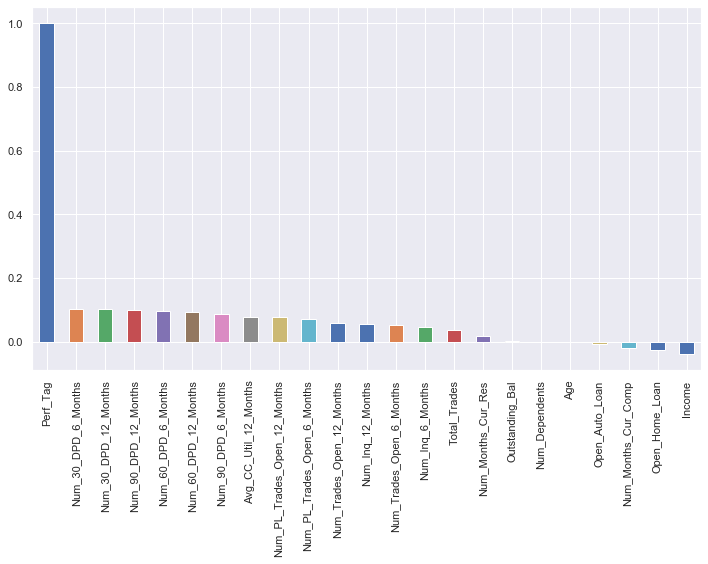

In [873]:
# Ignore Application Id for correlation.
df_corr = df_combined_eda.drop(columns=['Appl_ID'])

#Get Correlation of "Performance" with other variables:
plt.figure(figsize=(10,8))
df_corr.corr()['Perf_Tag'].sort_values(ascending=False).plot(kind='bar')
plt.tight_layout()
plt.show();

#### ***Observations***
> - The Number of 90,60 and 30 DPD for 6 and 12 months, Average Credit Card Utilisation, Number of PL trades for 6 and 12 months, Number of inquiries, Total Trades etc., are positively correlated to performance.
> - While, most importantly Number of Open Auto Loans, Home Loans, Income are negatively correlated with Performance.
> - The Age, Number of Dependents, Outstanding Balance are un-correlated with Performance.

#### Correlation Heat Map

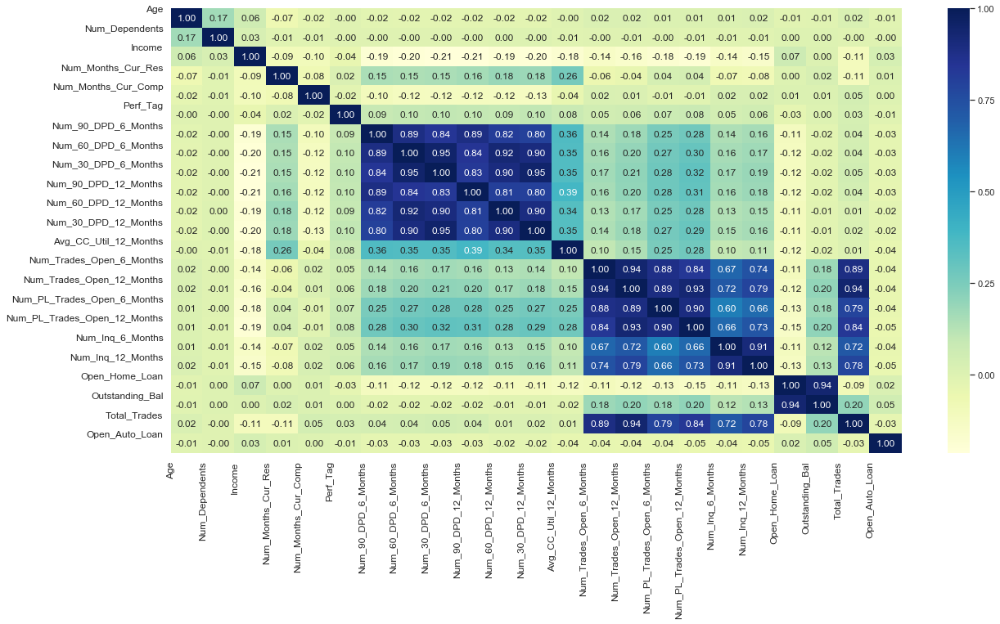

In [874]:
#check the correlation coefficients to see which variables are highly correlated
plt.figure(figsize = (20,10))
corr2 = df_corr.corr()


# plot the heat map.
sns.heatmap(corr2,annot = True,fmt='.2f',annot_kws={'size':12},cmap="YlGnBu")
plt.xticks(range(corr2.shape[1]),corr2.columns,fontsize=12, rotation=90)
plt.yticks(range(corr2.shape[1]),corr2.columns,fontsize=12, rotation=360)

plt.show();

#### ***Observations***
> - The dark blue area in the correlation map indicates the high correlation variables.
  - The first group contains`Total_Trades` has high correlation with `Num_Inq_12_Months`, `Num_Inq_6_Months`, `Num_PL_Trades_Open_12_Months`, `Num_PL_Trades_Open_6_Months`, `Num_Trades_Open_12_Months`, `Num_Trades_Open_6_Months`      
  - The `Num_Trades_Open_6_Months` has high correlation with  `Num_Trades_Open_12_Months`, `Num_PL_Trades_Open_6_Months`,  `Num_PL_Trades_Open_12_Months fields`, `Num_PL_Trades_Open_6_Months fields`, `Num_Inq_6_Months`, `Num_Inq_12_Months`.
  - Similarly, `Num_PL_Trades_Open_6_Months` and `Num_PL_Trades_Open_12_Months` has high correlation with other mentioned fields above.
  - The second group is between `Num_60_DPD_6_Months`, `Num_90_DPD_9_Months`, `Num_30_DPD_6_Months`, `Num_30_DPD_12_Months`, `Num_60_DPD_12_Months`, `Num_90_DPD_12_Months` respectively. 
  - The `Outstanding_Bal` has high correlection of `0.9` with `Open_Home_Loan`

## Data Preparation

### Management of Outliers in the data
> - The outliers are present in `Age` and `Income`.
  - For Age we will assume all ages below 18 are outliers and hence replace all with 18
  - For income replace income below 0 (negative incomes) with 0

In [875]:
# Create Final data for Model after EDA.
df_final = df_combined_eda.drop(columns=['Appl_ID'],axis=1)    
df_final = df_final.rename(columns={'Perf_Tag':'Target'})
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69867 entries, 0 to 71291
Data columns (total 28 columns):
Age                             69867 non-null int64
Gender                          69867 non-null object
Martial_Status                  69867 non-null object
Num_Dependents                  69867 non-null float64
Income                          69867 non-null float64
Education                       69867 non-null object
Profession                      69867 non-null object
Residence_Type                  69867 non-null object
Num_Months_Cur_Res              69867 non-null int64
Num_Months_Cur_Comp             69867 non-null int64
Target                          69867 non-null float64
Num_90_DPD_6_Months             69867 non-null int64
Num_60_DPD_6_Months             69867 non-null int64
Num_30_DPD_6_Months             69867 non-null int64
Num_90_DPD_12_Months            69867 non-null int64
Num_60_DPD_12_Months            69867 non-null int64
Num_30_DPD_12_Months            

#### Impute Age & Income Outliers

In [876]:
# Verify distribution of Age for outliers.
df_final[['Age','Income']].describe(percentiles = [0.00,0.05,.10,.20,.30,.40,.50,.60,.70,.80,.90])

#impute Age & Income otliers.
df_final.loc[(df_final['Age'] < 18),'Age' ] = 18
df_final.loc[(df_combined['Income'] < 0),'Income' ] = 0

# Verify distribution after imputation
df_final[['Age','Income']].describe(percentiles = [0.00,0.05,.10,.20,.30,.40,.50,.60,.70,.80,.90])

,Age,Income
count,"69,867.0000","69,867.0000"
mean,44.9956,27.4090
std,9.9301,15.4759
min,-3.0000,-0.5000
0%,-3.0000,-0.5000
5%,29.0000,4.5000
10%,31.0000,6.0000
20%,36.0000,11.0000
30%,39.0000,17.0000
40%,42.0000,22.0000


,Age,Income
count,"69,867.0000","69,867.0000"
mean,45.0019,27.4096
std,9.9079,15.4749
min,18.0000,0.0000
0%,18.0000,0.0000
5%,29.0000,4.5000
10%,31.0000,6.0000
20%,36.0000,11.0000
30%,39.0000,17.0000
40%,42.0000,22.0000


In [877]:
# Re Check Average CC util 12 months has null values.
df_final.Avg_CC_Util_12_Months.isnull().sum()

0

### Creating Dummy Variables for Categorical Variables.
> Categorical Variables ;
  - Gender
  - Martial_Status
  - Education
  - Profession
  - Residence_Type

In [878]:
df_final.shape
df_final.head()

(69867, 28)

,Age,Gender,Martial_Status,Num_Dependents,Income,Education,Profession,Residence_Type,Num_Months_Cur_Res,Num_Months_Cur_Comp,Target,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
0,48,F,Married,2.0000,40.0000,Bachelor,SAL,Rented,113,56,0.0000,0,0,0,0,0,0,4.0000,1.0000,2,0,0,0,0,1.0000,"2,999,395.0000",4,0
1,31,M,Married,4.0000,55.0000,Professional,SE_PROF,Rented,112,46,0.0000,0,0,0,0,0,0,3.0000,1.0000,2,0,0,0,0,0.0000,"3,078.0000",5,0
2,32,M,Single,2.0000,46.0000,Bachelor,SE_PROF,Rented,104,49,0.0000,0,0,0,0,0,0,7.0000,0.0000,0,0,0,0,0,1.0000,"3,004,972.0000",2,0
3,43,M,Married,1.0000,53.0000,Bachelor,SE,Rented,94,53,0.0000,0,0,0,0,0,0,11.0000,1.0000,1,0,0,0,0,1.0000,"3,355,373.0000",4,1
4,35,F,Married,5.0000,44.0000,Professional,SAL,Rented,112,43,0.0000,0,0,0,0,0,0,12.0000,0.0000,1,0,0,0,0,1.0000,"3,014,283.0000",4,0


In [879]:
# Create Dummies for Gender 7 Martial Status (binary types)
df_final['Gender'] = df_final['Gender'].map({'M': 1, 'F': 0})
df_final['Martial_Status'] = df_final['Martial_Status'].map({'Married':1,'Single':0})

# Create Dummies for categorical having more than 2 values.
dummy_education = pd.get_dummies(df_final['Education'],prefix='Education')
dummy_education.drop(['Education_Others'],axis=1,inplace=True)

## Create Dummies for categorical having more than 2 values.
dummy_profession = pd.get_dummies(df_final['Profession'],prefix='Profession')
dummy_profession.drop(['Profession_SE'],axis=1,inplace=True)

## Create Dummies for categorical having more than 2 values.
dummy_residence = pd.get_dummies(df_final['Residence_Type'],prefix='Residence')
dummy_residence.drop(['Residence_Others'],axis=1,inplace=True)

In [880]:
## Concatenate the final data with dummy data and drop the original categorical variables.
df_final = pd.concat([df_final,dummy_education,dummy_profession,dummy_residence],axis=1)
df_final = df_final.drop(columns=['Education','Profession','Residence_Type'],axis=1)

In [881]:
#Verify the columns and details.
df_final.shape
df_final.info()

(69867, 35)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69867 entries, 0 to 71291
Data columns (total 35 columns):
Age                              69867 non-null int64
Gender                           69867 non-null int64
Martial_Status                   69867 non-null int64
Num_Dependents                   69867 non-null float64
Income                           69867 non-null float64
Num_Months_Cur_Res               69867 non-null int64
Num_Months_Cur_Comp              69867 non-null int64
Target                           69867 non-null float64
Num_90_DPD_6_Months              69867 non-null int64
Num_60_DPD_6_Months              69867 non-null int64
Num_30_DPD_6_Months              69867 non-null int64
Num_90_DPD_12_Months             69867 non-null int64
Num_60_DPD_12_Months             69867 non-null int64
Num_30_DPD_12_Months             69867 non-null int64
Avg_CC_Util_12_Months            69867 non-null float64
Num_Trades_Open_6_Months         69867 non-null float64
Num_Trades_Open_1

In [882]:
# Verify data.
df_final.head()

,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Target,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented
0,48,0,1,2.0000,40.0000,113,56,0.0000,0,0,0,0,0,0,4.0000,1.0000,2,0,0,0,0,1.0000,"2,999,395.0000",4,0,1,0,0,0,1,0,0,0,0,1
1,31,1,1,4.0000,55.0000,112,46,0.0000,0,0,0,0,0,0,3.0000,1.0000,2,0,0,0,0,0.0000,"3,078.0000",5,0,0,0,0,1,0,1,0,0,0,1
2,32,1,0,2.0000,46.0000,104,49,0.0000,0,0,0,0,0,0,7.0000,0.0000,0,0,0,0,0,1.0000,"3,004,972.0000",2,0,1,0,0,0,0,1,0,0,0,1
3,43,1,1,1.0000,53.0000,94,53,0.0000,0,0,0,0,0,0,11.0000,1.0000,1,0,0,0,0,1.0000,"3,355,373.0000",4,1,1,0,0,0,0,0,0,0,0,1
4,35,0,1,5.0000,44.0000,112,43,0.0000,0,0,0,0,0,0,12.0000,0.0000,1,0,0,0,0,1.0000,"3,014,283.0000",4,0,0,0,0,1,1,0,0,0,0,1


In [883]:
pd.set_option('display.max_columns', 60)
pd.options.display.float_format = '{:,.4f}'.format
print(df_final.shape)
df_final.describe()

(69867, 35)


,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Target,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented
count,"69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000"
mean,45.0019,0.7638,0.8523,2.8595,27.4096,34.6083,34.1989,0.0422,0.2490,0.3917,0.5235,0.4148,0.6034,0.7339,28.8351,2.2851,5.7850,1.1896,2.3635,1.7580,3.5250,0.2586,"1,251,505.1388",8.1748,0.0849,0.2476,0.3361,0.0639,0.3507,0.5680,0.2327,0.0229,0.0254,0.2004,0.7484
std,9.9079,0.4248,0.3548,1.3855,15.4749,36.8463,20.3498,0.2010,0.5057,0.7719,1.0008,0.7635,1.0217,1.2432,29.5073,2.0819,5.0954,1.3527,2.4237,1.9851,3.6118,0.4379,"1,284,022.4985",7.1529,0.2787,0.4316,0.4724,0.2445,0.4772,0.4954,0.4225,0.1497,0.1575,0.4003,0.4340
min,18.0000,0.0000,0.0000,1.0000,0.0000,6.0000,3.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,37.0000,1.0000,1.0000,2.0000,14.0000,6.0000,17.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,8.0000,1.0000,2.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"209,065.0000",3.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
50%,45.0000,1.0000,1.0000,3.0000,27.0000,10.0000,34.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,14.0000,2.0000,4.0000,1.0000,2.0000,1.0000,3.0000,0.0000,"774,241.0000",6.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000
75%,53.0000,1.0000,1.0000,4.0000,40.0000,61.0000,51.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,44.0000,3.0000,9.0000,2.0000,4.0000,3.0000,5.0000,1.0000,"2,924,628.5000",10.0000,0.0000,0.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000
max,65.0000,1.0000,1.0000,5.0000,60.0000,126.0000,133.0000,1.0000,3.0000,5.0000,7.0000,5.0000,7.0000,9.0000,113.0000,12.0000,28.0000,6.0000,12.0000,10.0000,20.0000,1.0000,"5,218,801.0000",44.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


### Backup  Un-normalised Data 

In [884]:
### Taking Backup of df_final without Normalization for Random Forest and Decision Tree
df_unnorm = df_final.copy()

In [885]:
df_unnorm.head()

,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Target,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented
0,48,0,1,2.0000,40.0000,113,56,0.0000,0,0,0,0,0,0,4.0000,1.0000,2,0,0,0,0,1.0000,"2,999,395.0000",4,0,1,0,0,0,1,0,0,0,0,1
1,31,1,1,4.0000,55.0000,112,46,0.0000,0,0,0,0,0,0,3.0000,1.0000,2,0,0,0,0,0.0000,"3,078.0000",5,0,0,0,0,1,0,1,0,0,0,1
2,32,1,0,2.0000,46.0000,104,49,0.0000,0,0,0,0,0,0,7.0000,0.0000,0,0,0,0,0,1.0000,"3,004,972.0000",2,0,1,0,0,0,0,1,0,0,0,1
3,43,1,1,1.0000,53.0000,94,53,0.0000,0,0,0,0,0,0,11.0000,1.0000,1,0,0,0,0,1.0000,"3,355,373.0000",4,1,1,0,0,0,0,0,0,0,0,1
4,35,0,1,5.0000,44.0000,112,43,0.0000,0,0,0,0,0,0,12.0000,0.0000,1,0,0,0,0,1.0000,"3,014,283.0000",4,0,0,0,0,1,1,0,0,0,0,1


In [886]:
df_unnorm.shape

(69867, 35)

#### ***Observations***
> - The binary variables `Gender` and `Martial Status` Values are replaced with 1 and 0.
> - One Hot Encoding is carried out for variables - `Education`, `Profession` and `Residence_Type`.
> - The original variables are dropped after dummy variables created and concatenated with original dataframe.
> - A Backup of un normalised data for future Models like Random Forest and Decision Trees etc.,

## Calculation WOE and IV

In [887]:
#df_final_woe = df_final.drop(columns=['Appl_ID'],axis=1)    
df_final_woe = df_final.rename(columns={'Perf_Tag':'Target'})
df_final_woe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69867 entries, 0 to 71291
Data columns (total 35 columns):
Age                              69867 non-null int64
Gender                           69867 non-null int64
Martial_Status                   69867 non-null int64
Num_Dependents                   69867 non-null float64
Income                           69867 non-null float64
Num_Months_Cur_Res               69867 non-null int64
Num_Months_Cur_Comp              69867 non-null int64
Target                           69867 non-null float64
Num_90_DPD_6_Months              69867 non-null int64
Num_60_DPD_6_Months              69867 non-null int64
Num_30_DPD_6_Months              69867 non-null int64
Num_90_DPD_12_Months             69867 non-null int64
Num_60_DPD_12_Months             69867 non-null int64
Num_30_DPD_12_Months             69867 non-null int64
Avg_CC_Util_12_Months            69867 non-null float64
Num_Trades_Open_6_Months         69867 non-null float64
Num_Trades_Open_1

In [888]:
df_final_woe.Target.value_counts()

0.0000    66920
1.0000     2947
Name: Target, dtype: int64

### Function iv_woe to calculate woe and iv values (10 bins)

In [889]:
def iv_woe(data, target, bins=10, show_woe=False):
    #Empty Dataframe
    newDF,woeDF = pd.DataFrame(), pd.DataFrame()
    force_bins = 10
    
    #Extract Column Names
    cols = data.columns
    
    #Run WOE and IV on all the independent variables
    for ivars in cols[~cols.isin([target])]:
            if (data[ivars].dtype.kind in 'bifc') and (len(np.unique(data[ivars]))>force_bins):
                binned_x = pd.qcut(data[ivars], bins,  duplicates='drop')
                d0 = pd.DataFrame({'x': binned_x, 'y': data[target]})
            else:
                d0 = pd.DataFrame({'x': data[ivars], 'y': data[target]})
                
            d = d0.groupby("x", as_index=False).agg({"y": ["count", "sum"]})
            d.columns = ['Cutoff', 'N', 'Events']
            d['% of Events'] = np.maximum(d['Events'], 0.5) / d['Events'].sum()
            d['Non-Events'] = d['N'] - d['Events']
            d['% of Non-Events'] = np.maximum(d['Non-Events'], 0.5) / d['Non-Events'].sum()
            d['WoE'] = np.log(d['% of Events']/d['% of Non-Events'])
            d['IV'] = d['WoE'] * (d['% of Events'] - d['% of Non-Events'])
            d.insert(loc=0, column='Variable', value=ivars)
            #print("Information value of " + ivars + " is " + str(round(d['IV'].sum(),6)))
            temp =pd.DataFrame({"Variable" : [ivars], "IV" : [d['IV'].sum()]}, columns = ["Variable", "IV"])
            newDF=pd.concat([newDF,temp], axis=0)
            woeDF=pd.concat([woeDF,d], axis=0)
            
            #Show WOE Table
            if show_woe == True:
                print(d)
    return newDF, woeDF

### Generate WOE & IV

In [890]:
# call iv_woe function and calculate iv and woe values. 
iv, woe = iv_woe(data = df_final_woe, target = 'Target', bins=10, show_woe = False)

In [891]:
# Prepare woe_results for plotting.
df_woe = pd.DataFrame({'WoE':woe.groupby('Variable').WoE.max()}).reset_index().sort_values(by="WoE",ascending=False)
df_woe

,Variable,WoE
9,Num_30_DPD_12_Months,2.4296
13,Num_90_DPD_12_Months,1.2982
11,Num_60_DPD_12_Months,1.1027
10,Num_30_DPD_6_Months,1.0462
14,Num_90_DPD_6_Months,1.0378
12,Num_60_DPD_6_Months,0.9338
1,Avg_CC_Util_12_Months,0.5902
16,Num_Inq_12_Months,0.5882
22,Num_Trades_Open_12_Months,0.5758
17,Num_Inq_6_Months,0.5548


In [892]:
# Prepare IV results for plotting.
df_iv = pd.DataFrame({'IV':iv.groupby('Variable').IV.max()}).reset_index().sort_values(by="IV",ascending=False)
df_iv

,Variable,IV
1,Avg_CC_Util_12_Months,0.2992
22,Num_Trades_Open_12_Months,0.2936
20,Num_PL_Trades_Open_12_Months,0.2586
16,Num_Inq_12_Months,0.2452
10,Num_30_DPD_6_Months,0.2442
26,Outstanding_Bal,0.2427
33,Total_Trades,0.2323
21,Num_PL_Trades_Open_6_Months,0.2242
9,Num_30_DPD_12_Months,0.2186
13,Num_90_DPD_12_Months,0.2156


In [893]:
#Write down the IV values to csv for review.
##df_iv.to_csv("iv3.csv")

### Plot  WOE.

In [894]:
# Genric Functions for annotations.
def annot(ax,textoffset,raxis):
     for p in ax.patches:
            height,width =p.get_height(),p.get_x()
            if (~np.isnan(height)):
                ax.annotate("{:.4f}".format(height), (p.get_x() + p.get_width() / 2.,
                p.get_height()),ha='center', va='center', 
                rotation=raxis, xytext=(0, textoffset), 
                textcoords='offset points',color='black') 

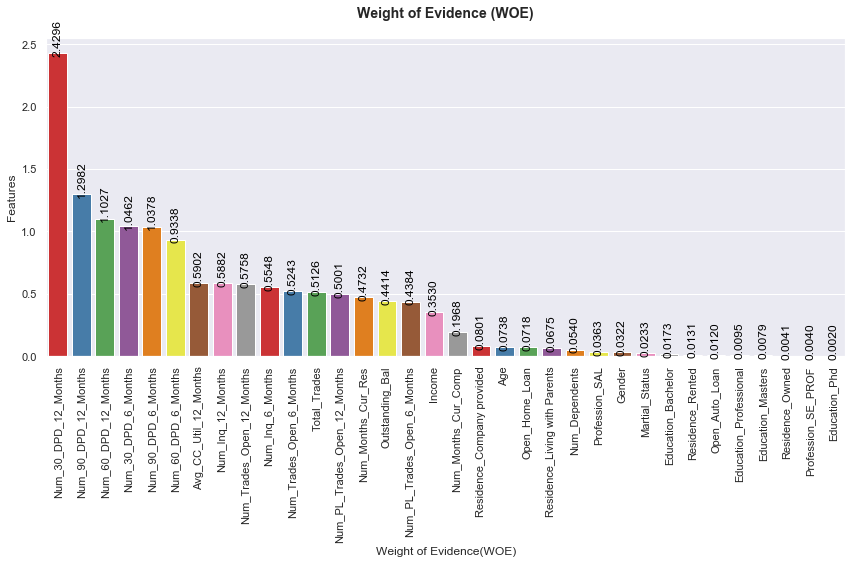

In [895]:
## Plot WoE (Weight of Evidence)
#
plt.figure(figsize=(12, 8))
woeplot = sns.barplot(data=df_woe, x='Variable', y = 'WoE',ci = None,palette='Set1')
woeplot.set_xlabel("Weight of Evidence(WOE)")
woeplot.set_ylabel('Features')
woeplot.set_title("Weight of Evidence (WOE)",
                  fontdict={'fontsize':14,'fontweight':'bold'},loc='center',pad=20)

#Orientations.
for item in woeplot.get_xticklabels():
    item.set_rotation(90)
    
#Annotations.
annot(woeplot,15,90)  

plt.tight_layout()
plt.show();

### Plot IV

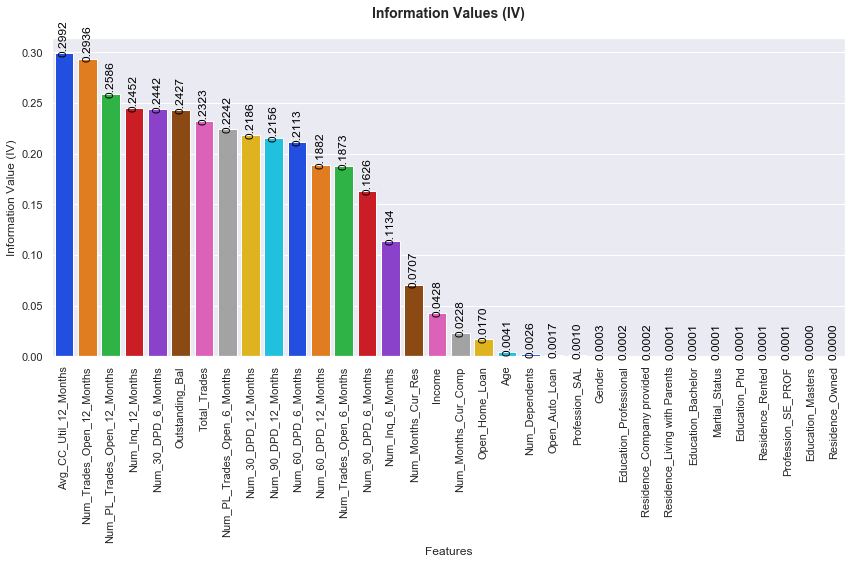

In [896]:
plt.figure(figsize=(12, 8))
ivplot = sns.barplot(data=df_iv, x='Variable', y='IV',ci = None,palette='bright')
ivplot.set_ylabel("Information Value (IV)")
ivplot.set_xlabel('Features')
ivplot.set_title("Information Values (IV)",
                  fontdict={'fontsize':14,'fontweight':'bold'},loc='center',pad=20)

#Orientations.
for item in ivplot.get_xticklabels():
    item.set_rotation(90)
    
#Annotations.
annot(ivplot,15,90)

#Show the plot.
plt.tight_layout()
plt.show();

#### ***Observations***<br>

> - Information Value Predictive Power
    
|Information Value |Predictive Power        | 
|:-----------------|:-------------------    |
|<0.02	           |Useless for prediction  | 
|0.02 to 0.1       |Weak predictor          | 
|0.1  to 0.3	   |Medium predictor        | 
|0.3  to 0.5	   |Strong predictor        |  
|>0.5	           |Suspicious/too good be T|          |

> - From above WOE & IV analysis the following variables show relatively higher significance.

|`Variable`                    |`IV`    |
|:-----------------------------|-------:|
|Avg_CC_Util_12_Months	       |`0.2992`| 
|Num_Trades_Open_12_Months     |`0.2936`|  
|Num_PL_Trades_Open_12_Months  |`0.2586`| 
|Num_Inq_12_Months	           |`0.2452`|
|Num_30_DPD_6_Months	       |`0.2442`|
|Outstanding_Bal               |`0.2427`|
|Total_Trades	               | 0.2323`|
|Num_PL_Trades_Open_6_Months   |`0.2242`|
|Num_30_DPD_12_Months	       |`0.2186`|
|Num_90_DPD_12_Months	       |`0.2156`|
|Num_60_DPD_6_Months	       |`0.2113`|
|Num_60_DPD_12_Months          |`0.1882`|
|Num_Trades_Open_6_Months      |`0.1873`|
|Num_90_DPD_6_Months	       |`0.1626`|
|Num_Inq_6_Months              |`0.1134`|
|Num_Months_Cur_Res	           |`0.0707`|
|Income	                       |`0.0428`|
|Num_Months_Cur_Comp	       |`0.0228`| 

In [897]:
##df_final_woe.info()

## Build Standard Models Combined Data (Demographic & Credit Bureau) 

### Generic Function - Plot Confusion Matrix

In [898]:
# Function to plot the confusion matrix.
def draw_confusion_matrix(cm,title):
    fig = plt.figure(figsize = (6,4)) 
    #sns.heatmap(cm,cmap="coolwarm",annot=True,linewidths=0.5, fmt='g')
    sns.heatmap(cm,cmap="coolwarm",annot=True,annot_kws={"size":12},linewidths=0.8, fmt='g')
    sns.set(font_scale=1.1)
    plt.title('Confusion matrix - ' + title, y=1.2)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show();

### Generic Function - Model Evaluation Report

In [899]:
# Function to display Model Metrics and classification Report.
def model_report(y,ypred):
    
    # Confusion metrics.
    TP = (metrics.confusion_matrix(y,ypred))[0][0]
    FP = (metrics.confusion_matrix(y,ypred))[0][1]
    FN = (metrics.confusion_matrix(y,ypred))[1][0]
    TN = (metrics.confusion_matrix(y,ypred))[1][1]
    
    print("\n-------------------- SCORES --------------------------")
    # Accuracy, Precision, Recall, AUC, Sensitivity, Specificity scores.
    print("Accuracy Score  : %.4f" % metrics.accuracy_score(y, ypred))
    print("Precision Score : %.4f" % metrics.precision_score(y, ypred))
    print("Recall Score    : %.4f" % metrics.recall_score(y, ypred))
    print("Sensitivity     : %.4f" % (TP/(TP+FN)))
    print("Specificity     : %.4f" % (TN/(TN+FP)))
    print(" AUC Score      : %.4f" % metrics.roc_auc_score(y,ypred))
    print("\n")
    
    # Classification Report
    cr_title=" CLASSIFICATION REPORT"
    print("\n----------------" +cr_title+"------------------")
    print(classification_report(y,ypred))
    return None

### Generic Function - Plot ROC Curve.

In [900]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic Graph')
    plt.legend(loc="lower right")
    plt.show();
    return None
    #return fpr, tpr, thresholds

### Generic Function -  GridSearch Cross Validation Best Params

In [901]:
def gridsearch_best_params(gs_model):
    print('\n----- Best Score & params ----')
    print('Best score: {} '.format(gs_model.best_score_))
    print('Best Param: {}'.format(gs_model.best_params_))

### Generic Function - Finding Optimum Classification Threshold Cut-off

In [902]:
def optimum_cutoff(yo,yp,show_cutoff=False):
    from sklearn.metrics import confusion_matrix
    
    # calculate accuracy sensitivity and specificity for various probability cutoffs.
    # TP = confusion[1,1]; TN = confusion[0,0]; FP = confusion[0,1]; FN = confusion[1,0] 
    #
    cutoff_df = pd.DataFrame( columns = ['predicted_prob','accuracy','sensitivity','specitivity'])
    cut_range = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

    for i in cut_range:
        cm=metrics.confusion_matrix(yo, yp[i])
        cm_total=sum(sum(cm))
        accuracy    = (cm[0,0]+cm[1,1])/cm_total
        specificity =  cm[0,0]/(cm[0,0]+cm[0,1])
        sensitivity = cm[1,1]/(cm[1,0]+cm[1,1])
        cutoff_df.loc[i] =[i,accuracy,sensitivity,specificity]
        
    if show_cutoff:
        print(cutoff_df)
        
    # Let's plot accuracy sensitivity and specificity for various probabilities.
    cutoff_df.plot.line(x='predicted_prob', y=['accuracy','sensitivity','specitivity'])
    plt.tight_layout
    plt.show();

### Normalising the Numerical Variables.
> - As a pre-requisite step, we will first normalize the Numeric variables

In [903]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69867 entries, 0 to 71291
Data columns (total 35 columns):
Age                              69867 non-null int64
Gender                           69867 non-null int64
Martial_Status                   69867 non-null int64
Num_Dependents                   69867 non-null float64
Income                           69867 non-null float64
Num_Months_Cur_Res               69867 non-null int64
Num_Months_Cur_Comp              69867 non-null int64
Target                           69867 non-null float64
Num_90_DPD_6_Months              69867 non-null int64
Num_60_DPD_6_Months              69867 non-null int64
Num_30_DPD_6_Months              69867 non-null int64
Num_90_DPD_12_Months             69867 non-null int64
Num_60_DPD_12_Months             69867 non-null int64
Num_30_DPD_12_Months             69867 non-null int64
Avg_CC_Util_12_Months            69867 non-null float64
Num_Trades_Open_6_Months         69867 non-null float64
Num_Trades_Open_1

In [904]:
df_final.select_dtypes(['int64','float64']).columns

Index(['Age', 'Gender', 'Martial_Status', 'Num_Dependents', 'Income',
       'Num_Months_Cur_Res', 'Num_Months_Cur_Comp', 'Target',
       'Num_90_DPD_6_Months', 'Num_60_DPD_6_Months', 'Num_30_DPD_6_Months',
       'Num_90_DPD_12_Months', 'Num_60_DPD_12_Months', 'Num_30_DPD_12_Months',
       'Avg_CC_Util_12_Months', 'Num_Trades_Open_6_Months',
       'Num_Trades_Open_12_Months', 'Num_PL_Trades_Open_6_Months',
       'Num_PL_Trades_Open_12_Months', 'Num_Inq_6_Months', 'Num_Inq_12_Months',
       'Open_Home_Loan', 'Outstanding_Bal', 'Total_Trades', 'Open_Auto_Loan'],
      dtype='object')

In [905]:
norm_cols =  ['Age', 'Gender', 'Martial_Status', 'Num_Dependents',
              'Income', 'Num_Months_Cur_Res', 'Num_Months_Cur_Comp',
              'Num_90_DPD_6_Months', 'Num_60_DPD_6_Months', 'Num_30_DPD_6_Months',
              'Num_90_DPD_12_Months', 'Num_60_DPD_12_Months', 'Num_30_DPD_12_Months',
              'Avg_CC_Util_12_Months', 'Num_Trades_Open_6_Months',
              'Num_Trades_Open_12_Months', 'Num_PL_Trades_Open_6_Months',
              'Num_PL_Trades_Open_12_Months', 'Num_Inq_6_Months', 'Num_Inq_12_Months',
              'Open_Home_Loan', 'Outstanding_Bal', 'Total_Trades', 'Open_Auto_Loan']

#Get the data frame for normalisation. 
df_norm = df_final[norm_cols]
df_norm.describe()

,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
count,"69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000"
mean,45.0019,0.7638,0.8523,2.8595,27.4096,34.6083,34.1989,0.2490,0.3917,0.5235,0.4148,0.6034,0.7339,28.8351,2.2851,5.7850,1.1896,2.3635,1.7580,3.5250,0.2586,"1,251,505.1388",8.1748,0.0849
std,9.9079,0.4248,0.3548,1.3855,15.4749,36.8463,20.3498,0.5057,0.7719,1.0008,0.7635,1.0217,1.2432,29.5073,2.0819,5.0954,1.3527,2.4237,1.9851,3.6118,0.4379,"1,284,022.4985",7.1529,0.2787
min,18.0000,0.0000,0.0000,1.0000,0.0000,6.0000,3.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,37.0000,1.0000,1.0000,2.0000,14.0000,6.0000,17.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,8.0000,1.0000,2.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"209,065.0000",3.0000,0.0000
50%,45.0000,1.0000,1.0000,3.0000,27.0000,10.0000,34.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,14.0000,2.0000,4.0000,1.0000,2.0000,1.0000,3.0000,0.0000,"774,241.0000",6.0000,0.0000
75%,53.0000,1.0000,1.0000,4.0000,40.0000,61.0000,51.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,44.0000,3.0000,9.0000,2.0000,4.0000,3.0000,5.0000,1.0000,"2,924,628.5000",10.0000,0.0000
max,65.0000,1.0000,1.0000,5.0000,60.0000,126.0000,133.0000,3.0000,5.0000,7.0000,5.0000,7.0000,9.0000,113.0000,12.0000,28.0000,6.0000,12.0000,10.0000,20.0000,1.0000,"5,218,801.0000",44.0000,1.0000


In [906]:
# Normalise dataset 
df_std=(df_norm-df_norm.mean())/df_norm.std()

# Verify the statistics.
df_std.describe()

,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
count,"69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000"
mean,0.0000,-0.0000,0.0000,-0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,-0.0000,0.0000,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000,-0.0000
std,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
min,-2.7253,-1.7980,-2.4025,-1.3421,-1.7712,-0.7764,-1.5331,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.9772,-1.0976,-1.1353,-0.8794,-0.9752,-0.8856,-0.9760,-0.5907,-0.9747,-1.1429,-0.3045
25%,-0.8076,0.5562,0.4162,-0.6203,-0.8665,-0.7764,-0.8452,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.7061,-0.6173,-0.7428,-0.8794,-0.9752,-0.8856,-0.9760,-0.5907,-0.8119,-0.7234,-0.3045
50%,-0.0002,0.5562,0.4162,0.1014,-0.0265,-0.6679,-0.0098,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.5028,-0.1369,-0.3503,-0.1402,-0.1500,-0.3819,-0.1454,-0.5907,-0.3717,-0.3040,-0.3045
75%,0.8072,0.5562,0.4162,0.8232,0.8136,0.7163,0.8256,-0.4924,0.7881,0.4761,0.7664,0.3882,0.2141,0.5139,0.3434,0.6310,0.5991,0.6752,0.6257,0.4084,1.6930,1.3030,0.2552,-0.3045
max,2.0184,0.5562,0.4162,1.5449,2.1060,2.4804,4.8551,5.4405,5.9702,6.4716,6.0054,6.2605,6.6493,2.8523,4.6664,4.3598,3.5562,3.9760,4.1520,4.5615,1.6930,3.0897,5.0085,3.2836


### Merge the normalized data set to the original data.

In [907]:
# Drop the original numerical columns from leads_data.
df_final.drop(columns=norm_cols,axis=1,inplace=True)

In [908]:
# merge leads_data and normalized leads_norm together.
df_final = pd.concat([df_final,df_std], axis=1)

In [909]:
# Verify the final normalised data set.
df_final.shape
df_final.head()

(69867, 35)

,Target,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
0,0.0000,1,0,0,0,1,0,0,0,0,1,0.3026,-1.7980,0.4162,-0.6203,0.8136,2.1275,1.0713,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.8417,-0.6173,-0.7428,-0.8794,-0.9752,-0.8856,-0.9760,1.6930,1.3613,-0.5836,-0.3045
1,0.0000,0,0,0,1,0,1,0,0,0,1,-1.4132,0.5562,0.4162,0.8232,1.7829,2.1004,0.5799,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.8755,-0.6173,-0.7428,-0.8794,-0.9752,-0.8856,-0.9760,-0.5907,-0.9723,-0.4438,-0.3045
2,0.0000,1,0,0,0,0,1,0,0,0,1,-1.3123,0.5562,-2.4025,-0.6203,1.2013,1.8833,0.7273,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.7400,-1.0976,-1.1353,-0.8794,-0.9752,-0.8856,-0.9760,1.6930,1.3656,-0.8632,-0.3045
3,0.0000,1,0,0,0,0,0,0,0,0,1,-0.2021,0.5562,0.4162,-1.3421,1.6537,1.6119,0.9239,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.6044,-0.6173,-0.9391,-0.8794,-0.9752,-0.8856,-0.9760,1.6930,1.6385,-0.5836,3.2836
4,0.0000,0,0,0,1,1,0,0,0,0,1,-1.0095,-1.7980,0.4162,1.5449,1.0721,2.1004,0.4325,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.5705,-1.0976,-0.9391,-0.8794,-0.9752,-0.8856,-0.9760,1.6930,1.3729,-0.5836,-0.3045


In [910]:
# check the statistics.
df_final.describe()

,Target,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
count,"69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000","69,867.0000"
mean,0.0422,0.2476,0.3361,0.0639,0.3507,0.5680,0.2327,0.0229,0.0254,0.2004,0.7484,0.0000,-0.0000,0.0000,-0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,0.0000,-0.0000,0.0000,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000,-0.0000
std,0.2010,0.4316,0.4724,0.2445,0.4772,0.4954,0.4225,0.1497,0.1575,0.4003,0.4340,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-2.7253,-1.7980,-2.4025,-1.3421,-1.7712,-0.7764,-1.5331,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.9772,-1.0976,-1.1353,-0.8794,-0.9752,-0.8856,-0.9760,-0.5907,-0.9747,-1.1429,-0.3045
25%,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.8076,0.5562,0.4162,-0.6203,-0.8665,-0.7764,-0.8452,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.7061,-0.6173,-0.7428,-0.8794,-0.9752,-0.8856,-0.9760,-0.5907,-0.8119,-0.7234,-0.3045
50%,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,-0.0002,0.5562,0.4162,0.1014,-0.0265,-0.6679,-0.0098,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.5028,-0.1369,-0.3503,-0.1402,-0.1500,-0.3819,-0.1454,-0.5907,-0.3717,-0.3040,-0.3045
75%,0.0000,0.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.8072,0.5562,0.4162,0.8232,0.8136,0.7163,0.8256,-0.4924,0.7881,0.4761,0.7664,0.3882,0.2141,0.5139,0.3434,0.6310,0.5991,0.6752,0.6257,0.4084,1.6930,1.3030,0.2552,-0.3045
max,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,2.0184,0.5562,0.4162,1.5449,2.1060,2.4804,4.8551,5.4405,5.9702,6.4716,6.0054,6.2605,6.6493,2.8523,4.6664,4.3598,3.5562,3.9760,4.1520,4.5615,1.6930,3.0897,5.0085,3.2836


### Checking the Target rate after cleaning and standardisation 

In [911]:
# Number of 'good' versus 'bad'
df_final.Target.value_counts()

#Conversion Rate
defaults = (sum(df_final['Target'])/len(df_final['Target'].index))*100
print("Percentage Defaults in the dataset: {:.2f}%".format(defaults))

0.0000    66920
1.0000     2947
Name: Target, dtype: int64

Percentage Defaults in the dataset: 4.22%


#### ***Observations***
> - The Scalaing is carried out numerical variables using standard scaler.
> - The original columns are dropped after the standard columns created and merged
> - Also, from the final data set it is clear that there is clear class imbalance of the Target (Performance) 
> - So while modelling we will be using method to eliminate class Imbalance in the predition target data.
> - The Target variable the proportion of of default against Non-Default customers are imabalanced.
  - `Defaults` - `2947`
  - `Non-Defaults` - `66920`
> - i.e., only 4.22% of the total are default class .
> - While, modelling we need to ensure to take care of the class imblance 

### Model 1 - Standard Logistic Regression Models for Demographic and Credit Bureau Data

>- Since our data is highly imbalanced , we use SMOTE and SMOTE TOMEK for class imbalance.
> - Firstly, We oversample the minority data using SMOTE and build standard models such as LR, SVM, Random Forest,    Decision Tree 
>- Secondly, We oversample and undersample data using SMOTE TOMEK and build standard models such LR. SVM, Random Forest, Decision Tree
>- Make predictions on Train and Test Data on sample data
>- Evaluate Metrics & Model reports
>- Predict Score cards

####  Split the data to Train and Test
> - Split our data into a training set and a test set.

In [912]:
# Putting Independent feature variable to X
#X = df_final.drop(['Appl_ID','Target'],axis=1)
X = df_final.drop(['Target'],axis=1)

# Putting response variable to y
y=df_final['Target']

#Check the shape of df
X.shape
y.shape

(69867, 34)

(69867,)

In [913]:
from sklearn.model_selection import train_test_split

np.random.seed(0)
X_train, X_test,y_train,y_test =  train_test_split(X,y, train_size=0.7,
                                                   test_size=0.3,random_state=100)

In [914]:
#Check X_train
X_train.shape
X_test.shape

#check train data.
X_train.head()
X_test.head()

(48906, 34)

(20961, 34)

,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
45071,1,0,0,0,0,0,0,0,1,0,1.0091,-1.7980,0.4162,-1.3421,-1.1896,2.3718,-1.3366,-0.4924,-0.5074,-0.5231,0.7664,-0.5905,-0.5903,2.8523,-0.6173,-0.5466,-0.1402,-0.1500,-0.3819,-0.6991,-0.5907,-0.4894,-0.7234,-0.3045
5295,1,0,0,0,1,0,0,0,0,1,-1.4132,0.5562,-2.4025,-1.3421,-1.1896,2.3175,0.4816,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.7061,-0.6173,-0.7428,-0.8794,-0.9752,-0.8856,-0.9760,-0.5907,-0.9564,-0.7234,-0.3045
6910,0,1,0,0,0,0,0,0,0,1,0.8072,-1.7980,0.4162,0.1014,-1.1896,2.3175,0.6782,-0.4924,-0.5074,-0.5231,-0.5433,0.3882,0.2141,-0.9772,-1.0976,-1.1353,-0.8794,-0.9752,-0.8856,-0.9760,-0.5907,-0.9747,-1.1429,-0.3045
32986,0,0,0,1,0,1,0,0,0,1,-1.2113,-1.7980,0.4162,-1.3421,-0.6081,-0.7764,0.8256,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.2655,2.7451,1.4160,1.3384,0.6752,1.6332,2.6234,-0.5907,-0.3696,2.7716,-0.3045
54700,1,0,0,0,0,0,0,0,0,1,1.0091,0.5562,0.4162,0.8232,0.8136,-0.2608,-1.2874,1.4852,0.7881,0.4761,0.7664,0.3882,1.0185,-0.8417,0.8237,1.0235,1.3384,1.5004,0.6257,-0.1454,1.6930,2.1997,0.5348,-0.3045


,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
37031,0,1,0,0,1,0,0,0,0,1,-0.5048,0.5562,0.4162,0.8232,1.5244,-0.7764,1.9067,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.8417,1.7844,2.0047,2.0776,1.0878,0.1219,0.4084,1.6930,2.1417,3.1910,3.2836
58016,0,1,0,0,1,0,0,0,0,1,1.4128,0.5562,-2.4025,-1.3421,-0.0265,-0.6950,-0.8452,-0.4924,0.7881,0.4761,0.7664,0.3882,1.0185,0.8867,0.8237,0.8272,1.3384,1.0878,1.1294,1.2390,-0.5907,-0.2261,0.2552,-0.3045
5851,0,0,0,1,1,0,0,0,0,1,-0.6058,0.5562,0.4162,0.8232,0.1028,1.6390,0.4325,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.7739,-1.0976,-1.1353,-0.8794,-0.9752,-0.8856,-0.9760,1.6930,1.3656,-1.0031,3.2836
5330,0,0,0,1,0,1,0,0,1,0,-0.7067,0.5562,0.4162,-1.3421,1.1367,-0.3150,0.8748,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.7739,-1.0976,-0.9391,-0.8794,-0.9752,-0.8856,-0.9760,1.6930,1.3384,-0.8632,-0.3045
35397,0,1,0,0,1,0,0,0,1,0,0.6054,0.5562,0.4162,0.8232,-0.1557,-0.7764,-0.2063,-0.4924,-0.5074,-0.5231,-0.5433,-0.5905,-0.5903,-0.8078,1.3041,1.6122,0.5991,1.5004,2.6407,2.6234,-0.5907,0.2220,1.6532,3.2836


#### **Observations** 
> - The data is ready for regression analysis..
> - The data is split in to 70% for train and 30% test data 
> - The `X_train` set is used by the model to learn to generate a best fit logistic regression model using `y_train`.
> - The `X_test` set will be used to validate the correctness or predict the model.

> - ***Class Imbalance***
  - Since our data is highly imbalanced we first over sample the minority data using SMOTE.
  - There are mutliple ways we can sample the data ;
  - Oversampling Sampling using SMOTE (Synthetic Minority Oversampling TEchnique)
  - Undersampling using ibmlearn libary RandomUndersampler
  - Over-sampling followed by under-sampling using imblearn library SMOTETomek
  
> - We will be using `SMOTE and SMOTE TOMEK` of minority class for this exercise.

### Model 1: LR Model Over Sampling using SMOTE (using RFE)
> - Since our data is highly imbalanced we first over sample the minority class data using SMOTE.
> - We follow applying the SMOTE Sampled data with Recursive Feature Elimination to reduce the features for the final Logistic Regression Model.

In [915]:
# Set up Seborn plot attributes
sns.set()
sns.set(style="whitegrid",palette='muted',color_codes=True)

# Create a consistent palette for seaborn plots.
flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]

In [916]:
# Get all the column Names.
columns = X_train.columns

# Create an instance of SMOTE.
smt = SMOTE(random_state=100)
smt_X_train,smt_y_train = smt.fit_sample(X_train,y_train)
smt_X_test,smt_y_test   = smt.fit_sample(X_test,y_test)

#build oversample train data frame for models.
smt_train_data_X = pd.DataFrame(data=smt_X_train,columns=columns )
smt_train_data_y= pd.DataFrame(data=smt_y_train,columns=['y'])

#build oversample test data.
smt_test_data_X = pd.DataFrame(data=smt_X_test,columns=columns )
smt_test_data_y= pd.DataFrame(data=smt_y_test,columns=['y'])


# the numbers of our data samples in Train & Test.
#print the distribution of samples before & after SMOTE.
print('Distribution of class labels before sampling - Train ', Counter(y_train))
print('Distribution of class labels After sampling - Train', Counter(smt_y_train))
print('Distribution of class labels before sampling - Test', Counter(y_test))
print('Distribution of class labels After sampling - Test', Counter(smt_y_test))

Distribution of class labels before sampling - Train  Counter({0.0: 46865, 1.0: 2041})
Distribution of class labels After sampling - Train Counter({1.0: 46865, 0.0: 46865})
Distribution of class labels before sampling - Test Counter({0.0: 20055, 1.0: 906})
Distribution of class labels After sampling - Test Counter({0.0: 20055, 1.0: 20055})


In [917]:
# Check dimension of train & test smote data set.
print("SMOTE X Dimensions: X_train = {} ; X_test  = {}".format(smt_train_data_X.shape,smt_test_data_X.shape))
print("SMOTE y Dimensions: y_train = {} ; y_test  = {}".format(smt_train_data_y.shape,smt_test_data_y.shape))

SMOTE X Dimensions: X_train = (93730, 34) ; X_test  = (40110, 34)
SMOTE y Dimensions: y_train = (93730, 1) ; y_test  = (40110, 1)


### Model 1 - Feature Elimination using RFE

#### Function - rfe_selector

In [918]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

def rfe_selector(X,y,nfeatures,show_rank=False):
    logreg = LogisticRegression(random_state=100)
    
    # rfe for feature selection.
    rfe_selector = RFE(estimator=logreg, step=1, n_features_to_select=nfeatures)

    # find all relevant features
    rfe_selector.fit_transform(X, y.values.ravel())

    # check selected features
    features_bool = np.array(rfe_selector.support_)
    features = np.array(X.columns)
    result = features[features_bool]
     
    # check ranking of features
    if show_rank:
        features_rank = list(zip(X_train.columns, rfe_selector.support_, rfe_selector.ranking_))
        print(features_rank)
     
    return result

In [919]:
# Find out the features using SMOTE samples build previously.
rfe_cols = rfe_selector(smt_train_data_X,smt_train_data_y,25,False)
rfe_cols

array(['Education_Bachelor', 'Education_Masters', 'Education_Phd',
       'Education_Professional', 'Profession_SAL', 'Profession_SE_PROF',
       'Residence_Company provided', 'Residence_Living with Parents',
       'Residence_Owned', 'Residence_Rented', 'Income',
       'Num_Months_Cur_Res', 'Num_Months_Cur_Comp', 'Num_60_DPD_6_Months',
       'Num_30_DPD_6_Months', 'Num_90_DPD_12_Months',
       'Num_60_DPD_12_Months', 'Avg_CC_Util_12_Months',
       'Num_PL_Trades_Open_6_Months', 'Num_PL_Trades_Open_12_Months',
       'Num_Inq_6_Months', 'Num_Inq_12_Months', 'Open_Home_Loan',
       'Outstanding_Bal', 'Total_Trades'], dtype=object)

#### **Observations** 
> -  RFE method is used to remove less significant and high collinearity columns  
> -  The RFE is applied over the SMOTE samples for further build Logistic Regression Model

### Model 1 - Assessing the model LR with StatsModels
>- The Statsmodel to check for the P-Values and VIF to decide on the feature elimination manually.

#### Function to calculate VIF (Statsmodel)

In [920]:
# Function to print VIF Values.
def vif_calc(input_data):
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    # Create a dataframe that will contain the names of all the feature variables and their respective VIFs
    vif = pd.DataFrame()
    vif['Features'] = input_data.columns
    vif['VIF'] = [variance_inflation_factor(input_data.values, i) for i in range(input_data.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return vif

#### Function for Train LR Model 

In [921]:
## Function to train General Logistic Regression Model recursively (eliminating features.)
def train_GLM(x,y):
    X_train_sm = sm.add_constant(x)
    lr = sm.GLM(y,X_train_sm, family = sm.families.Binomial())
    res = lr.fit() 
    return res,X_train_sm   

In [922]:
#Stats Model - Initial Full set of columns
X_train_lr = smt_train_data_X[rfe_cols]
y_train_lr = smt_train_data_y['y']
res,tsm = train_GLM(X_train_lr,y_train_lr)
vif = vif_calc(tsm)
print(res.summary())
print(vif)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                93730
Model:                            GLM   Df Residuals:                    93704
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60526.
Date:                Sun, 15 Sep 2019   Deviance:                   1.2105e+05
Time:                        23:48:43   Pearson chi2:                 9.38e+04
No. Iterations:                     5   Covariance Type:             nonrobust
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             0.2288      0.227      1.010      0.312      -0.215       0

In [923]:
# Drop Education_Professional column as high VIF
X_train1 = X_train_lr.drop(columns='Outstanding_Bal',axis=1)
res,tsm = train_GLM(X_train1,y_train_lr)
vif = vif_calc(tsm)
print(res.summary())
print(vif)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                93730
Model:                            GLM   Df Residuals:                    93705
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60550.
Date:                Sun, 15 Sep 2019   Deviance:                   1.2110e+05
Time:                        23:48:48   Pearson chi2:                 9.38e+04
No. Iterations:                     5   Covariance Type:             nonrobust
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             0.2338      0.227      1.032      0.302      -0.210       0

In [924]:
# Drop Residence Rented as high VIF.
X_train2 = X_train1.drop(columns='Education_Professional',axis=1)
res,tsm = train_GLM(X_train2,y_train_lr)
vif = vif_calc(tsm)
print(res.summary())
print(vif)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                93730
Model:                            GLM   Df Residuals:                    93706
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60568.
Date:                Sun, 15 Sep 2019   Deviance:                   1.2114e+05
Time:                        23:48:54   Pearson chi2:                 9.38e+04
No. Iterations:                     5   Covariance Type:             nonrobust
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -0.6900      0.158     -4.359      0.000      -1.000      -0

In [925]:
# Drop Num_30_DPD_6_Months
X_train3 = X_train2.drop(columns='Residence_Rented',axis=1)
res,tsm = train_GLM(X_train3,y_train_lr)
vif = vif_calc(tsm)
print(res.summary())
print(vif)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                93730
Model:                            GLM   Df Residuals:                    93707
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60576.
Date:                Sun, 15 Sep 2019   Deviance:                   1.2115e+05
Time:                        23:48:58   Pearson chi2:                 9.38e+04
No. Iterations:                     5   Covariance Type:             nonrobust
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -0.0709      0.020     -3.618      0.000      -0.109      -0

In [926]:
# Drop Num_PL_Trades_Open_12_Months column as High VIF
X_train4 = X_train3.drop(columns='Num_60_DPD_6_Months',axis=1)
res,tsm = train_GLM(X_train4,y_train_lr)
vif = vif_calc(tsm)
print(res.summary())
print(vif)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                93730
Model:                            GLM   Df Residuals:                    93708
Model Family:                Binomial   Df Model:                           21
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60577.
Date:                Sun, 15 Sep 2019   Deviance:                   1.2115e+05
Time:                        23:49:02   Pearson chi2:                 9.38e+04
No. Iterations:                     5   Covariance Type:             nonrobust
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -0.0712      0.020     -3.636      0.000      -0.110      -0

In [927]:
# Drop Num_60_DPD_6_Months column as High VIF
X_train5 = X_train4.drop(columns='Num_PL_Trades_Open_12_Months',axis=1)
res,tsm = train_GLM(X_train5,y_train_lr)
vif = vif_calc(tsm)
print(res.summary())
print(vif)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                93730
Model:                            GLM   Df Residuals:                    93709
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60659.
Date:                Sun, 15 Sep 2019   Deviance:                   1.2132e+05
Time:                        23:49:06   Pearson chi2:                 9.39e+04
No. Iterations:                     5   Covariance Type:             nonrobust
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -0.0670      0.020     -3.423      0.001      -0.105      -0

In [928]:
# Drop Num_Inq_12_Months column as High VIF
X_train6 = X_train5.drop(columns='Num_30_DPD_6_Months',axis=1)
res,tsm = train_GLM(X_train6,y_train_lr)
vif = vif_calc(tsm)
print(res.summary())
print(vif)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                93730
Model:                            GLM   Df Residuals:                    93710
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60732.
Date:                Sun, 15 Sep 2019   Deviance:                   1.2146e+05
Time:                        23:49:10   Pearson chi2:                 9.39e+04
No. Iterations:                     5   Covariance Type:             nonrobust
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -0.0642      0.020     -3.285      0.001      -0.103      -0

In [929]:
# Drop Total_Trade column as High P-Value & VIF
X_train7 = X_train6.drop(columns='Num_Inq_12_Months',axis=1)
res,tsm = train_GLM(X_train7,y_train_lr)
vif = vif_calc(tsm)
print(res.summary())
print(vif)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                93730
Model:                            GLM   Df Residuals:                    93711
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60898.
Date:                Sun, 15 Sep 2019   Deviance:                   1.2180e+05
Time:                        23:49:13   Pearson chi2:                 9.39e+04
No. Iterations:                     5   Covariance Type:             nonrobust
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -0.0574      0.020     -2.944      0.003      -0.096      -0

In [930]:
# Drop Total Trades column as High P-Value
X_train8 = X_train7.drop(columns='Education_Bachelor',axis=1)
res_cols = X_train8.columns
res_final,tsm_final = train_GLM(X_train8,y_train_lr)
vif_final = vif_calc(tsm_final)
print(res_final.summary())
print(vif_final)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                93730
Model:                            GLM   Df Residuals:                    93712
Model Family:                Binomial   Df Model:                           17
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60899.
Date:                Sun, 15 Sep 2019   Deviance:                   1.2180e+05
Time:                        23:49:15   Pearson chi2:                 9.39e+04
No. Iterations:                     5   Covariance Type:             nonrobust
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                            -0.0462      0.018     -2.612      0.009      -0.081      -0

#### **Observations** 
> -  Using RFE and Statsmodel model based on P-Value and VIF the following columns were identified and elimiated. They are;
     - `Outstanding_Bal`
     - `Education_Professional`
     - `Residence_Rented`
     - `Num_60_DPD_6_Months`
     - `Num_PL_Trades_Open_12_Months`
     - `Num_30_DPD_6_Months`
     - `Num_Inq_12_Months`
     - `Education_Bachelor`
> - The final model has 17 features.

###  Model 1 - Extract the Features and Coefficient from the Final RFE Model

In [931]:
# Extract the features obtained from status model ( manual elimation)
response_dict = dict(res_final.params)
df_response_coef = pd.DataFrame(list(response_dict.items()), columns=['Features', 'Coefficients'])
df_response_coef.reindex(df_response_coef['Coefficients'].abs().sort_values(ascending=False).index)

,Features,Coefficients
6,Residence_Living with Parents,-0.4046
14,Num_PL_Trades_Open_6_Months,0.2805
2,Education_Phd,-0.2613
13,Avg_CC_Util_12_Months,0.2573
4,Profession_SE_PROF,-0.1664
11,Num_90_DPD_12_Months,0.1498
5,Residence_Company provided,-0.1473
9,Num_Months_Cur_Res,-0.1345
7,Residence_Owned,-0.1329
15,Num_Inq_6_Months,0.1147


### Model 1 - LR -SMOTE Model (RFE Feature) - Train Predictions scores & ROC Curve

In [932]:
y_train_lr.shape

(93730,)

In [933]:
# Getting the predicted values on the train set
y_train_predicted = res_final.predict(tsm_final)

#build actual response & predicted response
df_train_predicted = pd.DataFrame({'response':y_train_lr.values, 'predicted_response_prob':y_train_predicted})
df_train_predicted['ID'] = y_train_lr.index

In [934]:
#Creating new column 'predicted' with 1 if Conversion_Prob > 0.5 else 0
df_train_predicted['predicted_response'] =df_train_predicted.predicted_response_prob.map(lambda x: 1 if x > 0.5 else 0)

#check the predictions
df_train_predicted.head()
df_train_predicted.info()

,response,predicted_response_prob,ID,predicted_response
0,1.0000,0.6425,0,1
1,0.0000,0.2891,1,0
2,0.0000,0.3220,2,0
3,0.0000,0.4889,3,0
4,0.0000,0.5633,4,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93730 entries, 0 to 93729
Data columns (total 4 columns):
response                   93730 non-null float64
predicted_response_prob    93730 non-null float64
ID                         93730 non-null int64
predicted_response         93730 non-null int64
dtypes: float64(2), int64(2)
memory usage: 2.9 MB


#### Model 1 - Confusion Matrix & Model Metrics - Train Model

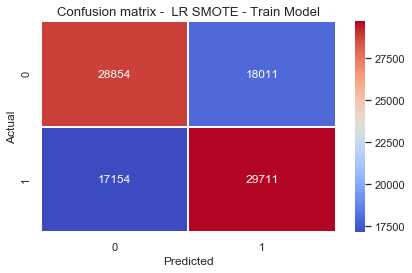


-------------------- SCORES --------------------------
Accuracy Score  : 0.6248
Precision Score : 0.6226
Recall Score    : 0.6340
Sensitivity     : 0.6272
Specificity     : 0.6226
 AUC Score      : 0.6248



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.63      0.62      0.62     46865
         1.0       0.62      0.63      0.63     46865

   micro avg       0.62      0.62      0.62     93730
   macro avg       0.62      0.62      0.62     93730
weighted avg       0.62      0.62      0.62     93730



In [935]:
# confusion matrix again 
confusion = metrics.confusion_matrix(df_train_predicted.response,df_train_predicted.predicted_response)
draw_confusion_matrix(confusion," LR SMOTE - Train Model")

#print the metrics.
model_report(df_train_predicted.response,df_train_predicted.predicted_response)

#### Model 1 - ROC Curve - Train Model

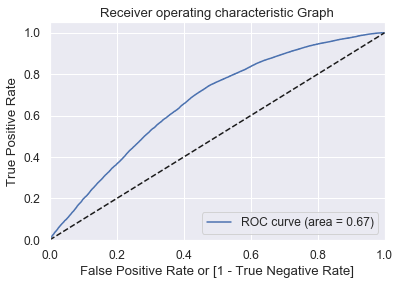

In [936]:
fpr, tpr, thresholds = metrics.roc_curve(df_train_predicted.response,
                                         df_train_predicted.predicted_response_prob, 
                                         drop_intermediate = False)

# Call ROC curve function.
draw_roc(df_train_predicted.response,df_train_predicted.predicted_response_prob)

#### **Observations** 
> - Following are the metrics obtained from the predictions using Model 1 - SMOTE Logistic Regression Model;
  - Accuracy Score  : `0.6248`
  - Precision Score : `0.6226`
  - Recall Score    : `0.6340`
  - Sensitivity     : `0.6272`
  - Specificity     : `0.6226`
  - AUC Score       : `0.6248`
> - The Area under the curve for the model is ***`0.67`***.

### Model 1 - LR -SMOTE Model (RFE Feature) - Test Predictions scores & ROC Curve

In [937]:
#Build the test data for predictions.
X_test_lr = smt_test_data_X[res_cols]
y_test_lr = smt_test_data_y['y']

#Build the final LR model based on the final RFE.
tsm_test_final = sm.add_constant(X_test_lr)

#Predict
y_test_predicted = res_final.predict(tsm_test_final)

#build actual response & predicted response
df_test_predicted = pd.DataFrame({'response':y_test_lr.values, 'predicted_response_prob':y_test_predicted})
df_test_predicted['ID'] = y_test_lr.index

#Creating new column 'predicted_response' with 1 if Conversion_Prob > 0.5 else 0
df_test_predicted['predicted_response'] =df_test_predicted.predicted_response_prob.map(lambda x: 1 if x > 0.5 else 0)

#### Model 1 - Confusion Matrix & Model Metrics - Test Model

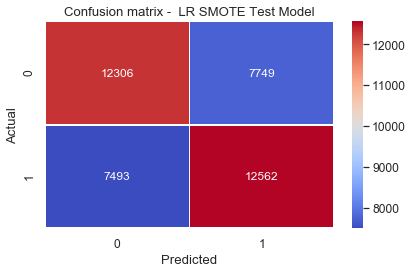


-------------------- SCORES --------------------------
Accuracy Score  : 0.6200
Precision Score : 0.6185
Recall Score    : 0.6264
Sensitivity     : 0.6215
Specificity     : 0.6185
 AUC Score      : 0.6200



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.62      0.61      0.62     20055
         1.0       0.62      0.63      0.62     20055

   micro avg       0.62      0.62      0.62     40110
   macro avg       0.62      0.62      0.62     40110
weighted avg       0.62      0.62      0.62     40110



In [938]:
# confusion matrix again 
confusion = metrics.confusion_matrix(df_test_predicted.response,df_test_predicted.predicted_response)
draw_confusion_matrix(confusion," LR SMOTE Test Model")

#print the metrics.
model_report(df_test_predicted.response,df_test_predicted.predicted_response)

#### Model  1 - ROC Curve - Test Model

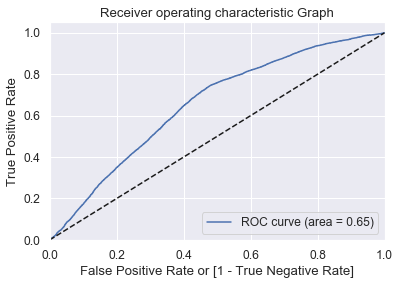

In [939]:
fpr, tpr, thresholds = metrics.roc_curve(df_test_predicted.response,
                                         df_test_predicted.predicted_response_prob, 
                                         drop_intermediate = False)

# Call ROC curve function.
draw_roc(df_test_predicted.response,df_test_predicted.predicted_response_prob)

#### **Observations** 
> - Following are the metrics obtained from the predictions using Model 1 - SMOTE Logistic Regression Model for the test set;

  - Accuracy Score  : ***`0.6200`***
  - Precision Score : ***`0.6185`***
  - Recall Score    : ***`0.6264`***
  - Sensitivity     : ***`0.6215`***
  - Specificity     : ***`0.6185`***
  - AUC Score       : ***`0.6200`***
 

> - The Area under the curve for the model is ***`0.65`***.

### Model 1 - LR SMOTE Model (RFE) - Other Metrics

In [940]:
print("Logistic Regresson Model-1 "+" log_loss is %2.3f" % 
        log_loss(df_test_predicted.response,df_test_predicted.predicted_response_prob))

#Auc score
print("Logistic Regresson Model-1 "+" auc is %2.3f" % auc(fpr, tpr))

idx = np.min(np.where(tpr > 0.95))
print("Using a threshold of %.3f " % thresholds[idx] + 
      "guarantees a sensitivity of %.3f " % tpr[idx] +  
      "and a specificity of %.3f" % (1-fpr[idx]) + 
      ", i.e. a false positive rate of %.2f%%." % (np.array(fpr[idx])*100))

Logistic Regresson Model-1  log_loss is 0.658
Logistic Regresson Model-1  auc is 0.654
Using a threshold of 0.313 guarantees a sensitivity of 0.950 and a specificity of 0.166, i.e. a false positive rate of 83.35%.


####  Calculation of Optimal Cut-off Point

 - Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [941]:
def Find_Optimal_Cutoff(target, predicted):
    fpr, tpr, threshold = roc_curve(target, predicted)
    i = np.arange(len(tpr)) 
    roc = pd.DataFrame({'tf' : pd.Series(tpr-(1-fpr), index=i), 'threshold' : pd.Series(threshold, index=i)})
    roc_t = roc.ix[(roc.tf-0).abs().argsort()[:1]]

    return list(roc_t['threshold']) 

In [942]:
#Finding Optimual Cut-off Point
# create columns with different probability cutoffs 

df_test_predicted_opt = df_test_predicted.copy()
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    df_test_predicted_opt[i]= df_test_predicted_opt.predicted_response_prob.map(lambda x: 1 if x > i else 0)
    
df_test_predicted_opt.head()

,response,predicted_response_prob,ID,predicted_response,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.0000,0.3768,0,0,1,1,1,1,0,0,0,0,0,0
1,0.0000,0.7319,1,1,1,1,1,1,1,1,1,1,0,0
2,0.0000,0.2594,2,0,1,1,1,0,0,0,0,0,0,0
3,0.0000,0.2354,3,0,1,1,1,0,0,0,0,0,0,0
4,0.0000,0.4823,4,0,1,1,1,1,1,0,0,0,0,0


In [943]:
# Find optimal probability threshold
threshold = Find_Optimal_Cutoff(df_test_predicted['response'], df_test_predicted['predicted_response_prob'])
print(threshold)

[0.5028787223312329]


         prob  accuracy  sensitivity  specitivity
0.0000 0.0000    0.5000       1.0000       0.0000
0.1000 0.1000    0.5000       1.0000       0.0000
0.2000 0.2000    0.5011       0.9999       0.0024
0.3000 0.3000    0.5465       0.9612       0.1319
0.4000 0.4000    0.6166       0.7954       0.4379
0.5000 0.5000    0.6200       0.6264       0.6136
0.6000 0.6000    0.5753       0.3539       0.7967
0.7000 0.7000    0.5183       0.0950       0.9416
0.8000 0.8000    0.5015       0.0093       0.9936
0.9000 0.9000    0.5000       0.0000       1.0000


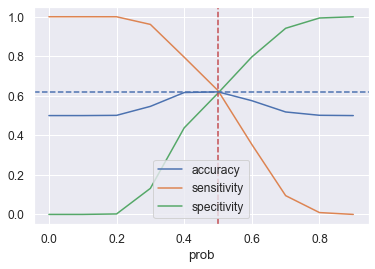

In [944]:
# calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensitivity','specitivity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(df_test_predicted_opt.response, df_test_predicted_opt[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]

print(cutoff_df)

#  plot accuracy sensitivity and specificity for various probabilities.
ax = cutoff_df.plot.line(x='prob', y=['accuracy','sensitivity','specitivity'])
ax.axvline(x=0.50, color='r', linestyle='--', label='optimum cutoff')
ax.axhline(y=0.62, color='b', linestyle='--', label='optimum cutoff')
plt.show();

#### **Observations**  

> -  From the curve above,`50%` (threshold - `0.5028787223312329`) is the optimum point to take it as a cutoff probability.
> -  So, no change required to the default cut off of 50% for which we will get Test score of  
  - Accuracy Score  : ***`62%`***
  - Precision Score : ***`62`***
  - Recall Score    : ***`63%`***
  - Sensitivity     : ***`62%`***
  - Specificity     : ***`62%`***
  - AUC Score       : ***`62%`***
  - ROC Curve Area  : ***`65%`***
  
> - Log_loss is ***`66%`***
> - Using a threshold of ***`0.313`*** guarantees a sensitivity of ***`0.950`*** and a specificity of ***`0.166`***, i.e. a false positive rate of ***`83.35%`***.

#### Calculate Lift & Gain and cumulative Lift

In [945]:
def lift_gain(df_p,response,pred_res_prob):
    # Create Decile column
    df_p['decile'] = pd.qcut(df_p[pred_res_prob],10,labels=np.arange(10, 0, -1))
    
    # Calculate the actual number of prospects who has responded postiviely in each decile.
    df_lift = df_p[df_p[response]==1].groupby('decile')[response].count().reset_index()

    # Number of predictors in each decile
    df_lift_pred = df_p.groupby('decile')[pred_res_prob].count().reset_index()

    #Rename the columns to total
    new_col = "total"                         
    df_lift_pred.rename({pred_res_prob:new_col}, axis=1, inplace=True)
    
    # Merge the two data frames - Total Number of prospects and actual prospects.
    df_lift_final = df_lift_pred.merge(df_lift,on = 'decile')

    # sort on Decile.
    df_lift_final = df_lift_final.sort_values(['decile'], ascending=False)

    #calculate the cumulative response.
    df_lift_final['cumresp'] = df_lift_final[response].cumsum()

    # Calculate the gain.
    df_lift_final['gain'] = 100*(df_lift_final['cumresp']/sum(df_lift_final[response]))

    # calculate the cumlative lift.
    df_lift_final['cumlift'] = df_lift_final['gain']/(df_lift_final['decile'].astype('int')*(100/10))

    # return cumlative lift values for each deciles.
    return(df_lift_final)

In [946]:
# call lift_gain function.
lift = lift_gain(df_test_predicted,'response','predicted_response_prob')
lift

,decile,total,response,cumresp,gain,cumlift
9,1,4011,2516,2516,12.5455,1.2545
8,2,4011,2638,5154,25.6993,1.2850
7,3,4011,2458,7612,37.9556,1.2652
6,4,4011,2360,9972,49.7233,1.2431
5,5,4011,2420,12392,61.7901,1.2358
4,6,4011,2293,14685,73.2236,1.2204
3,7,4011,1607,16292,81.2366,1.1605
2,8,4011,1498,17790,88.7061,1.1088
1,9,4011,1341,19131,95.3927,1.0599
0,10,4011,924,20055,100.0000,1.0000


#### Plot Gain Chart to calculate the lift & gain

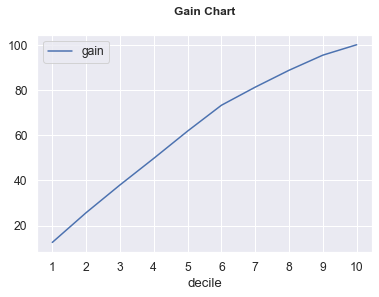

In [947]:
# Plot the Gain chart .
ax = lift.plot.line(x='decile', y=['gain']) 
ax.set_title("Gain Chart",fontdict={'fontsize':12,'fontweight':'bold'},loc='center',pad=20)
#ax.grid(False)
ax.set_xticks(np.arange(0,10,1))
ax.set_xticklabels(['1','2','3','4','5','6','7','8','9','10'],minor=False)
plt.show();

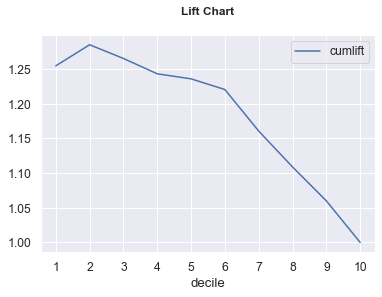

In [948]:
# Plot the lift chart .
ax = lift.plot.line(x='decile', y=['cumlift']) 
ax.set_title("Lift Chart",fontdict={'fontsize':12,'fontweight':'bold'},loc='center',pad=20)
#ax.grid(False)
ax.set_xticks(np.arange(0,10,1))
ax.set_xticklabels(['1','2','3','4','5','6','7','8','9','10'],minor=False)
plt.show();

#### **Observations** 
> - The Lift & gain chart for the LR Model is created with results.

In [949]:
 ## End as of 17-August-2019

## Model 2: LR Model USING RFECV (using SMOTE)
> -  Feature ranking with recursive feature elimination and cross-validation
> -  Create the RFE object and compute a cross-validated score.
> -  identify supporting features in the order of ranking 
> - The "accuracy" scoring is proportional to the number of correct classifications

Fitting estimator with 34 features.
Fitting estimator with 33 features.
Fitting estimator with 32 features.
Fitting estimator with 31 features.
Fitting estimator with 30 features.
Fitting estimator with 29 features.
Fitting estimator with 28 features.
Fitting estimator with 27 features.
Fitting estimator with 26 features.
Fitting estimator with 25 features.
Fitting estimator with 24 features.
Fitting estimator with 23 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.
Fitting estimator with 20 features.
Fitting estimator with 19 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Optimal number of features: 13
Selected features: ['Education_Bachelor', 'Education_Masters', 'Education_Phd', 'Education_Professional', 'Residence_Company provided', 'Residence_Owned', 'Residence_Rented', 'Avg_CC_Util_12_Months', 'Num_PL_Trade

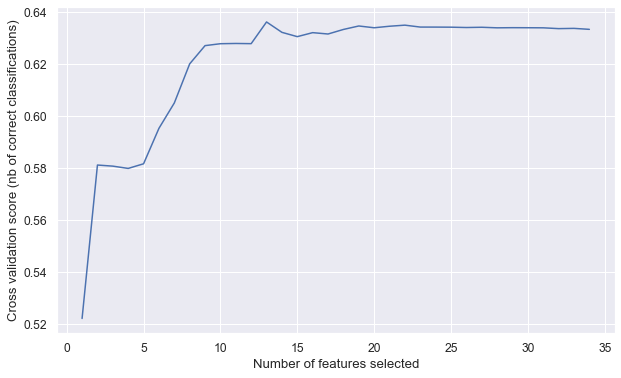

In [950]:
# Feature ranking using RFECV (Recurive feature eleimination using cross validation)
warnings.filterwarnings('ignore')
from sklearn.feature_selection import RFECV

rfecv = RFECV(estimator=LogisticRegression(random_state=100), step=1, cv=5, scoring='accuracy',n_jobs=-1,verbose=5)
rfecv.fit(smt_train_data_X,smt_train_data_y)

print("Optimal number of features: %d" % rfecv.n_features_)
print('Selected features: %s' % list(X.columns[rfecv.support_]))

# Plot number of features VS. cross-validation scores
plt.figure(figsize=(10,6))
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show();

#### **Observations** 
> - The number of Optimum features selected using RFECV is 13.
> - We build Logistic using SMOTE Sample data with above set of features 
> - Evalulate the model and apply to test data set for the performance.

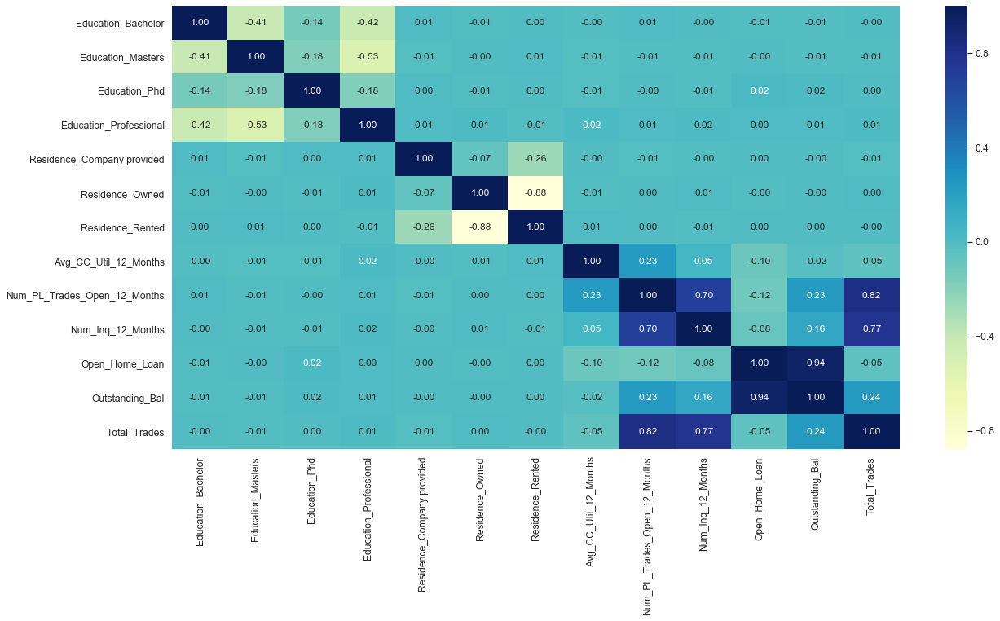

In [951]:
# Number features selected with RECFV is 23.
#Selected_features = ['Education_Bachelor', 'Education_Masters', 'Education_Phd', 'Education_Professional', 
#                    'Profession_SE_PROF', 'Residence_Company provided', 'Residence_Living with Parents', 
#                    'Residence_Owned', 'Residence_Rented', 'Income', 'Num_Months_Cur_Res',
#                    'Num_Months_Cur_Comp', 'Num_30_DPD_6_Months', 'Num_90_DPD_12_Months',
#                    'Num_60_DPD_12_Months', 'Avg_CC_Util_12_Months', 'Num_PL_Trades_Open_6_Months',
#                    'Num_PL_Trades_Open_12_Months', 'Num_Inq_6_Months', 'Num_Inq_12_Months', 'Open_Home_Loan', 
#                    'Outstanding_Bal', 'Total_Trades']

Selected_features = ['Education_Bachelor', 'Education_Masters', 'Education_Phd', 
                     'Education_Professional', 'Residence_Company provided', 
                     'Residence_Owned', 'Residence_Rented', 'Avg_CC_Util_12_Months', 
                     'Num_PL_Trades_Open_12_Months', 'Num_Inq_12_Months', 
                     'Open_Home_Loan', 'Outstanding_Bal', 'Total_Trades']

# Train Data.
X_train_rfecv = smt_train_data_X[Selected_features]
y_train_rfecv = smt_train_data_y['y']

plt.subplots(figsize=(20, 10))
sns.heatmap(X_train_rfecv.corr(), annot=True,fmt='0.2f',annot_kws={'size':12}, cmap="YlGnBu")
plt.show();

#### **Observations** 
>- Except few variables like `Num_Inq_12_Months`, `Num_PL_Trades_Open_12_Months`, and `Total_Trades` all other variables have no collinearity.

### Model 2 - Build a LR Model RFECV best features.

In [952]:
# check classification scores of logistic regression
logreg = LogisticRegression(random_state=100)
logreg.fit(X_train_rfecv, y_train_rfecv)

# Test data.
X_test_rfecv = smt_test_data_X[Selected_features]
y_test_rfecv = smt_test_data_y['y']

#Apply the LR model to test.
y_rfecv_final_pred = logreg.predict(X_test_rfecv)
y_rfecv_final_pred_proba = logreg.predict_proba(X_test_rfecv)[:, 1]
[fpr, tpr, thr] = roc_curve(y_test_rfecv, y_rfecv_final_pred_proba)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=100, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

### Model 2 - Evaluate the test prediction

In [953]:
# Calculate the predictions.
df_rfecv_test_pred = pd.DataFrame({'response':y_test_rfecv, 'predicted_response_prob':y_rfecv_final_pred_proba})
df_rfecv_test_pred['ID'] = y_test_rfecv.index

#Creating new column 'predicted_response' with 1 if Conversion_Prob > 0.5 else 0
df_rfecv_test_pred['predicted_response'] =df_rfecv_test_pred.predicted_response_prob.map(lambda x: 1 if x > 0.5 else 0)
df_rfecv_test_pred.head()

,response,predicted_response_prob,ID,predicted_response
0,0.0000,0.2265,0,0
1,0.0000,0.7385,1,1
2,0.0000,0.3024,2,0
3,0.0000,0.2726,3,0
4,0.0000,0.5327,4,1


### Model 2 - Confusion matrix & Model Report.

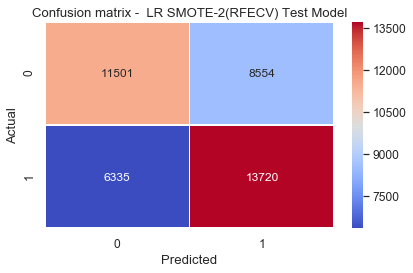


-------------------- SCORES --------------------------
Accuracy Score  : 0.6288
Precision Score : 0.6160
Recall Score    : 0.6841
Sensitivity     : 0.6448
Specificity     : 0.6160
 AUC Score      : 0.6288



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.64      0.57      0.61     20055
         1.0       0.62      0.68      0.65     20055

   micro avg       0.63      0.63      0.63     40110
   macro avg       0.63      0.63      0.63     40110
weighted avg       0.63      0.63      0.63     40110



In [954]:
# confusion matrix again 
confusion = metrics.confusion_matrix(df_rfecv_test_pred.response,df_rfecv_test_pred.predicted_response)
draw_confusion_matrix(confusion," LR SMOTE-2(RFECV) Test Model")

#print the metrics.
model_report(df_rfecv_test_pred.response,df_rfecv_test_pred.predicted_response)

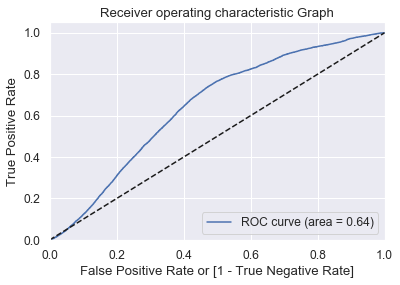

In [955]:
fpr, tpr, thresholds = metrics.roc_curve(df_rfecv_test_pred.response,
                                         df_rfecv_test_pred.predicted_response_prob, 
                                         drop_intermediate = False)

# Call ROC curve function.
draw_roc(df_rfecv_test_pred.response, df_rfecv_test_pred.predicted_response_prob)

### Model 2 - Other Metrics.

In [956]:
print("Logistic Regresson-2 "+" log_loss is %2.3f" % 
        log_loss(df_rfecv_test_pred.response, df_rfecv_test_pred.predicted_response_prob))

#Auc score
print("Logistic Regresson-2 "+" auc is %2.3f" % auc(fpr, tpr))

idx = np.min(np.where(tpr > 0.95))
print("Using a threshold of %.3f " % thresholds[idx] + 
      "guarantees a sensitivity of %.3f " % tpr[idx] +  
      "and a specificity of %.3f" % (1-fpr[idx]) + 
      ", i.e. a false positive rate of %.2f%%." % (np.array(fpr[idx])*100))

Logistic Regresson-2  log_loss is 0.659
Logistic Regresson-2  auc is 0.645
Using a threshold of 0.304 guarantees a sensitivity of 0.950 and a specificity of 0.148, i.e. a false positive rate of 85.21%.


#### **Observations** 
> -  From the curve above,willth `50%` is the optimum point to take it as a cutoff probability.

> -  So, no change required to the default cut off of 50% for which we will get Test score of  
  - Accuracy Score  : ***`0.6288`***
  - Precision Score : ***`0.6160`***
  - Recall Score    : ***`0.6841`***
  - Sensitivity     : ***`0.6448`***
  - Specificity     : ***`0.6160`***
  - AUC Score       : ***`0.6288`***
> - The ROC (Area under the curve): ***`0.64`***
> - Log_loss        : ***`0.659`***
> - Using a threshold of 0.304 guarantees a sensitivity of ***`0.950`*** and a specificity of ***`0.148`***, i.e. a false positive rate of ***`85.21%`***.

In [175]:
# End as of 18-August-2019

## Model 3: Linear SVM  
> -  SVM needs all numeric attributes so reusing the SMOTE balanced train dataset.

### MODEL-3.1:  SVM Linear Model with Class_Weight as 'Balanced' and hyperparameter C=1.

In [957]:

# We use original normalized original data frame X_train & y_train
# validate using X_test & y_test
print("X_train = ",X_train.shape," y_train = ",y_train.shape)
print("X_test = ",X_test.shape," y_test = ",y_test.shape)

# Create a copy of original X_test & X_test for SVM Model.
X_train_svm =X_train.copy() ; y_train_svm = y_train.copy()
X_test_svm = X_test.copy() ; y_test_svm = y_test.copy()

X_train =  (48906, 34)  y_train =  (48906,)
X_test =  (20961, 34)  y_test =  (20961,)


In [958]:
# Linear Model with Class_Weight as 'Balanced' and hyperparameter C as 1.
start = time.time()

# Create and the fit the model to train data.
svc=SVC(C=1,class_weight='balanced',random_state=100) #Default hyperparameters
svc.fit(X_train_svm,y_train_svm)

# predict using test 
y_pred=svc.predict(X_test_svm)
end=time.time()

#check time taken to run the model
print("Time taken :",(end-start))

SVC(C=1, cache_size=200, class_weight='balanced', coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=100,
  shrinking=True, tol=0.001, verbose=False)

Time taken : 247.97399997711182


Accuracy Score: 0.6633748389866896


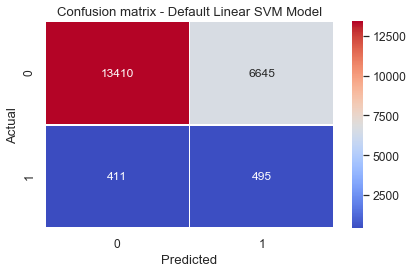


-------------------- SCORES --------------------------
Accuracy Score  : 0.6634
Precision Score : 0.0693
Recall Score    : 0.5464
Sensitivity     : 0.9703
Specificity     : 0.0693
 AUC Score      : 0.6075



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.97      0.67      0.79     20055
         1.0       0.07      0.55      0.12       906

   micro avg       0.66      0.66      0.66     20961
   macro avg       0.52      0.61      0.46     20961
weighted avg       0.93      0.66      0.76     20961



In [959]:
##print the Test accuracy & confusion matrix and model report.
print('Accuracy Score:', metrics.accuracy_score(y_test_svm,y_pred))
cm1=confusion_matrix(y_test_svm,y_pred)
draw_confusion_matrix(cm1,"Default Linear SVM Model")
model_report(y_test_svm,y_pred)

### MODEL-3.2:  SVM Linear Model with Class_Weight as 'Balanced' and hyperparameter C=10.

In [960]:
# Linear Model with Class_Weight as 'Balanced' and hyperparameter C as 10.
start = time.time()

# Create and the fit the model to train data.
svc=SVC(C=10,class_weight='balanced',random_state=100) #Default hyperparameters
svc.fit(X_train_svm,y_train_svm)

# predict using test 
y_pred=svc.predict(X_test_svm)
end=time.time()

#check time taken to run the model
print("Time taken :",(end-start))

SVC(C=10, cache_size=200, class_weight='balanced', coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=100,
  shrinking=True, tol=0.001, verbose=False)

Time taken : 313.7408800125122


Accuracy Score: 0.7874624302275655


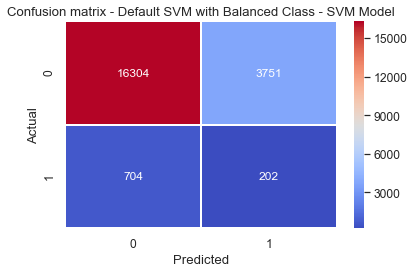


-------------------- SCORES --------------------------
Accuracy Score  : 0.7875
Precision Score : 0.0511
Recall Score    : 0.2230
Sensitivity     : 0.9586
Specificity     : 0.0511
 AUC Score      : 0.5180



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.96      0.81      0.88     20055
         1.0       0.05      0.22      0.08       906

   micro avg       0.79      0.79      0.79     20961
   macro avg       0.50      0.52      0.48     20961
weighted avg       0.92      0.79      0.85     20961



In [961]:
##print the Test accuracy & confusion matrix and model report.
print('Accuracy Score:', metrics.accuracy_score(y_test_svm,y_pred))
cm1=confusion_matrix(y_test_svm,y_pred)
draw_confusion_matrix(cm1,"Default SVM with Balanced Class - SVM Model")
model_report(y_test_svm,y_pred)

##  Model 4 - Random Forests  


### Split Original Data  in to Train and Test

In [962]:
#Use original data (not normalised ) for Random Forest and Decision Trees.
df_unnorm.shape
df_unnorm.head()

(69867, 35)

,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Target,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented
0,48,0,1,2.0000,40.0000,113,56,0.0000,0,0,0,0,0,0,4.0000,1.0000,2,0,0,0,0,1.0000,"2,999,395.0000",4,0,1,0,0,0,1,0,0,0,0,1
1,31,1,1,4.0000,55.0000,112,46,0.0000,0,0,0,0,0,0,3.0000,1.0000,2,0,0,0,0,0.0000,"3,078.0000",5,0,0,0,0,1,0,1,0,0,0,1
2,32,1,0,2.0000,46.0000,104,49,0.0000,0,0,0,0,0,0,7.0000,0.0000,0,0,0,0,0,1.0000,"3,004,972.0000",2,0,1,0,0,0,0,1,0,0,0,1
3,43,1,1,1.0000,53.0000,94,53,0.0000,0,0,0,0,0,0,11.0000,1.0000,1,0,0,0,0,1.0000,"3,355,373.0000",4,1,1,0,0,0,0,0,0,0,0,1
4,35,0,1,5.0000,44.0000,112,43,0.0000,0,0,0,0,0,0,12.0000,0.0000,1,0,0,0,0,1.0000,"3,014,283.0000",4,0,0,0,0,1,1,0,0,0,0,1


In [963]:
# Putting Independent feature variable to X
#X = df_unnorm.drop(['Appl_ID','Target'],axis=1)
X = df_unnorm.drop(['Target'],axis=1)
# Putting response variable to y
y = df_unnorm['Target']

#Check the shape of df
X.shape
y.shape

(69867, 34)

(69867,)

In [964]:
# Splitting Train and Test.
np.random.seed(0)
X_train, X_test,y_train,y_test =  train_test_split(X,y, train_size=0.7,
                                                   test_size=0.3,random_state=100)

In [965]:
#Check X_train
X_train.shape
y_train.shape

#check train data.
X_train.head()
y_train.head()

(48906, 34)

(48906,)

,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented
45071,55,0,1,1.0000,9.0000,122,7,0,0,0,1,0,0,113.0000,1.0000,3,1,2,1,1,0.0000,"623,136.0000",3,0,1,0,0,0,0,0,0,0,1,0
5295,31,1,0,1.0000,9.0000,120,44,0,0,0,0,0,0,8.0000,1.0000,2,0,0,0,0,0.0000,"23,430.0000",3,0,1,0,0,0,1,0,0,0,0,1
6910,53,0,1,3.0000,9.0000,120,48,0,0,0,0,1,1,0.0000,0.0000,0,0,0,0,0,0.0000,0.0000,0,0,0,1,0,0,0,0,0,0,0,1
32986,33,0,1,1.0000,18.0000,6,51,0,0,0,0,0,0,21.0000,8.0000,13,3,4,5,13,0.0000,"776,947.0000",28,0,0,0,0,1,0,1,0,0,0,1
54700,55,1,1,4.0000,40.0000,25,8,1,1,1,1,1,2,4.0000,4.0000,11,3,6,3,3,1.0000,"4,076,020.0000",12,0,1,0,0,0,0,0,0,0,0,1


45071   1.0000
5295    0.0000
6910    0.0000
32986   0.0000
54700   0.0000
Name: Target, dtype: float64

###  Model 4.1 - Random Forest Model - With SMOTE 

####  Model 4.1 - Random Forest - Create SMOTE Samples

In [966]:
### Create an instance of SMOTE.
smote = SMOTE(random_state=100)

# Generate SMOTE Sample data
X_train_smote,y_train_smote = smote.fit_sample(X_train,y_train)
X_test_smote,y_test_smote =   smote.fit_sample(X_test,y_test)

#print the distribution of samples before & after SMOTE.
print('Distribution of class labels before sampling - Train ', Counter(y_train))
print('Distribution of class labels After sampling - Train', Counter(y_train_smote))
print('Distribution of class labels before sampling - Test', Counter(y_test))
print('Distribution of class labels After sampling - Test', Counter(y_test_smote))

Distribution of class labels before sampling - Train  Counter({0.0: 46865, 1.0: 2041})
Distribution of class labels After sampling - Train Counter({1.0: 46865, 0.0: 46865})
Distribution of class labels before sampling - Test Counter({0.0: 20055, 1.0: 906})
Distribution of class labels After sampling - Test Counter({0.0: 20055, 1.0: 20055})


In [967]:
X_train_smote.shape
y_train_smote.shape

(93730, 34)

(93730,)

###  Model 4.1 - Random Forest Model - Basic Random Forest Classifier Model 

In [968]:
#fit the balance class weight model in train.
start = datetime.datetime.now()

clf_rf_basic = RandomForestClassifier(random_state=100)

# Train the default model.
clf_rf_basic.fit(X_train_smote, y_train_smote)

#predict the model using test.
y_rf_pred_basic = clf_rf_basic.predict(X_test_smote)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=100, verbose=0, warm_start=False)

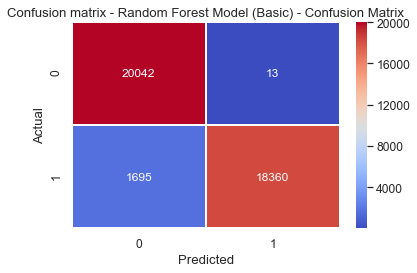


-------------------- SCORES --------------------------
Accuracy Score  : 0.9574
Precision Score : 0.9993
Recall Score    : 0.9155
Sensitivity     : 0.9220
Specificity     : 0.9993
 AUC Score      : 0.9574



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96     20055
         1.0       1.00      0.92      0.96     20055

   micro avg       0.96      0.96      0.96     40110
   macro avg       0.96      0.96      0.96     40110
weighted avg       0.96      0.96      0.96     40110



In [969]:
# Confusion Matrix - Random Forest LR  Model - Test
cnf_matrix8= metrics.confusion_matrix(y_test_smote,y_rf_pred_basic)

# Draw Confusion Matrix for the SMOTE LR Model.
draw_confusion_matrix(cnf_matrix8,"Random Forest Model (Basic) - Confusion Matrix")

# Print Other scores and Classification Report.
model_report(y_test_smote,y_rf_pred_basic)

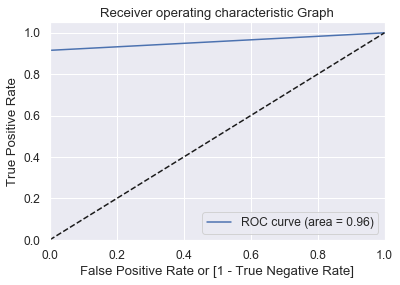

In [970]:
# Draw ROC Curve for Random Forest Model - Test
draw_roc(y_test_smote,y_rf_pred_basic)

#### **Observations**
> - We have created a very basic Random Forest Classifer model with default parameters.
> - Train the model X_train and made prediction on the test.
> - We get the test accuracy of `0.96` and AUC Score of `0.96`

#### **Inference**
> - We run the Random Forest again by fine tuning each of the parameters using grid search and come up with an optimal set of values. The tuned parameters are are ;
    - `max_depth`
    - `n_estimators`
    - `max_features`
    - `min_samples_leaf`
    - `min_samples_split`
> - Also, finally we used class_weight parameter to handle the class imbalances in sample.

###  Model 4.2 - Random Forest - Generic Functions for GridSerach Tuning and Plot Best Params 

####  Model 4.2 - Generic Function - Handling GridSearchCV 5 fold CV 

In [971]:
# A common function to carry GridSearchCV 5 fold cross validation.
def rfGridSearchCVTuning(parameters, X_train_smote, y_train_smote, n_folds = 5, n_jobs = -1):
    np.random.seed(100)
    param = list(parameters.keys())[0]
    print("param: ", param)
    # Train the training data
    if((param == 'max_features') | (param == 'n_estimators')):
        rfc = RandomForestClassifier(max_depth=4,random_state=100)
    else:
        rfc = RandomForestClassifier(random_state=100)
        
    rfc = GridSearchCV(rfc, parameters, 
                       cv=n_folds, 
                       scoring="accuracy",
                       return_train_score=True,
                       verbose=5,
                       n_jobs = n_jobs)
        
    rfc.fit(X_train_smote, y_train_smote)
    return rfc

####  Model 4.2 - Generic Function - Plot Best CV parameter results for Tuning 

In [972]:
def plot_rf_best_params(parameters,rfc):
    param = list(parameters.keys())[0]
    if(len(list(parameters.keys())) == 1):
        scores = rfc.cv_results_
        scoreParam = "param_" + list(parameters.keys())[0] 

        plt.figure()
        plt.plot(scores[scoreParam].astype('float32'), 
                 scores["mean_train_score"], 
                 label="training accuracy")
        
        plt.plot(scores[scoreParam].astype('float32'), 
                 scores["mean_test_score"], 
                 label="test accuracy")
        plt.xlabel(param)
        plt.ylabel("Accuracy")
        plt.legend()
        plt.grid(True)
        plt.show();

####  Model 4.2 - Random Forest - Tuning max_depth Parameter

In [975]:
# Best Max dept parameters.
parameters = {'max_depth': range(2,30, 5)}
cv_rf_1 = rfGridSearchCVTuning(parameters, X_train_smote, y_train_smote)

param:  max_depth
Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.6s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.6s finished


In [976]:
# print the best scores and params.
gridsearch_best_params(cv_rf_1)


----- Best Score & params ----
Best score: 0.9770511042355703 
Best Param: {'max_depth': 27}


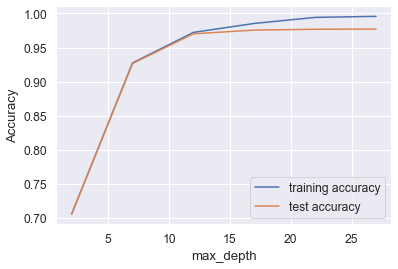

In [977]:
# Plot the Best max depth parameter.
plot_rf_best_params(parameters,cv_rf_1)

#### **Observations**<br>
>- We have best max_depth parameter of `27` and having best score of  `0.97`. As in test increases until 27 and then drops off.

#### Model 4.2 - Random Forest - Tuning n_estimators Parameter

In [978]:
# Tuning Hyper parameter n_estimators for the RF model.
parameters = {'n_estimators': range(100, 1500, 400)}
cv_rf_2 = rfGridSearchCVTuning(parameters, X_train_smote, y_train_smote)

param:  n_estimators
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  18 out of  20 | elapsed:  5.0min remaining:   33.0s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  6.0min finished



----- Best Score & params ----
Best score: 0.8222660834311319 
Best Param: {'n_estimators': 1300}


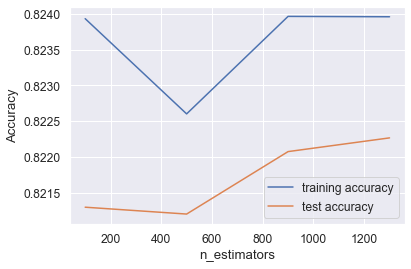

In [979]:
# print the best scores and params.
gridsearch_best_params(cv_rf_2)

# Plot the Best max depth parameter.
plot_rf_best_params(parameters,cv_rf_2)

#### **Observations**<br>
>- We have best n_estimators parameter `1300` and having best score of  `0.822`. The process takes around 6 minutes to complete.

#### Model 4.2 - Random Forest - Tuning max_features Parameter

In [983]:
# Maximum Features 
parameters = {'max_features': [4, 8, 14, 20, 24, 28, 32, 34]}

cv_rf_3 = rfGridSearchCVTuning(parameters, X_train_smote, y_train_smote)

param:  max_features
Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:   29.7s finished



----- Best Score & params ----
Best score: 0.8721433905899926 
Best Param: {'max_features': 24}


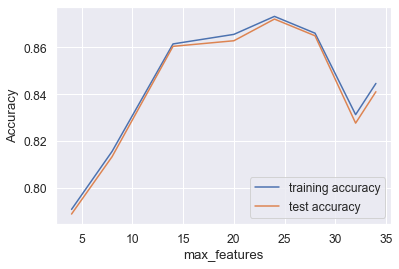

In [984]:
# print the best scores and params.
gridsearch_best_params(cv_rf_3)

# Plot the Best max depth parameter.
plot_rf_best_params(parameters,cv_rf_3)

#### **Observations**<br>
>- We have best max_features parameter of `24` and having best score of  `0.872`. 

#### Model 4.2 - Random Forest - min_samples_leaf Parameter

In [987]:
parameters = {'min_samples_leaf': range(50, 400, 40)}
cv_rf_4 = rfGridSearchCVTuning(parameters, X_train_smote, y_train_smote)

param:  min_samples_leaf
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:   18.7s finished



----- Best Score & params ----
Best score: 0.9642270351008215 
Best Param: {'min_samples_leaf': 50}


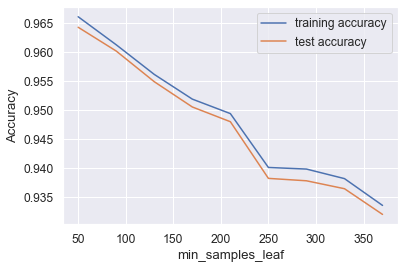

In [988]:
# print the best scores and params.
gridsearch_best_params(cv_rf_4)

# Plot the Best max depth parameter.
plot_rf_best_params(parameters,cv_rf_4)

#### **Observations**<br>
>- We have best min_samples_leaf parameter of `50`and having best score of  `0.964`. 

#### Model 4.2 - Random Forest - min_samples_split Parameter

In [993]:
parameters = {'min_samples_split': range(200, 500, 50)}
cv_rf_5 = rfGridSearchCVTuning(parameters, X_train_smote, y_train_smote)

param:  min_samples_split
Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.4s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.4s finished



----- Best Score & params ----
Best score: 0.9678117998506348 
Best Param: {'min_samples_split': 200}


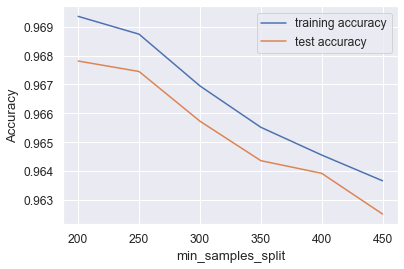

In [994]:
# print the best scores and params.
gridsearch_best_params(cv_rf_5)

# Plot the Best max depth parameter.
plot_rf_best_params(parameters,cv_rf_5)

#### **Observations**<br>
>- We have best min_samples_split parameter of `200`and having best score of  `0.968`. 

## Model 4.2 - Random Forest - Use the Optimal Parameters for Model

In [995]:
# Random Forest Optimal Parameters Model - Train set.

# Random Forest Classifier model optimuum parameters.
rfc_train_final = RandomForestClassifier(bootstrap=True,
                                       random_state=100,
                                           max_depth=27,
                                      n_estimators=1300,
                                        max_features=24,
                                    min_samples_leaf=50, 
                                  min_samples_split=200,
                                              n_jobs=-1,
                                               verbose=1)

# fit final rf model
rfc_train_final.fit(X_train_smote,y_train_smote)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   26.8s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 1300 out of 1300 | elapsed:  3.0min finished


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=27, max_features=24, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=200,
            min_weight_fraction_leaf=0.0, n_estimators=1300, n_jobs=-1,
            oob_score=False, random_state=100, verbose=1, warm_start=False)

In [996]:
# Making predictions for train & test with the final model
y_pred_rfc_train_final = rfc_train_final.predict(X_train_smote) 
y_pred_rfc_test_final = rfc_train_final.predict(X_test_smote)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 1300 out of 1300 | elapsed:    4.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 1300 out of 1300 | elapsed:    1.8s finished


####  Model 4.2 - Random Forest  - Use the Optimal Parameters for Model - Train - Prediction Scores & Report

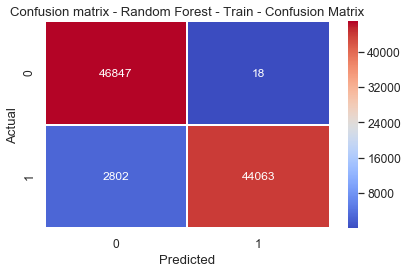


-------------------- SCORES --------------------------
Accuracy Score  : 0.9699
Precision Score : 0.9996
Recall Score    : 0.9402
Sensitivity     : 0.9436
Specificity     : 0.9996
 AUC Score      : 0.9699



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97     46865
         1.0       1.00      0.94      0.97     46865

   micro avg       0.97      0.97      0.97     93730
   macro avg       0.97      0.97      0.97     93730
weighted avg       0.97      0.97      0.97     93730



In [997]:
# Build Confusion Matrix - Random Forest Tuned hyper parameter Model - Test predictions.
cnf_matrix_train_rf= metrics.confusion_matrix(y_train_smote,y_pred_rfc_train_final)

# Draw Confusion Matrix for the Random Forest Tuned Hyper parameter Model - Test
draw_confusion_matrix(cnf_matrix_train_rf,"Random Forest - Train - Confusion Matrix")

# Print Other scores and Classification Report.
model_report(y_train_smote,y_pred_rfc_train_final) 

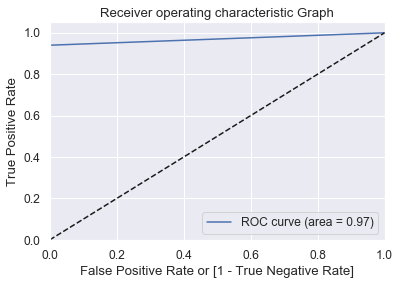

In [998]:
# Draw ROC Curve for Random Forest Final Tuned Hyper Parameter Model - Train set.
draw_roc(y_train_smote,y_pred_rfc_train_final)

####  Model 4.2 - Random Forest  - Use the Optimal Parameters for Model - Test - Prediction Scores & Report

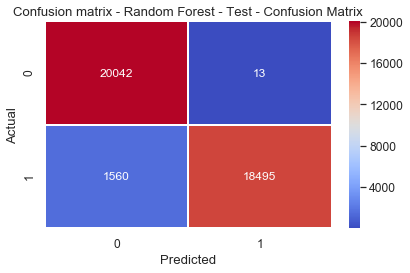


-------------------- SCORES --------------------------
Accuracy Score  : 0.9608
Precision Score : 0.9993
Recall Score    : 0.9222
Sensitivity     : 0.9278
Specificity     : 0.9993
 AUC Score      : 0.9608



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96     20055
         1.0       1.00      0.92      0.96     20055

   micro avg       0.96      0.96      0.96     40110
   macro avg       0.96      0.96      0.96     40110
weighted avg       0.96      0.96      0.96     40110



In [999]:
# Build Confusion Matrix - Random Forest Tuned hyper parameter Model - Test predictions.
cnf_matrix_test_rf= metrics.confusion_matrix(y_test_smote,y_pred_rfc_test_final)

# Draw Confusion Matrix for the Random Forest Tuned Hyper parameter Model - Test
draw_confusion_matrix(cnf_matrix_test_rf,"Random Forest - Test - Confusion Matrix")

# Print Other scores and Classification Report.
model_report(y_test_smote,y_pred_rfc_test_final)

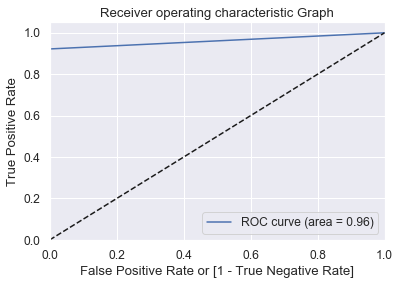

In [1000]:
# Draw ROC Curve for Random Forest Final Tuned Hyper Parameter Model 
draw_roc(y_test_smote,y_pred_rfc_test_final)

#### **Observations**
>- We have fine tuned import hyper parameters for the Random Forest Classifer and obtain best optimal hyperparameters as below;
   - max_depth=***`27`***
   - n_estimators=***`1300`***
   - max_features=***`24`***
   - min_samples_leaf=***`50`***
   - min_samples_split=***`200`***
>- We have obtained ;
   - accuracy score for train and test set as ***`0.96`*** respecively.
   - Precision Score for train and test as ***`0.99`*** respectively.
   - Recall Score for train and test set as ***`0.94` and `0.92`*** respectively.
   - AUC Score for train and test set as ***`0.96` *** respectively.

#### **Inference**
> - We will run the model again with class_weight parameter.

### Model 4.3 - Random Forest - Use the Optimal Parameters with class_weight parameter (class imbalance)

In [1001]:
 
#start_time = datetime.datetime.now()

# Random Forest Classifier model optimuum parameters.
rfc_class_final = RandomForestClassifier(bootstrap=True,
                                        random_state=100,
                                            max_depth=27,
                                       n_estimators=1300,
                                         max_features=24,
                                     min_samples_leaf=50, 
                                   min_samples_split=200,
                                 class_weight='balanced',
                                              n_jobs=-1,
                                              verbose=1)


# fit final Random Forest final class weight parameter model
rfc_class_final.fit(X_train_smote,y_train_smote)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   26.4s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 1300 out of 1300 | elapsed:  3.0min finished


RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=27, max_features=24,
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=50,
            min_samples_split=200, min_weight_fraction_leaf=0.0,
            n_estimators=1300, n_jobs=-1, oob_score=False,
            random_state=100, verbose=1, warm_start=False)

In [1002]:
# Making predictions for the final model (both train and test)
y_pred_rfc_train_class_final = rfc_class_final.predict(X_train_smote)
y_pred_rfc_test_class_final =  rfc_class_final.predict(X_test_smote)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed:    4.2s
[Parallel(n_jobs=4)]: Done 1300 out of 1300 | elapsed:    4.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 1242 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 1300 out of 1300 | elapsed:    1.8s finished


####  Model 4.3 - Random Forest  - Use the Optimal Parameters with class_weight - Train - Prediction Scores 

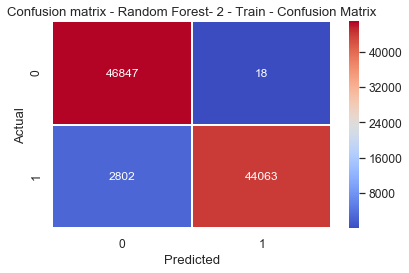


-------------------- SCORES --------------------------
Accuracy Score  : 0.9699
Precision Score : 0.9996
Recall Score    : 0.9402
Sensitivity     : 0.9436
Specificity     : 0.9996
 AUC Score      : 0.9699



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97     46865
         1.0       1.00      0.94      0.97     46865

   micro avg       0.97      0.97      0.97     93730
   macro avg       0.97      0.97      0.97     93730
weighted avg       0.97      0.97      0.97     93730



In [1003]:
# Build Confusion Matrix - Random Forest Tuned hyper parameter with class weight parameter Model - Train predictions.
cnf_matrix_train_class_rf= metrics.confusion_matrix(y_train_smote,y_pred_rfc_train_class_final)

# Draw Confusion Matrix for the Random Forest Tuned Hyper parameter Model - Train
draw_confusion_matrix(cnf_matrix_train_class_rf,
                      "Random Forest- 2 - Train - Confusion Matrix")

# Print Other scores and Classification Report.
model_report(y_train_smote,y_pred_rfc_train_class_final)

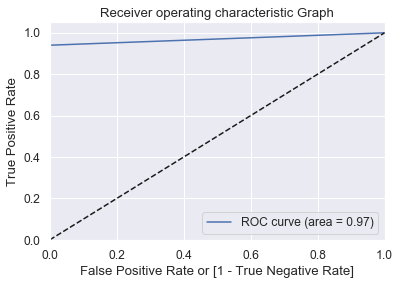

In [1004]:
# Draw ROC Curve for Random Forest Tuned hyper parameter with class weight parameter Model - Train
draw_roc(y_train_smote,y_pred_rfc_train_class_final)

#### Model 4.3 - Random Forest - Use the Optimal Parameters with class_weight - Test - Prediction Scores 

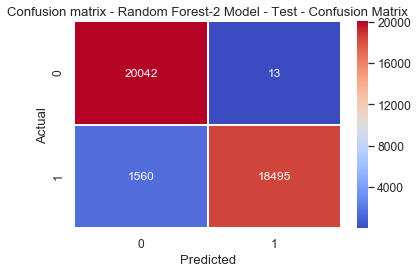


-------------------- SCORES --------------------------
Accuracy Score  : 0.9608
Precision Score : 0.9993
Recall Score    : 0.9222
Sensitivity     : 0.9278
Specificity     : 0.9993
 AUC Score      : 0.9608



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96     20055
         1.0       1.00      0.92      0.96     20055

   micro avg       0.96      0.96      0.96     40110
   macro avg       0.96      0.96      0.96     40110
weighted avg       0.96      0.96      0.96     40110



In [1005]:
# Build Confusion Matrix - Random Forest Tuned hyper parameter with class weight parameter Model - Test predictions.
cnf_matrix_test_class_rf= metrics.confusion_matrix(y_test_smote,y_pred_rfc_test_class_final)

# Draw Confusion Matrix for the Random Forest Tuned Hyper parameter Model - Test
draw_confusion_matrix(cnf_matrix_test_class_rf, "Random Forest-2 Model - Test - Confusion Matrix")

# Print Other scores and Classification Report.
model_report(y_test_smote,y_pred_rfc_test_class_final)

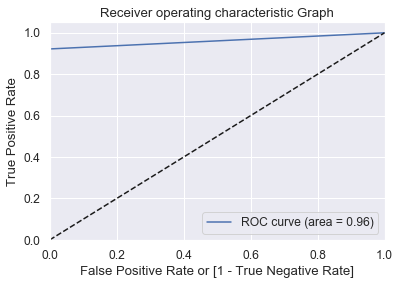

In [1006]:
# Draw ROC Curve for Random Forest Tuned hyper parameter with class weight parameter Model - Test
draw_roc(y_test_smote,y_pred_rfc_test_class_final)

###### **Observations**
>- We have re modelled optimal hyper parameters model by including class_weighet parameter.
>- We have obtained an improved score for both train and test set as follows;
   - accuracy score for train and test set as `0.96` respecively.
   - Precision Score for train and test as `0.99` and `0.99` respectively.
   - Recall Score has imrpoved for train and test set as `0.94` and `0.92` respectively.
   - AUC Score for train and test set as `0.96` respectively.
> - As we notice that both AUC and recall score has improved considerably using class_weight parameter.
> - However, high accuracy means the tendency to overfit and skewness towards one particular class.
#### **inferences**
> - A Model with SMOTE Samples to balance the minority class. 
> - Let us see the Important Features predicted using the Random Forest Model.

### Model 4.3 - Random Forest - Identify Important Features 

In [1007]:
# Fetch the important features from the model.
#importances = rf_smote.feature_importances_
importances = rfc_class_final.feature_importances_

feature_df = pd.DataFrame(X_train.columns.values[(np.argsort(importances)[::-1])[:15]]) # the top 14 features
feature_df.columns =['Features'] 

#print top 14 features.
feature_df

,Features
0,Num_30_DPD_6_Months
1,Profession_SAL
2,Num_90_DPD_12_Months
3,Num_90_DPD_6_Months
4,Num_Inq_6_Months
5,Num_60_DPD_6_Months
6,Education_Masters
7,Education_Professional
8,Education_Bachelor
9,Num_30_DPD_12_Months


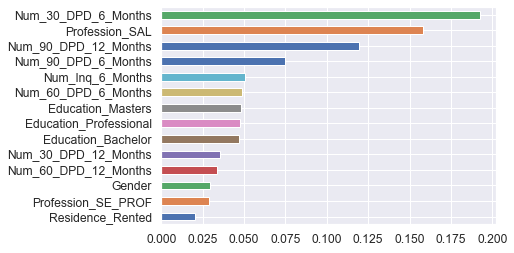

In [1008]:
X =X_train.columns.values

weights = pd.Series(importances,
                 index=X)

weights.sort_values()[-14:].plot(kind = 'barh');

#### **Observations**
> -  From Random forest Models the important features and most important predictor features are ;
  - `Num_30_DPD_6_Months`
  - `Profession_SAL`
  - `Num_90_DPD_12_Months`
  - `Num_Inq_6_Months`
  - `Num_90_DPD_6_Months`
  - `Num_60_DPD_6_Months`
  - `Education_Masters`
  - `Education_Professional`
  - `Education_Bachelor`
  - `Num_30_DPD_12_Months`
  - `Num_60_DPD_12_Months`
  - `Profession_SE_PROF`
  - `Gender`
  - `Profession_SE_PROF`
  - `Residence_Rented`

###  Model 5.1 - Decision Tree  - With SMOTE 
>-  It is very obvious the Decision Tree include other features, if any, with important Features.

In [1009]:
# Importing decision tree classifier confusion matrix and classification report libraries.
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Importing required packages for visualization Decision Trees.
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [1012]:
# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(max_depth=5,random_state=100)

#Fit the default dt model to train.
dt_default.fit(X_train_smote, y_train_smote)

# Making predictions with test
y_pred_dt_default = dt_default.predict(X_test_smote)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

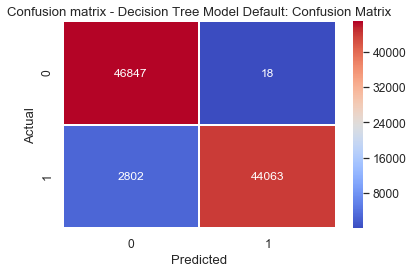


-------------------- SCORES --------------------------
Accuracy Score  : 0.8703
Precision Score : 0.9532
Recall Score    : 0.7788
Sensitivity     : 0.8130
Specificity     : 0.9532
 AUC Score      : 0.8703



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.81      0.96      0.88     20055
         1.0       0.95      0.78      0.86     20055

   micro avg       0.87      0.87      0.87     40110
   macro avg       0.88      0.87      0.87     40110
weighted avg       0.88      0.87      0.87     40110



In [1013]:
# Build and print Confusion Matrix and accuracy - Default Decision Tree Model 
cnf_matrix_train_class_dt = metrics.confusion_matrix(y_test_smote,y_pred_dt_default)
draw_confusion_matrix(cnf_matrix_train_rf,"Decision Tree Model Default: Confusion Matrix")

# Print scores and Classification Report.
model_report(y_test_smote,y_pred_dt_default)

#### **Observations**
> - A decision tree model with default parameters and max_depth=5 is created and obtain an accuracy score `0.87`.
> - We can imporve the model by fine tuning hyperparameters.

### Model 5.2 -  Decision Tree with GridSearchCV using SMOTE (Best Hyperparameter) 

In [1014]:
#Get the feature set.
X_train.shape
features = list(X_train.columns)

(48906, 34)

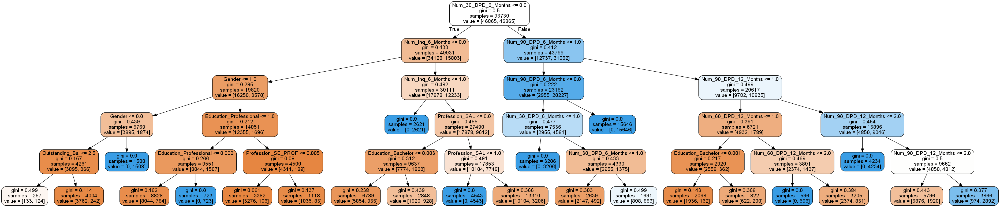

In [1015]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

#### Model 5.2 -  Tuning hyper parameter max_depth 
> Let's first try to find the optimum values for max_depth and understand how the value of max_depth affects the decision tree.

In [1018]:
# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree1 = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
gs_tree1 = GridSearchCV(dtree1, parameters, 
                    cv=5, 
                    n_jobs=-1,
                    verbose=1,
                    scoring="accuracy")
#fit the train.
gs_tree1.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 39 candidates, totalling 195 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 195 out of 195 | elapsed:   48.3s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': range(1, 40)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='accuracy',
       verbose=1)


----- Best Score & params ----
Best score: 0.9612610690280593 
Best Param: {'max_depth': 13}


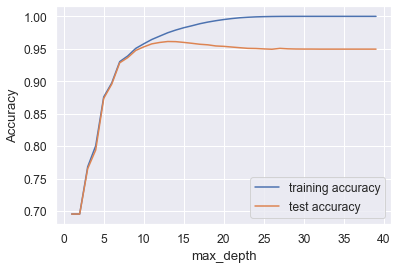

In [1019]:
# print the best scores and params.
gridsearch_best_params(gs_tree1)

# Plot the Best max depth parameter.
plot_rf_best_params(parameters,gs_tree1)

#### **Observations**<br>
>- We have best max_depth parameter of `13`and having best score of  `0.961`. As in test increases until 13 and then drops off.

####  Model 5.2 -  Tuning hyper parameter min_samples_leaf

In [1022]:
# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree2 = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
gs_tree2 = GridSearchCV(dtree2, parameters, 
                    cv=5, 
                    n_jobs=-1,
                    verbose=1,
                   scoring="accuracy")

#fit the grid to train 
gs_tree2.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.3s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'min_samples_leaf': range(5, 200, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=1)


----- Best Score & params ----
Best score: 0.9616558199082471 
Best Param: {'min_samples_leaf': 5}


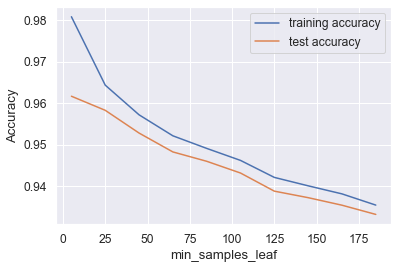

In [1023]:
# print the best scores and params.
gridsearch_best_params(gs_tree2)

# Plot the Best max depth parameter.
plot_rf_best_params(parameters,gs_tree2)

#### **Observations**
> - A decision tree model with best param min_samples_leaf of `5` to get accuracy score of `0.961`.

####  Model 5.2 -  Tuning hyper parameter min_samples_split

In [1026]:
# parameters to build the model on
parameters = {'min_samples_split': range(5, 200, 20)}

# instantiate the model
dtree3 = DecisionTreeClassifier(criterion = "gini", 
                               random_state = 100)

# fit tree on training data
gs_tree3 = GridSearchCV(dtree3, parameters,
                    cv=5, 
                    n_jobs=-1,
                    verbose=1,
                   scoring="accuracy")
gs_tree3.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'min_samples_split': range(5, 200, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=1)


----- Best Score & params ----
Best score: 0.9625520110957004 
Best Param: {'min_samples_split': 45}


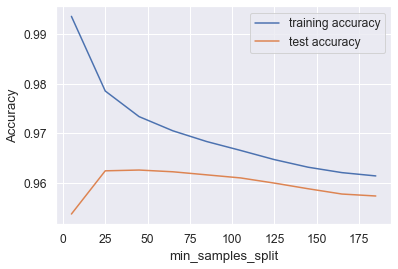

In [1027]:
# print the best scores and params.
gridsearch_best_params(gs_tree3)

# Plot the Best max depth parameter.
plot_rf_best_params(parameters,gs_tree3)

#### **Observations**
>- We have best min_samples_split parameter of `45`and having best score of  `0.963`.

####  Model 5.2 -  Grid Search to Find Optimal Hyperparameters

In [1028]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

# Instantiate the grid search model
dtree_final = DecisionTreeClassifier(random_state=100)
gs_final = GridSearchCV(estimator = dtree_final, param_grid = param_grid, 
                          cv = 5, n_jobs=-1,verbose = 1)

# Fit the grid search to the data
gs_final.fit(X_train_smote,y_train_smote)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:   19.9s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': range(5, 15, 5), 'min_samples_leaf': range(50, 150, 50), 'min_samples_split': range(50, 150, 50), 'criterion': ['entropy', 'gini']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [1029]:
# print the best scores and params.
gridsearch_best_params(gs_final)


----- Best Score & params ----
Best score: 0.9474661261069028 
Best Param: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 50, 'min_samples_split': 50}


####  Model 5.2 -  Running the DT model with best parameters obtained from grid search (max_depth=10)

In [1030]:
# model with optimal hyperparameters
dt_clf_final = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)
dt_clf_final.fit(X_train_smote, y_train_smote) 

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [1031]:
# make prediction on Test Data using dt_clf_final
y_pred_dt_final=dt_clf_final.predict(X_test_smote)

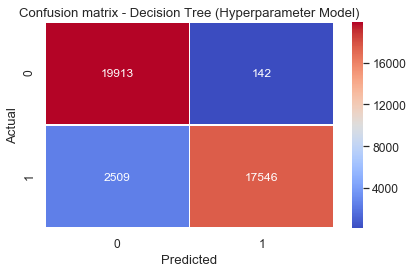


-------------------- SCORES --------------------------
Accuracy Score  : 0.9339
Precision Score : 0.9920
Recall Score    : 0.8749
Sensitivity     : 0.8881
Specificity     : 0.9920
 AUC Score      : 0.9339



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.89      0.99      0.94     20055
         1.0       0.99      0.87      0.93     20055

   micro avg       0.93      0.93      0.93     40110
   macro avg       0.94      0.93      0.93     40110
weighted avg       0.94      0.93      0.93     40110



In [1032]:
# Build and print Confusion Matrix and accuracy - final tuned hyper parameter model
cnf_matrix_test_dt = metrics.confusion_matrix(y_test_smote,y_pred_dt_final)
draw_confusion_matrix(cnf_matrix_test_dt,"Decision Tree (Hyperparameter Model)")

# Print scores and Classification Report.
model_report(y_test_smote,y_pred_dt_final)

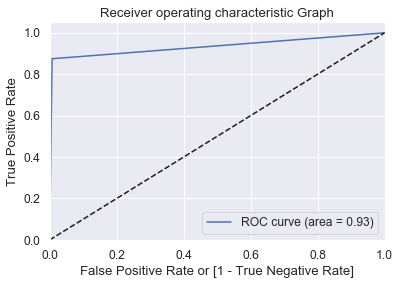

In [1033]:
# ROC curve for the final Decision Tree Model.
draw_roc(y_test_smote,y_pred_dt_final)

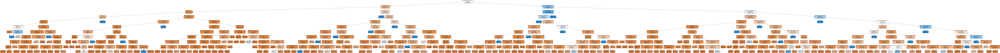

In [1034]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(dt_clf_final, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

####  Model 5.2 -  Decision Tree model with best parameters obtained from grid search (max_depth=10)

In [1047]:
# tree with max_depth = 4
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)

clf_gini.fit(X_train_smote, y_train_smote)

# score
print(clf_gini.score(X_test_smote,y_test_smote))

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

0.9339067564198454


In [1048]:
# make prediction on Test Data using dt_clf_final
y_pred_train_clf_gini =clf_gini.predict(X_train_smote)
y_pred_test_clf_gini=clf_gini.predict(X_test_smote)

#### Model 5.2 -   Decision Tree - Final - Train  Prediction Scores 

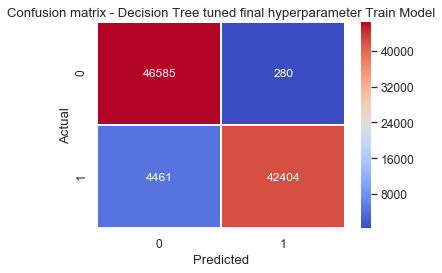


-------------------- SCORES --------------------------
Accuracy Score  : 0.9494
Precision Score : 0.9934
Recall Score    : 0.9048
Sensitivity     : 0.9126
Specificity     : 0.9934
 AUC Score      : 0.9494



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.91      0.99      0.95     46865
         1.0       0.99      0.90      0.95     46865

   micro avg       0.95      0.95      0.95     93730
   macro avg       0.95      0.95      0.95     93730
weighted avg       0.95      0.95      0.95     93730



In [1049]:
# Build and print Confusion Matrix and accuracy - final tuned hyper parameter model(max_depth=4,criterion=gini)
cnf_matrix_train_gini_dt = metrics.confusion_matrix(y_train_smote,y_pred_train_clf_gini)
draw_confusion_matrix(cnf_matrix_train_gini_dt,
                      "Decision Tree tuned final hyperparameter Train Model")

# Print scores and Classification Report.
model_report(y_train_smote,y_pred_train_clf_gini)

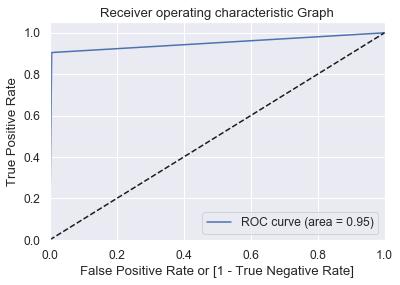

In [1050]:
# ROC curve for the final Test Decision Tree Model.
draw_roc(y_train_smote,y_pred_train_clf_gini)

####  Model 5.2 - Decision Tree - Final- Test Prediction Scores 

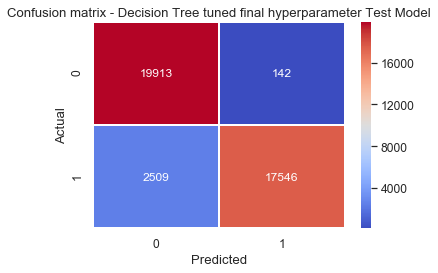


-------------------- SCORES --------------------------
Accuracy Score  : 0.9339
Precision Score : 0.9920
Recall Score    : 0.8749
Sensitivity     : 0.8881
Specificity     : 0.9920
 AUC Score      : 0.9339



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.89      0.99      0.94     20055
         1.0       0.99      0.87      0.93     20055

   micro avg       0.93      0.93      0.93     40110
   macro avg       0.94      0.93      0.93     40110
weighted avg       0.94      0.93      0.93     40110



In [1051]:
# Build and print Confusion Matrix and accuracy - final tuned hyper parameter model(max_depth=4,criterion=gini)
cnf_matrix_test_gini_dt = metrics.confusion_matrix(y_test_smote,y_pred_test_clf_gini)
draw_confusion_matrix(cnf_matrix_test_gini_dt,
                      "Decision Tree tuned final hyperparameter Test Model")

# Print scores and Classification Report.
model_report(y_test_smote,y_pred_test_clf_gini)

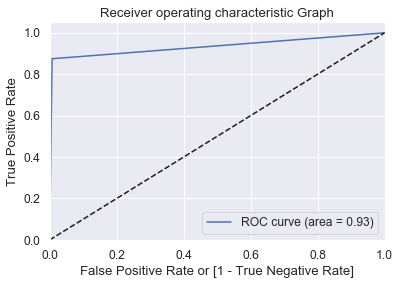

In [1052]:
# ROC curve for the final Test Decision Tree Model.
draw_roc(y_test_smote,y_pred_test_clf_gini)

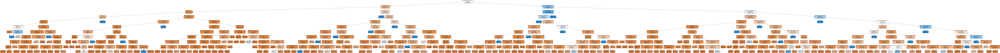

In [1053]:
# plotting tree with max_depth=10
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())
#graph.write_pdf("tree.pdf")

#### **Observations**
>- We have fine tuned import hyper parameters for the Decision Tree and obtain best optimal hyperparameters as below;
   - max_depth=10
   - min_samples_leaf=50
   - min_samples_split=50
>- We have obtained ;
   - accuracy score for train and test set as ~ `0.944` respecively.
   - Precision Score for train and test as ~ `0.992` respectively.
   - Recall Score for train and test set as ~ `0.904` and `0.874` respectively.
   - AUC Score for train and test set as ~`0.94` respectively.
#### **Inference**
> - We will run the model again with class_weight parameter

### Model 5.3 - Decision Tree - Class Weight Parameter. 

In [1054]:
# Create a same final DT model but with class_weight parameter.
# tree with max_depth = 10
clf_bal_gini = DecisionTreeClassifier(criterion = "gini", 
                                      random_state = 100,
                                      max_depth=10, 
                                     min_samples_leaf=50,
                                    min_samples_split=50,
                                class_weight='balanced')
clf_bal_gini.fit(X_train_smote, y_train_smote)

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=10, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [1055]:
# predict train and test.
y_pred_train_bal_gini = clf_bal_gini.predict(X_train_smote)
y_pred_test_bal_gini = clf_bal_gini.predict(X_test_smote)

####  Decision Tree with ClassWeight  - Train - Prediction Scores 

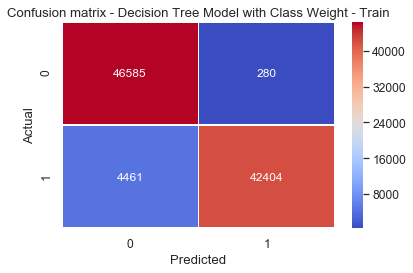


-------------------- SCORES --------------------------
Accuracy Score  : 0.9494
Precision Score : 0.9934
Recall Score    : 0.9048
Sensitivity     : 0.9126
Specificity     : 0.9934
 AUC Score      : 0.9494



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.91      0.99      0.95     46865
         1.0       0.99      0.90      0.95     46865

   micro avg       0.95      0.95      0.95     93730
   macro avg       0.95      0.95      0.95     93730
weighted avg       0.95      0.95      0.95     93730



In [1056]:
# Build Confusion Matrix - Decision Tree Model with ClassWeight - Train predictions.
cnf_matrix_train_bal_dt = metrics.confusion_matrix(y_train_smote,y_pred_train_bal_gini)


# Draw Confusion Matrix for the Decision Tree Model with ClassWeight - Train
draw_confusion_matrix(cnf_matrix_train_bal_dt,
                      "Decision Tree Model with Class Weight - Train")

# Print Other scores and Classy_train,y_pred_train_bal_ginification Report.
model_report(y_train_smote,y_pred_train_bal_gini)

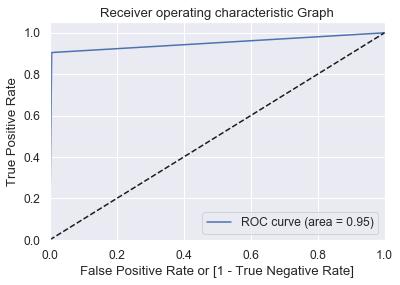

In [1057]:
# Draw ROC Curve for Decision Tree Model - Test
draw_roc(y_train_smote,y_pred_train_bal_gini)

####  Decision Tree with ClassWeight  - Test - Prediction Scores 

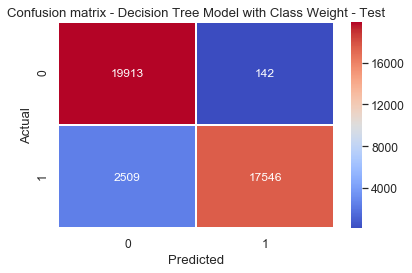


-------------------- SCORES --------------------------
Accuracy Score  : 0.9339
Precision Score : 0.9920
Recall Score    : 0.8749
Sensitivity     : 0.8881
Specificity     : 0.9920
 AUC Score      : 0.9339



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

         0.0       0.89      0.99      0.94     20055
         1.0       0.99      0.87      0.93     20055

   micro avg       0.93      0.93      0.93     40110
   macro avg       0.94      0.93      0.93     40110
weighted avg       0.94      0.93      0.93     40110



In [1058]:
# Build Confusion Matrix - Decision Tree Model - Test predictions.
cnf_matrix_test_bal_dt = metrics.confusion_matrix(y_test_smote,y_pred_test_bal_gini)

# Draw Confusion Matrix for the Decision Tree Model - Test
draw_confusion_matrix(cnf_matrix_test_bal_dt,
                      "Decision Tree Model with Class Weight - Test")

# Print Other scores and Classification Report.
model_report(y_test_smote,y_pred_test_bal_gini)

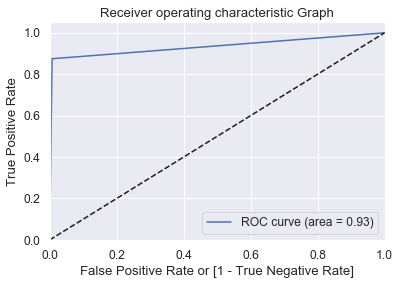

In [1059]:
# Draw ROC Curve for Decision Tree Model - Test
draw_roc(y_test_smote,y_pred_test_bal_gini)

#### **Observations**
>- We have re modelled optimal hyper parameters model by including class_weighet parameter.
>- We have obtained an improved score for both train and test set as follows;
   - accuracy score for train and test set as `0.94` respecively.
   - Precision Score for train and test as `0.99`  respectively.
   - Recall Score has imrpoved for train and test set as `0.90` and `0.87` respectively.
   - AUC Score for train and test set as `0.94` respectively.
#### **inferences**
> - Let us see the Important Features predicted using the Decision Tree Model.

### Decision Tree - Identify Important Features 

In [1060]:
# Fetch the important features from the model.
importances = clf_bal_gini.feature_importances_

feature_df = pd.DataFrame(X_train.columns.values[(np.argsort(importances)[::-1])[:15]]) # the top 14 fetures.
feature_df.columns =['Features'] 

#print top 14 features.
feature_df

,Features
0,Num_30_DPD_6_Months
1,Profession_SAL
2,Num_90_DPD_12_Months
3,Num_90_DPD_6_Months
4,Num_Inq_6_Months
5,Education_Bachelor
6,Gender
7,Num_60_DPD_12_Months
8,Education_Professional
9,Residence_Rented


#### **Summary**

## Model 6 : Build Logistic Regression Models for WOE 

> - Since our data is highly imbalanced , we use SMOTE and SMOTE TOMEK for class imbalance.
  - Firstly, We oversample the minority data using SMOTE and build a LR Model using WOE.
  - Secondly, We oversample and undersample data using SMOTE TOMEK and build LR Model using WOE
  - Make predictions on Train and Test Data on sample data
  - Evaluate Metrics & Model reports
  - Predict Score cards

In [1061]:
import woeBinningPandas
import scorecardpy as sc

### Prepare data for Binning and Scorecard

In [1062]:
# Traditional Credit Scoring Using Logistic Regression
dt_score = sc.var_filter(df_final_woe, y="Target")

# check the filtered data
dt_score.head()

Variable filtering on 69867 rows and 35 columns in 00:00:48 
16 variables are removed


,Num_60_DPD_6_Months,Num_PL_Trades_Open_6_Months,Num_Months_Cur_Res,Num_Trades_Open_6_Months,Num_90_DPD_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Inq_12_Months,Num_60_DPD_12_Months,Income,Num_30_DPD_6_Months,Num_Trades_Open_12_Months,Outstanding_Bal,Total_Trades,Num_90_DPD_12_Months,Num_Months_Cur_Comp,Target
0,0,0,113,1.0000,0,0,0,0,4.0000,0,0,40.0000,0,2,"2,999,395.0000",4,0,56,0
1,0,0,112,1.0000,0,0,0,0,3.0000,0,0,55.0000,0,2,"3,078.0000",5,0,46,0
2,0,0,104,0.0000,0,0,0,0,7.0000,0,0,46.0000,0,0,"3,004,972.0000",2,0,49,0
3,0,0,94,1.0000,0,0,0,0,11.0000,0,0,53.0000,0,1,"3,355,373.0000",4,0,53,0
4,0,0,112,0.0000,0,0,0,0,12.0000,0,0,44.0000,0,1,"3,014,283.0000",4,0,43,0


### Calculate Bins 

In [1063]:
# woe binning 
bins = sc.woebin(dt_score, y="Target")

Binning on 69867 rows and 19 columns in 00:00:12


In [1064]:
# Seggregate bins found in to a data frame.
df_woe_bins = pd.DataFrame()
n_woe_keys = len(bins.keys())
bins_woe_values = list(bins.values())

# Append to df_woe_bins
for i in range(n_woe_keys-1):
    df_woe_bins = df_woe_bins.append(bins_woe_values[i])

In [254]:
#df_woe_bins_sorted = df_woe_bins.sort_values(by='total_iv',ascending=False).groupby('variable')
#df_woe_bins_sorted

df_woe_bins_sorted = df_woe_bins.groupby(['variable']) \
                         .apply(lambda x: x.sort_values(['total_iv'], ascending = False)).reset_index(drop=True)

df_woe_bins_sorted.head()

,variable,bin,count,count_distr,good,bad,badprob,woe,bin_iv,total_iv,breaks,is_special_values
0,Avg_CC_Util_12_Months,"[-inf,14.0)",33275,0.4763,32547,728,0.0219,-0.6774,0.1621,0.2875,14.0,False
1,Avg_CC_Util_12_Months,"[14.0,18.0)",5580,0.0799,5397,183,0.0328,-0.2614,0.0048,0.2875,18.0,False
2,Avg_CC_Util_12_Months,"[18.0,inf)",31012,0.4439,28976,2036,0.0657,0.4672,0.1205,0.2875,inf,False
3,Income,"[-inf,9.0)",10214,0.1462,9627,587,0.0575,0.3254,0.0180,0.0430,9.0,False
4,Income,"[9.0,32.0)",30997,0.4437,29600,1397,0.0451,0.0693,0.0022,0.0430,32.0,False


### Plot bins using scorecard function

{'Avg_CC_Util_12_Months': <Figure size 432x288 with 2 Axes>,
 'Income': <Figure size 432x288 with 2 Axes>,
 'Num_30_DPD_12_Months': <Figure size 432x288 with 2 Axes>,
 'Num_30_DPD_6_Months': <Figure size 432x288 with 2 Axes>,
 'Num_60_DPD_12_Months': <Figure size 432x288 with 2 Axes>,
 'Num_60_DPD_6_Months': <Figure size 432x288 with 2 Axes>,
 'Num_90_DPD_12_Months': <Figure size 432x288 with 2 Axes>,
 'Num_90_DPD_6_Months': <Figure size 432x288 with 2 Axes>,
 'Num_Inq_12_Months': <Figure size 432x288 with 2 Axes>,
 'Num_Inq_6_Months': <Figure size 432x288 with 2 Axes>,
 'Num_Months_Cur_Comp': <Figure size 432x288 with 2 Axes>,
 'Num_Months_Cur_Res': <Figure size 432x288 with 2 Axes>,
 'Num_PL_Trades_Open_12_Months': <Figure size 432x288 with 2 Axes>,
 'Num_PL_Trades_Open_6_Months': <Figure size 432x288 with 2 Axes>,
 'Num_Trades_Open_12_Months': <Figure size 432x288 with 2 Axes>,
 'Num_Trades_Open_6_Months': <Figure size 432x288 with 2 Axes>,
 'Outstanding_Bal': <Figure size 432x288 w

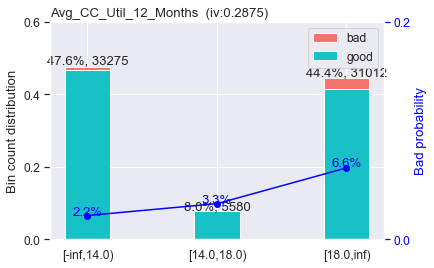

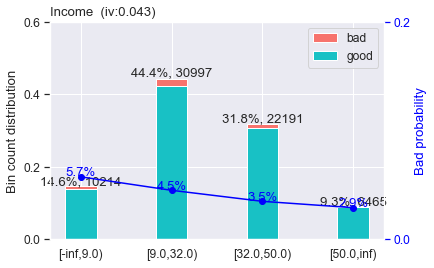

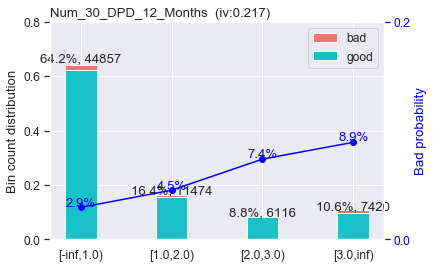

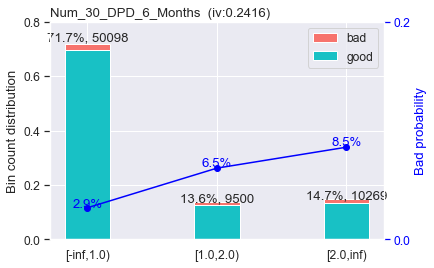

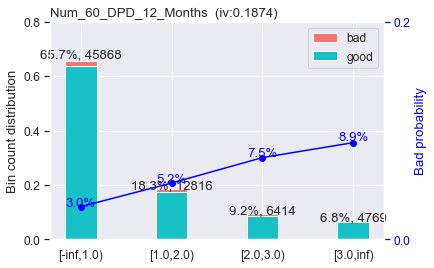

...

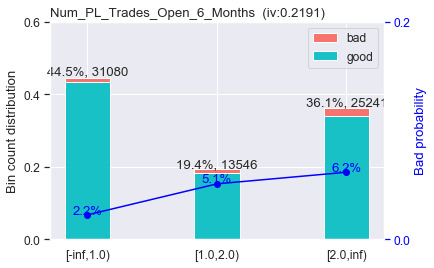

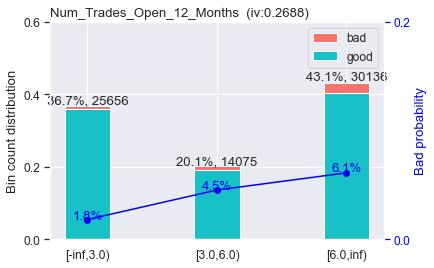

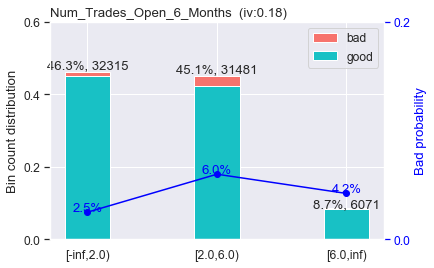

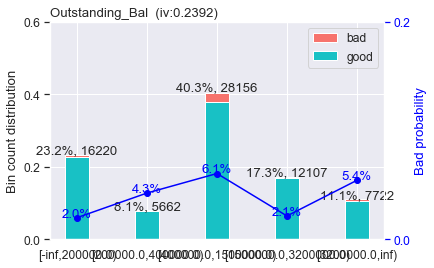

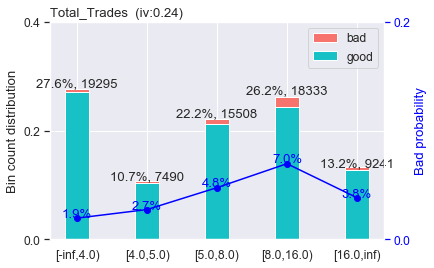

In [1065]:
#Plot the bins.
sc.woebin_plot(bins)

### Split Train & Test for Logistic Regression Model

In [1066]:
# breaking dt_score into train and test
train_split, test_split = sc.split_df(dt_score, 'Target',seed=100).values()

#split the train to X_train and y_train for SMOTE
X_train = train_split.drop(['Target'],axis=1)
y_train = train_split['Target']

#split the test to X_test and y_test
X_test = test_split.drop(['Target'],axis=1)
y_test = test_split['Target']

# check the shapes 
print("X_train:",X_train.shape," y_train : ", y_train.shape)
print("X_test :",X_test.shape," y_train  : ", y_test.shape)

X_train: (48907, 18)  y_train :  (48907,)
X_test : (20960, 18)  y_train  :  (20960,)


### Oversample Data using SMOTE (Synthetic Minority Over Sampling)

In [1067]:
# Create an instance of SMOTE.
smt = SMOTE(random_state=100)
smt_X_train,smt_y_train = smt.fit_sample(X_train,y_train)
smt_X_test,smt_y_test   = smt.fit_sample(X_test,y_test)

#build oversample train data frame for models.
train_cols = X_train.columns
smt_train_data_X = pd.DataFrame(data=smt_X_train,columns=train_cols )
smt_train_data_y= pd.DataFrame(data=smt_y_train,columns=['y'])

#build oversample test data.
test_cols = X_test.columns
smt_test_data_X = pd.DataFrame(data=smt_X_test,columns=test_cols)
smt_test_data_y= pd.DataFrame(data=smt_y_test,columns=['y'])

# the numbers of our data samples in Train & Test.
#print the distribution of samples before & after SMOTE.
print('Distribution of class labels before sampling - Train ', Counter(y_train))
print('Distribution of class labels After sampling - Train', Counter(smt_y_train))
print('Distribution of class labels before sampling - Test', Counter(y_test))
print('Distribution of class labels After sampling - Test', Counter(smt_y_test))
print("\n")

# Check dimension of train & test smote data set.
print("SMOTE X Dimensions: X_train = {} ; X_test  = {}".format(smt_train_data_X.shape,smt_test_data_X.shape))
print("SMOTE y Dimensions: y_train = {} ; y_test  = {}".format(smt_train_data_y.shape,smt_test_data_y.shape))

Distribution of class labels before sampling - Train  Counter({0: 46844, 1: 2063})
Distribution of class labels After sampling - Train Counter({0: 46844, 1: 46844})
Distribution of class labels before sampling - Test Counter({0: 20076, 1: 884})
Distribution of class labels After sampling - Test Counter({0: 20076, 1: 20076})


SMOTE X Dimensions: X_train = (93688, 18) ; X_test  = (40152, 18)
SMOTE y Dimensions: y_train = (93688, 1) ; y_test  = (40152, 1)


In [1068]:
# Concatenate target variables with original train and test data.
smt_train_woe = pd.concat([smt_train_data_X,smt_train_data_y],axis=1)
smt_train_woe.rename(columns={'y':'Target'},inplace=True)

#Concatenate target variables with original Test independent and target variables.
smt_test_woe = pd.concat([smt_test_data_X,smt_test_data_y],axis=1)
smt_test_woe.rename(columns={'y':'Target'},inplace=True)

#verify the smote data sets.
smt_train_woe.shape
smt_test_woe.shape

(93688, 19)

(40152, 19)

### Oversampling and Undersampling  Data using SMOTE TOMEK (Synthetic Minority Over Sampling)

In [1069]:
#Oversampling & Undersampling using SMOTE TOMEK.
columns = X_train.columns

#Build a SMOTE TOMEK Data.
smtmk = SMOTETomek(ratio='auto',random_state=100)
smtmk_X_train,smtmk_y_train = smtmk.fit_sample(X_train,y_train)
smtmk_X_test,smtmk_y_test   = smtmk.fit_sample(X_test,y_test)

#build train data.
smtmk_train_data_X = pd.DataFrame(data=smtmk_X_train,columns=columns )
smtmk_train_data_y = pd.DataFrame(data=smtmk_y_train,columns=['y'])

#build test data.
smtmk_test_data_X = pd.DataFrame(data=smtmk_X_test,columns=columns )
smtmk_test_data_y = pd.DataFrame(data=smtmk_y_test,columns=['y'])

#print the distribution of samples before & after SMOTETomek.
print('Distribution of class labels before sampling - Train ', Counter(y_train))
print('Distribution of class labels After sampling - Train', Counter(smtmk_y_train))
print('Distribution of class labels before sampling - Test', Counter(y_test))
print('Distribution of class labels After sampling - Test', Counter(smtmk_y_test))
print("\n")

# Check dimension of train & test smote tomek data set.
print("SMOTE TOMEK X Dimensions: X_train = {} ; X_test  = {}".format(smtmk_train_data_X.shape,smtmk_test_data_X.shape))
print("SMOTE TOMEK y Dimensions: y_train = {} ; y_test  = {}".format(smtmk_train_data_y.shape,smtmk_test_data_y.shape))

Distribution of class labels before sampling - Train  Counter({0: 46844, 1: 2063})
Distribution of class labels After sampling - Train Counter({0: 41812, 1: 41812})
Distribution of class labels before sampling - Test Counter({0: 20076, 1: 884})
Distribution of class labels After sampling - Test Counter({0: 17192, 1: 17192})


SMOTE TOMEK X Dimensions: X_train = (83624, 18) ; X_test  = (34384, 18)
SMOTE TOMEK y Dimensions: y_train = (83624, 1) ; y_test  = (34384, 1)


In [1070]:
# Concatenate target variables with original train and test data.
smtmk_train_woe = pd.concat([smtmk_train_data_X,smtmk_train_data_y],axis=1)
smtmk_train_woe.rename(columns={'y':'Target'},inplace=True)

#Concatenate target variables with original Test independent and target variables.
smtmk_test_woe = pd.concat([smtmk_test_data_X,smtmk_test_data_y],axis=1)
smtmk_test_woe.rename(columns={'y':'Target'},inplace=True)

#Verify the smote tomek data sets.
smtmk_train_woe.shape
smtmk_test_woe.shape

(83624, 19)

(34384, 19)

## Generic Function - Build LR Model

In [1071]:
def logreg_woe(X,y,bin,maxiter):
    
    from sklearn.linear_model import LogisticRegression
    from sklearn.linear_model.sag import sag_solver

    # converting train and test into woe values for SMOTE 
    train_woe = sc.woebin_ply(X, bin)
    test_woe = sc.woebin_ply(y, bin)
    
    # Prepare X_Train and y_train
    y_train = train_woe.loc[:,'Target']
    X_train = train_woe.loc[:,train_woe.columns != 'Target']
    y_test = test_woe.loc[:,'Target']
    X_test = test_woe.loc[:,train_woe.columns != 'Target']
    
    # build logistic regression model  
    lr = LogisticRegression(penalty='l1', C=0.9, solver='saga', max_iter=maxiter, random_state=100, n_jobs=-1)
    lr.fit(X_train, y_train.values)
    
    # Predic train and test probabilities.
    train_pred_ = lr.predict(X_train)
    test_pred_ = lr.predict(X_test)

    # Get prediction probability scores.
    train_pred_prob_ = lr.predict_proba(X_train)[:,1]
    test_pred_prob_ = lr.predict_proba(X_test)[:,1]
    
    # Return score cards.(Changed from 1/9 to 1/10 as per the amazon credit card scoring link)
    card_ = sc.scorecard(bin, lr,X_train.columns,points0=400,odds0=1/10,pdo=20)
    
    #Return Model predictions
    return (train_pred_,test_pred_,train_pred_prob_,test_pred_prob_,card_,lr)

## MODEL-7 Build LR Model for SMOTE  

In [1072]:
# Call logreg function for SMOTE.
trnpred,tstpred,trnprob,tstprob,card,model_smt = logreg_woe(smt_train_woe,smt_test_woe,bins,1200)

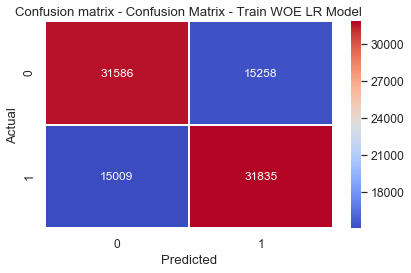

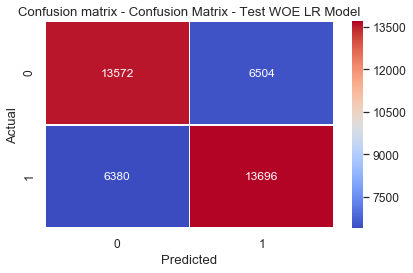


-------------------- SCORES --------------------------
Accuracy Score  : 0.6769
Precision Score : 0.6760
Recall Score    : 0.6796
Sensitivity     : 0.6779
Specificity     : 0.6760
 AUC Score      : 0.6769



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

           0       0.68      0.67      0.68     46844
           1       0.68      0.68      0.68     46844

   micro avg       0.68      0.68      0.68     93688
   macro avg       0.68      0.68      0.68     93688
weighted avg       0.68      0.68      0.68     93688


-------------------- SCORES --------------------------
Accuracy Score  : 0.6791
Precision Score : 0.6780
Recall Score    : 0.6822
Sensitivity     : 0.6802
Specificity     : 0.6780
 AUC Score      : 0.6791



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

           0       0.68      0.68      0.68     20076
           1       0.68      0.6

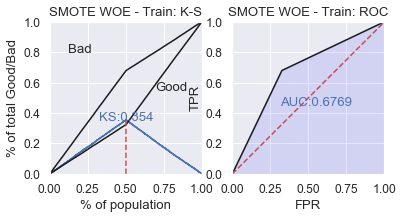

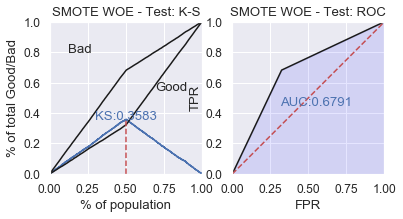

In [1073]:
# print the confusion metrics - Train
smt_woe_cm1 = metrics.confusion_matrix(smt_y_train,trnpred)
draw_confusion_matrix(smt_woe_cm1,"Confusion Matrix - Train WOE LR Model")

# print the confusion metrics - test
smt_woe_cm2 = metrics.confusion_matrix(smt_y_test,tstpred)
draw_confusion_matrix(smt_woe_cm2,"Confusion Matrix - Test WOE LR Model")

#print the model reports for predictions.
model_report(smt_y_train,trnpred)
model_report(smt_y_test,tstpred)

# performance ks & roc  
train_perf = sc.perf_eva(smt_y_train, trnpred, title = "SMOTE WOE - Train",seed=100)
test_perf = sc.perf_eva(smt_y_test, tstpred, title = "SMOTE WOE - Test",seed=100)

####  Calculation of Optimal Cut-off Point

 - Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [1074]:
def Find_Optimal_Cutoff(target, predicted):
    fpr, tpr, threshold = roc_curve(target, predicted)
    i = np.arange(len(tpr)) 
    roc = pd.DataFrame({'tf' : pd.Series(tpr-(1-fpr), index=i), 'threshold' : pd.Series(threshold, index=i)})
    roc_t = roc.ix[(roc.tf-0).abs().argsort()[:1]]
    return list(roc_t['threshold']) 

In [1075]:
#build actual response & predicted response
df_smt_test_predicted = pd.concat([smt_test_data_y,pd.Series(tstpred),pd.Series(tstprob)],axis=1)
df_smt_test_predicted.rename(columns={'y':'response',0:'predicted_response',1:'predicted_response_prob'},inplace=True)

# check.
df_smt_test_predicted.head()

,response,predicted_response,predicted_response_prob
0,0,0,0.2838
1,0,0,0.2681
2,0,0,0.2868
3,0,0,0.2921
4,0,0,0.2994


In [1076]:
# Find optimal probability threshold
threshold = Find_Optimal_Cutoff( df_smt_test_predicted['response'],  df_smt_test_predicted['predicted_response_prob'])
print(threshold)

[0.502714143606297]


In [1077]:
#Finding Optimual Cut-off Point
# create columns with different probability cutoffs 
df_smttest_predicted_opt = df_smt_test_predicted.copy()
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    df_smttest_predicted_opt[i]= df_smttest_predicted_opt.predicted_response_prob.map(lambda x: 1 if x > i else 0)
    
df_smttest_predicted_opt.head()

,response,predicted_response,predicted_response_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0,0.2838,1,1,1,0,0,0,0,0,0,0
1,0,0,0.2681,1,1,1,0,0,0,0,0,0,0
2,0,0,0.2868,1,1,1,0,0,0,0,0,0,0
3,0,0,0.2921,1,1,1,0,0,0,0,0,0,0
4,0,0,0.2994,1,1,1,0,0,0,0,0,0,0


         prob  accuracy  sensitivity  specitivity
0.0000 0.0000    0.5000       1.0000       0.0000
0.1000 0.1000    0.5000       1.0000       0.0000
0.2000 0.2000    0.5241       0.9954       0.0528
0.3000 0.3000    0.6135       0.9222       0.3047
0.4000 0.4000    0.6695       0.8038       0.5352
0.5000 0.5000    0.6791       0.6822       0.6760
0.6000 0.6000    0.6580       0.5126       0.8034
0.7000 0.7000    0.6077       0.3026       0.9128
0.8000 0.8000    0.5416       0.1079       0.9752
0.9000 0.9000    0.5012       0.0027       0.9997


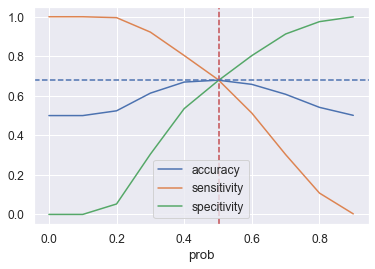

In [1078]:
# calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensitivity','specitivity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(df_smttest_predicted_opt.response, df_smttest_predicted_opt[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
    
print(cutoff_df)
#  plot accuracy sensitivity and specificity for various probabilities.
ax=cutoff_df.plot.line(x='prob', y=['accuracy','sensitivity','specitivity'])
ax.axvline(x=0.503, color='r', linestyle='--', label='optimum cutoff')
ax.axhline(y=0.679, color='b', linestyle='--', label='optimum cutoff')
plt.show();

#### **Observations** 
> -  From the curve above,`0.503` is the optimum point to take it as a cutoff probability.
> -  So, no change required to the default cut off of `0.503` for which we will get SMOTE WOE Test score of  
  - Accuracy Score  : ***`68%`***
  - Precision Score : ***`68%`***
  - Recall Score    : ***`68%`***
  - Sensitivity     : ***`68%`***
  - Specificity     : ***`68%`***
  - AUC Score       : ***`68%`***
  - ROC Curve Area  : ***`68%`***

### MODEL-7 - SMOTE Model - Calculate Score card (Train and Test)

In [1079]:
# credit score
train_score = sc.scorecard_ply(smt_train_woe, card, print_step=0)
test_score = sc.scorecard_ply(smt_test_woe, card, print_step=0)

In [1080]:
# verify scores consistent with data.
smt_train_woe.shape
train_score.shape
smt_test_woe.shape
test_score.shape

(93688, 19)

(93688, 1)

(40152, 19)

(40152, 1)

### Calculate odds and score 

In [1081]:
# Train scores.
df_smt_train_score = pd.concat([pd.Series(trnprob)],axis=1)
df_smt_train_score.rename(columns={0:'predicted_default'},inplace=True)

# Calculate the probability of Non-Default
df_smt_train_score['predicted_nondefault'] = 1 - df_smt_train_score['predicted_default']

#computing odds for good. Since the probability computed is for rejection (bad cusotmers),  Odd(good) =  (1-P(bad))/P(bad)
df_smt_train_score['odds_of_good'] =  df_smt_train_score['predicted_nondefault'] /df_smt_train_score['predicted_default']
df_smt_train_score['ln_odds_of_good'] =  np.log(df_smt_train_score['odds_of_good'])
                                                
#Calculation of scores.
Offset = 400
PDO = 20
Factor = PDO/np.log(2)
Factor

#Using the following formula for computing application score card 
# scorecard = 400 + Factor * (ln(odd(good)) - ln(10)) where Factor is 20/(ln(2)
df_smt_train_score['app_score_card'] = \
              np.floor(df_smt_train_score['ln_odds_of_good'].map(lambda x: 400 + Factor * (x - np.log(10))))

#original train scores.
df_smt_train_score = pd.concat([df_smt_train_score,train_score],axis=1)
df_smt_train_score = df_smt_train_score.sort_values(by='predicted_default',ascending=False)
df_smt_train_score.head()

28.85390081777927

,predicted_default,predicted_nondefault,odds_of_good,ln_odds_of_good,app_score_card,score
50309,0.9283,0.0717,0.0773,-2.5606,259.0000,259.0000
43472,0.9222,0.0778,0.0843,-2.4732,262.0000,262.0000
87665,0.9221,0.0779,0.0845,-2.4713,262.0000,261.0000
85543,0.9221,0.0779,0.0845,-2.4713,262.0000,261.0000
84120,0.9221,0.0779,0.0845,-2.4713,262.0000,261.0000


In [1091]:
df_smt_train_score['app_score_card'].describe()
df_smt_train_score['score'].describe()

count   93,688.0000
mean       332.9265
std         25.5246
min        259.0000
25%        314.0000
50%        333.0000
75%        354.0000
max        385.0000
Name: app_score_card, dtype: float64

count   93,688.0000
mean       332.7658
std         25.6590
min        259.0000
25%        313.0000
50%        333.0000
75%        355.0000
max        385.0000
Name: score, dtype: float64

In [1083]:
# Test scores.
df_smt_test_score = pd.concat([pd.Series(tstprob)],axis=1)
df_smt_test_score.rename(columns={0:'predicted_default'},inplace=True)

# Calculate the probability of Non-Default
df_smt_test_score['predicted_nondefault'] = 1 - df_smt_test_score['predicted_default']

#computing odds for good. Since the probability computed is for rejection (bad cusotmers),  Odd(good) =  (1-P(bad))/P(bad)
df_smt_test_score['odds_of_good'] =  df_smt_test_score['predicted_nondefault'] /df_smt_test_score['predicted_default']
df_smt_test_score['ln_odds_of_good'] =  np.log(df_smt_test_score['odds_of_good'])
                                                
#Calculation of scores.
Offset = 400
PDO = 20
Factor = PDO/np.log(2)
Factor

#Using the following formula for computing application score card 
# scorecard = 400 + Factor * (ln(odd(good)) - ln(10)) where Factor is 20/(ln(2)
df_smt_test_score['app_score_card'] = \
           np.floor(df_smt_test_score['ln_odds_of_good'].map(lambda x: 400 + Factor * (x - np.log(10))))
                                              
#original train scores.
df_smt_test_score = pd.concat([df_smt_test_score,test_score],axis=1)
#df_smt_test_score = df_smt_test_score.sort_values(by='predicted_default',ascending=False)
df_smt_test_score.head()

28.85390081777927

,predicted_default,predicted_nondefault,odds_of_good,ln_odds_of_good,app_score_card,score
0,0.2838,0.7162,2.5230,0.9255,360.0000,359.0000
1,0.2681,0.7319,2.7293,1.0040,362.0000,362.0000
2,0.2868,0.7132,2.4870,0.9111,359.0000,360.0000
3,0.2921,0.7079,2.4235,0.8852,359.0000,359.0000
4,0.2994,0.7006,2.3405,0.8504,358.0000,357.0000


### Verify Train and Test Scores

In [1084]:
# Verify scores.
df_smt_test_score['app_score_card'].describe()
df_smt_test_score['score'].describe()

count   40,152.0000
mean       332.7132
std         25.2414
min        261.0000
25%        314.0000
50%        333.0000
75%        354.0000
max        385.0000
Name: app_score_card, dtype: float64

count   40,152.0000
mean       332.5903
std         25.3396
min        261.0000
25%        313.0000
50%        333.0000
75%        354.0000
max        385.0000
Name: score, dtype: float64

#### Calculation of Cut Off Score for Accepting/Rejecting Application 

In [1092]:
#cutoff selected for logistic regression model was 0.503
CUTOFF_SCORE =  400 + (Factor * (np.log((1-0.503)/0.503) - np.log(10)))
CUTOFF_SCORE

333.21518713738794

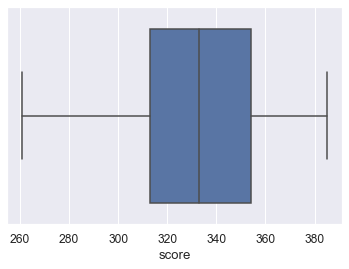

In [1093]:
sns.boxplot(df_smt_test_score['score'])

In [1094]:
# Number of defaulters and non-defaulters
print('Number of Test defaulters = ', len(df_smt_test_score.loc[df_smt_test_score['score'] < CUTOFF_SCORE]))
print('Number of Test Non Defaulters = ', len(df_smt_test_score.loc[df_smt_test_score['score'] >= CUTOFF_SCORE]))

Number of Test defaulters =  20452
Number of Test Non Defaulters =  19700


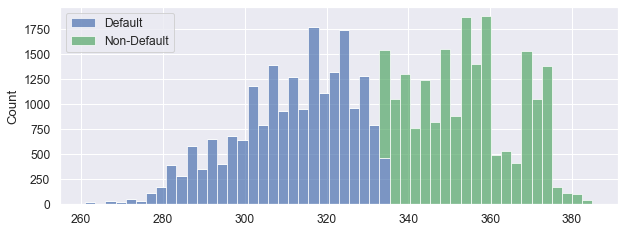

In [1095]:
# Sort on scores.
#df_smt_test_score = df_smt_test_score.sort_values(by='score',ascending=True) 

# Histogram using matplotlib
fig = plt.figure( figsize=(10,8) )
ax_hist = fig.add_subplot(212)
ax_hist.set_ylabel("Count")
ax_hist.hist(
    [df_smt_test_score[df_smt_test_score.score < CUTOFF_SCORE].score, 
     df_smt_test_score[df_smt_test_score.score > CUTOFF_SCORE].score],
     bins=50,
     stacked = True,
     rwidth = 1,
     color = ["b", "g"],
    alpha = 0.7)
plt.legend(["Default", "Non-Default"])
plt.show();

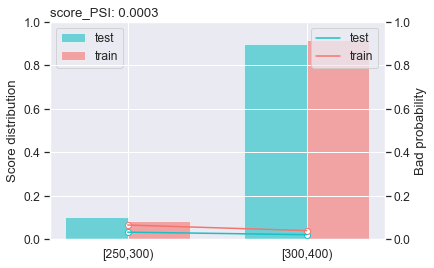

{'psi':   variable    PSI
 0    score 0.0003, 'pic': {'score': <Figure size 432x288 with 2 Axes>}}

In [1119]:
sc.perf_psi(
  score = {'train':train_score, 'test':test_score},
  label = {'train':y_train, 'test':y_test}

)

#### **Observations** 
> - The score cards are calculated using SMOTE Oversampled data.
> - The Cut off Score is calculated based optimum cut off obtained using `0.503` model matrix reports. 
> - The train score cards are in range as below ;
  - `count`-  `93,688.0`
  - `mean` -  `332.7658`
  - `std`  -   `25.6590`
  - `min`  -  `259.0000`
  - `25%`  -  `313.0000`
  - `50%`  -  `333.0000`
  - `75%`  -  `355.0000`
  - `max`  -  `385.0000`
  
> - The test score cards are ;
  - `count`-  `40,152.0`
  - `mean` -  `332.5903`
  - `std`  -   `25.3396`
  - `min`  -  `261.0000`
  - `25%`  -  `313.0000`
  - `50%`  -  `333.0000`
  - `75%`  -  `354.0000`
  - `max`  -  `385.0000`

## MODEL-8 Build LR Model for SMOTE TOMEK

In [1097]:
# Smotek train & test.
smtmk_train_woe.shape
smtmk_test_woe.shape

(83624, 19)

(34384, 19)

### Make Predictions using WOE Logistic Regression Model

In [1098]:
# Call logreg function for SMOTE TOMEK.
trnpred2,tstpred2,trnprob2,tstprob2,card2,model_smtmk = logreg_woe(smtmk_train_woe,smtmk_test_woe,bins,1200)

### Model predictions and reports

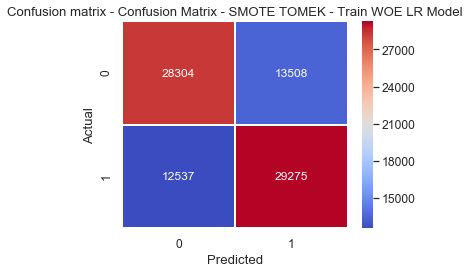

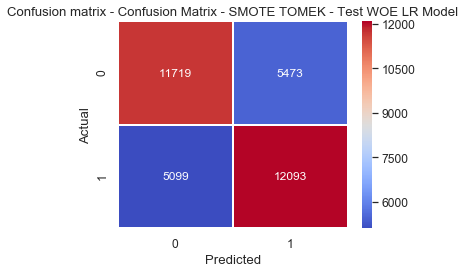


-------------------- SCORES --------------------------
Accuracy Score  : 0.6885
Precision Score : 0.6843
Recall Score    : 0.7002
Sensitivity     : 0.6930
Specificity     : 0.6843
 AUC Score      : 0.6885



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

           0       0.69      0.68      0.68     41812
           1       0.68      0.70      0.69     41812

   micro avg       0.69      0.69      0.69     83624
   macro avg       0.69      0.69      0.69     83624
weighted avg       0.69      0.69      0.69     83624


-------------------- SCORES --------------------------
Accuracy Score  : 0.6925
Precision Score : 0.6884
Recall Score    : 0.7034
Sensitivity     : 0.6968
Specificity     : 0.6884
 AUC Score      : 0.6925



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

           0       0.70      0.68      0.69     17192
           1       0.69      0.7

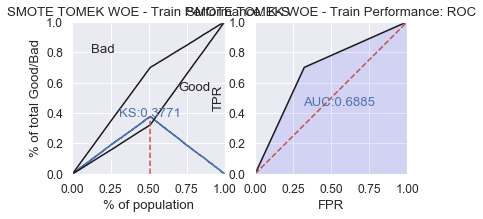

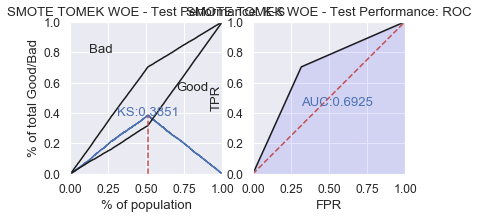

In [1100]:
# print the confusion metrics-Train.
smtmk_woe_cm3 = metrics.confusion_matrix(smtmk_y_train,trnpred2)
draw_confusion_matrix(smtmk_woe_cm3,"Confusion Matrix - SMOTE TOMEK - Train WOE LR Model")

# print the confusion metrics - Test
smtmk_woe_cm4 = metrics.confusion_matrix(smtmk_y_test,tstpred2)
draw_confusion_matrix(smtmk_woe_cm4,"Confusion Matrix - SMOTE TOMEK - Test WOE LR Model")

#print the model reports for predictions.
model_report(smtmk_y_train,trnpred2)
model_report(smtmk_y_test,tstpred2)

# performance ks & roc  
train_perf = sc.perf_eva(smtmk_y_train, trnpred2, title = "SMOTE TOMEK WOE - Train Performance",seed=100)
test_perf = sc.perf_eva(smtmk_y_test, tstpred2, title = "SMOTE TOMEK WOE - Test Performance",seed=100)

In [1101]:
#build actual response & predicted response
df_smtmk_test_predicted = pd.concat([smtmk_test_data_y,pd.Series(tstpred2),pd.Series(tstprob2)],axis=1)
df_smtmk_test_predicted.rename(columns={'y':'response',0:'predicted_response',1:'predicted_response_prob'},inplace=True)

In [1102]:
# Find optimal probability threshold
threshold = Find_Optimal_Cutoff( df_smtmk_test_predicted['response'],  df_smtmk_test_predicted['predicted_response_prob'])
print(threshold)

[0.5086381215474773]


In [1103]:
#Finding Optimual Cut-off Point
# create columns with different probability cutoffs 
df_smtmktest_predicted_opt = df_smtmk_test_predicted.copy()
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    df_smtmktest_predicted_opt[i]= df_smtmktest_predicted_opt.predicted_response_prob.map(lambda x: 1 if x > i else 0)

         prob  accuracy  sensitivity  specitivity
0.0000 0.0000    0.5000       1.0000       0.0000
0.1000 0.1000    0.5000       1.0000       0.0000
0.2000 0.2000    0.5537       0.9798       0.1276
0.3000 0.3000    0.6406       0.9065       0.3746
0.4000 0.4000    0.6863       0.8119       0.5608
0.5000 0.5000    0.6925       0.7034       0.6817
0.6000 0.6000    0.6716       0.5438       0.7994
0.7000 0.7000    0.6203       0.3317       0.9088
0.8000 0.8000    0.5495       0.1253       0.9737
0.9000 0.9000    0.5019       0.0042       0.9995


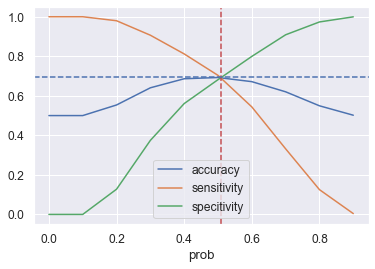

In [1105]:
# calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensitivity','specitivity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm2 = metrics.confusion_matrix(df_smtmktest_predicted_opt.response, df_smtmktest_predicted_opt[i] )
    total2=sum(sum(cm2))
    accuracy = (cm2[0,0]+cm2[1,1])/total2
    
    speci = cm2[0,0]/(cm2[0,0]+cm2[0,1])
    sensi = cm2[1,1]/(cm2[1,0]+cm2[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
    
print(cutoff_df)
#  plot accuracy sensitivity and specificity for various probabilities.
ax=cutoff_df.plot.line(x='prob', y=['accuracy','sensitivity','specitivity'])
ax.axvline(x=0.508, color='r', linestyle='--', label='optimum cutoff')
ax.axhline(y=0.693, color='b', linestyle='--', label='optimum cutoff')
plt.show();

### MODEL-8 Calculate Score card ( SMOTE TOMEK- Train and Test)

In [1106]:
# credit score
train_score2 = sc.scorecard_ply(smtmk_train_woe, card2, print_step=0)
test_score2 = sc.scorecard_ply(smtmk_test_woe, card2, print_step=0)

In [1107]:
# verify scores consistent with data.
smtmk_train_woe.shape
train_score2.shape
smtmk_test_woe.shape
test_score2.shape

(83624, 19)

(83624, 1)

(34384, 19)

(34384, 1)

### Calculate odds and score (Train and Test)

In [1108]:
# SMOTE TOMLINK Train scores.
df_smtmk_train_score = pd.concat([pd.Series(trnprob2)],axis=1)
df_smtmk_train_score.rename(columns={0:'predicted_default'},inplace=True)

# Calculate the probability of Non-Default
df_smtmk_train_score['predicted_nondefault'] = 1 - df_smtmk_train_score['predicted_default']

#computing odds for good. Since the probability computed is for rejection (bad cusotmers),  Odd(good) =  (1-P(bad))/P(bad)
df_smtmk_train_score['odds_of_good'] =  df_smtmk_train_score['predicted_nondefault'] /df_smtmk_train_score['predicted_default']
df_smtmk_train_score['ln_odds_of_good'] =  np.log(df_smtmk_train_score['odds_of_good'])
                                                
#Calculation of scores.
Offset = 400
PDO = 20
Factor = PDO/np.log(2)
Factor

#Using the following formula for computing application score card 
# scorecard = 400 + Factor * (ln(odd(good)) - ln(10)) where Factor is 20/(ln(2)
df_smtmk_train_score['app_score_card'] = \
              np.floor(df_smtmk_train_score['ln_odds_of_good'].map(lambda x: 400 + Factor * (x - np.log(10))))

#original train scores.
df_smtmk_train_score = pd.concat([df_smtmk_train_score,train_score2],axis=1)
df_smtmk_train_score = df_smtmk_train_score.sort_values(by='predicted_default',ascending=False)
df_smtmk_train_score.head()

28.85390081777927

,predicted_default,predicted_nondefault,odds_of_good,ln_odds_of_good,app_score_card,score
44999,0.9358,0.0642,0.0686,-2.6800,256.0000,256.0000
39034,0.9296,0.0704,0.0758,-2.5800,259.0000,258.0000
79036,0.9294,0.0706,0.0759,-2.5778,259.0000,257.0000
49295,0.9294,0.0706,0.0759,-2.5778,259.0000,257.0000
78296,0.9275,0.0725,0.0782,-2.5485,260.0000,259.0000


In [1120]:
### Verify Train Scores
df_smtmk_train_score['app_score_card'].describe()
df_smtmk_train_score['score'].describe()

count   83,624.0000
mean       332.9804
std         27.2123
min        256.0000
25%        312.0000
50%        332.0000
75%        356.0000
max        388.0000
Name: app_score_card, dtype: float64

count   83,624.0000
mean       332.6185
std         27.1394
min        256.0000
25%        312.0000
50%        332.0000
75%        356.0000
max        388.0000
Name: score, dtype: float64

In [1109]:
# SMOTE TOMEK Test scores.
df_smtmk_test_score = pd.concat([pd.Series(tstprob2)],axis=1)
df_smtmk_test_score.rename(columns={0:'predicted_default'},inplace=True)

# Calculate the probability of Non-Default
df_smtmk_test_score['predicted_nondefault'] = 1 - df_smtmk_test_score['predicted_default']

#computing odds for good. Since the probability computed is for rejection (bad cusotmers),  Odd(good) =  (1-P(bad))/P(bad)
df_smtmk_test_score['odds_of_good'] =  df_smtmk_test_score['predicted_nondefault'] /df_smtmk_test_score['predicted_default']
df_smtmk_test_score['ln_odds_of_good'] =  np.log(df_smtmk_test_score['odds_of_good'])
                                                
#Calculation of scores.
Offset = 400
PDO = 20
Factor = PDO/np.log(2)
Factor

#Using the following formula for computing application score card 
# scorecard = 400 + Factor * (ln(odd(good)) - ln(10)) where Factor is 20/(ln(2)
df_smtmk_test_score['app_score_card'] = \
           np.floor(df_smtmk_test_score['ln_odds_of_good'].map(lambda x: 400 + Factor * (x - np.log(10))))
                                              
#original train scores.
df_smtmk_test_score = pd.concat([df_smtmk_test_score,test_score2],axis=1)
#df_smt_test_score = df_smt_test_score.sort_values(by='predicted_default',ascending=False)
df_smtmk_test_score.head()

28.85390081777927

,predicted_default,predicted_nondefault,odds_of_good,ln_odds_of_good,app_score_card,score
0,0.2668,0.7332,2.7480,1.0109,362.0000,362.0000
1,0.2535,0.7465,2.9448,1.0801,364.0000,364.0000
2,0.2735,0.7265,2.6566,0.9771,361.0000,361.0000
3,0.2827,0.7173,2.5375,0.9312,360.0000,359.0000
4,0.2722,0.7278,2.6741,0.9836,361.0000,361.0000


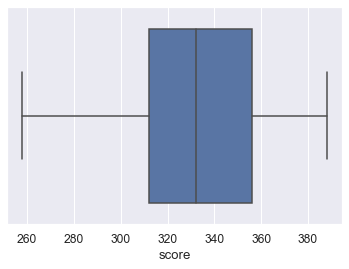

In [1110]:
sns.boxplot(df_smtmk_test_score['score'])
plt.show();

### verify Test Score with SMOTE TOMEK

In [1111]:
### Verify Test Scores
# Verify scores.
df_smtmk_test_score['app_score_card'].describe()
df_smtmk_test_score['score'].describe()

count   34,384.0000
mean       332.8101
std         27.0202
min        258.0000
25%        312.0000
50%        332.0000
75%        356.0000
max        388.0000
Name: app_score_card, dtype: float64

count   34,384.0000
mean       332.4775
std         26.9437
min        258.0000
25%        312.0000
50%        332.0000
75%        356.0000
max        388.0000
Name: score, dtype: float64

In [1112]:
#cutoff selected for logistic regression model was 0.51
CUTOFF_SCORE2 =  400 + (Factor * (np.log((1-0.508)/0.508) - np.log(10)))
CUTOFF_SCORE2

332.63803447359425

In [1113]:
# Number of defaulters and non-defaulters
print('Number of Test defaulters = ', len(df_smtmk_test_score.loc[df_smtmk_test_score['score'] <= CUTOFF_SCORE2]))
print('Number of Test Non Defaulters = ', len(df_smtmk_test_score.loc[df_smtmk_test_score['score'] > CUTOFF_SCORE2]))

Number of Test defaulters =  17334
Number of Test Non Defaulters =  17050


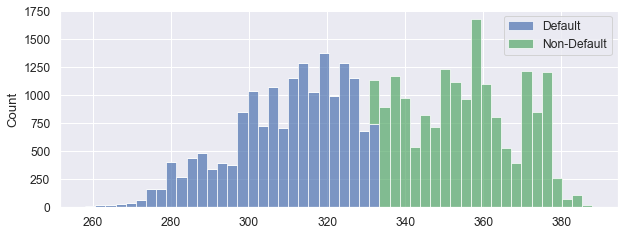

In [1114]:
# Histogram using matplotlib
fig = plt.figure( figsize=(10,8) )
ax_hist = fig.add_subplot(212)
ax_hist.set_ylabel("Count")
ax_hist.hist(
    [df_smtmk_test_score[df_smtmk_test_score.score <= CUTOFF_SCORE2].score, 
     df_smtmk_test_score[df_smtmk_test_score.score >  CUTOFF_SCORE2].score],
     bins=50,
     stacked = True,
     rwidth = 1,
     color = ["b", "g"],
    alpha = 0.7)
plt.legend(["Default", "Non-Default"])
plt.show();

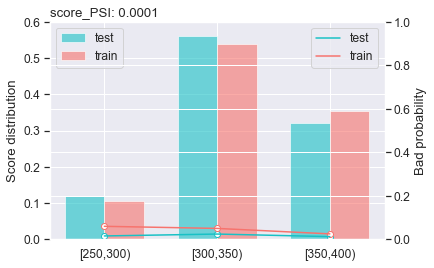

{'psi':   variable    PSI
 0    score 0.0001, 'pic': {'score': <Figure size 432x288 with 2 Axes>}}

In [1115]:
sc.perf_psi(
  score = {'train':train_score2, 'test':test_score2},
  label = {'train':y_train, 'test':y_test}
)

> - #### ***Observations***<br>
> - The score cards are calculated using SMOTE TOMEK Oversampled & Undesampled data.
> - The train score cards are in range as below ;
  - `Count` - `83,624.0`
  - `mean`  - `332.6185`
  - `std`   - ` 27.1394`
  - `min`   - `256.0000`
  - `25%`   - `312.0000`
  - `50%`   - `332.0000`
  - `75%`   - `356.0000`
  - `max`   - `388.0000`
  
> - The test score cards are in range as below ;
  - `count`- `34,384.0`
  - `mean` - `332.4775`
  - `std`  - ` 26.9437` 
  - `min`  - `258.0000`
  - `25%`  - `312.0000`
  - `50%`  - `332.0000`
  - `75%`  - `356.0000`
  - `max`  - `388.0000`

> - #### ***Summary***<br>
> - Following are the model predictions and the reports for the two WOE Mo6els ;

|`S.No`|`Model Name`                         |`Accuracy`|`Precison` |`Recall` |`Sensitivity` |`Specificity`|`AUC`   |`ROC`   |
|:-----|:----------------------------------- |---------:|----------:|--------:|-------------:|------------:|-------:|-------:|
|1     |`LR WOE with SMOTE (Train)`          |`0.6769`  |`0.6760`   |`0.6796` |`0.6779`      |`0.6760`     |`0.6769`|`0.6769`|
|2     |`LR WOE with SMOTE (Test)`           |`0.6791`  |`0.6780`   |`0.6822` |`0.6802`      |`0.6780`     |`0.6791`|`0.6791`|
|3     |`LR WOE with SMOTE-TOMELINK (Train)` |`0.6885`  |`0.6843`   |`0.7002` |`0.6930`      |`0.6843`     |`0.6885`|`0.6885`|
|4     |`LR WOE with SMOTE-TOMELINK (Test)`  |`0.6925`  |`0.6884`   |`0.7034` |`0.6968`      |`0.6884`     |`0.6925`|`0.6925`|


>- based on the above final models SMOTE model is more consistent across both Train and Test than SMOTE TOMEK Sampled Model.
>- We will be using SMOTE as our final model for calcuting Application Score Card and further Financial Benefit Analysis.

## Model Performance using Rejected Population

### Creating Dummy Variables for Categorical Variables.
> Categorical Variables ;
  - Gender
  - Martial_Status
  - Education
  - Profession
  - Residence_Type

### Drop the Perf_Tag Column

In [1121]:
df_rejected.columns

Index(['Appl_ID', 'Age', 'Gender', 'Martial_Status', 'Num_Dependents',
       'Income', 'Education', 'Profession', 'Residence_Type',
       'Num_Months_Cur_Res', 'Num_Months_Cur_Comp', 'Perf_Tag',
       'Num_90_DPD_6_Months', 'Num_60_DPD_6_Months', 'Num_30_DPD_6_Months',
       'Num_90_DPD_12_Months', 'Num_60_DPD_12_Months', 'Num_30_DPD_12_Months',
       'Avg_CC_Util_12_Months', 'Num_Trades_Open_6_Months',
       'Num_Trades_Open_12_Months', 'Num_PL_Trades_Open_6_Months',
       'Num_PL_Trades_Open_12_Months', 'Num_Inq_6_Months', 'Num_Inq_12_Months',
       'Open_Home_Loan', 'Outstanding_Bal', 'Total_Trades', 'Open_Auto_Loan'],
      dtype='object')

In [1122]:
# Rename Target column
df_rejected = df_rejected.rename(columns={'Perf_Tag':'Target'})

# Verify dimension and data.
df_rejected.shape
df_rejected.head()

(1425, 29)

,Appl_ID,Age,Gender,Martial_Status,Num_Dependents,Income,Education,Profession,Residence_Type,Num_Months_Cur_Res,Num_Months_Cur_Comp,Target,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
69600,906908303,35,M,Single,1.0000,6.0000,Bachelor,SAL,Rented,22,18,nan,0,0,2,1,2,3,30.0000,4.0000,12,3,7,2,4,0.0000,"1,309,623.0000",13,0
69601,10990583,47,F,Married,4.0000,12.0000,Masters,SE,Rented,122,25,nan,1,1,1,3,2,2,16.0000,3.0000,7,3,4,3,5,0.0000,"775,626.0000",7,0
69602,589678446,46,M,Married,3.0000,7.0000,Professional,SE,Rented,10,31,nan,3,4,5,3,5,6,83.0000,2.0000,7,2,4,0,3,0.0000,"732,602.0000",8,0
69603,809411322,41,M,Married,3.0000,18.0000,Masters,SAL,Rented,6,47,nan,1,3,4,3,4,5,87.0000,2.0000,7,1,4,4,5,0.0000,"842,057.0000",8,0
69604,150246616,42,F,Married,4.0000,17.0000,Phd,SAL,Rented,8,49,nan,2,2,4,3,2,6,42.0000,3.0000,7,2,3,3,6,0.0000,"786,997.0000",7,1


### Create Dummies for categorical Variables

In [1123]:
# Create Dummies for Gender 7 Martial Status (binary types)
df_rejected['Gender'] = df_rejected['Gender'].map({'M': 1, 'F': 0})
df_rejected['Martial_Status'] = df_rejected['Martial_Status'].map({'Married':1,'Single':0})

# Create Dummies for categorical having more than 2 values.
dummy_education = pd.get_dummies(df_rejected['Education'],prefix='Education')
dummy_education.drop(['Education_Others'],axis=1,inplace=True)

## Create Dummies for categorical having more than 2 values.
dummy_profession = pd.get_dummies(df_rejected['Profession'],prefix='Profession')
dummy_profession.drop(['Profession_SE'],axis=1,inplace=True)

## Create Dummies for categorical having more than 2 values.
dummy_residence = pd.get_dummies(df_rejected['Residence_Type'],prefix='Residence')
dummy_residence.drop(['Residence_Others'],axis=1,inplace=True)

In [1124]:
## Concatenate the final data with dummy data and drop the original categorical variables.
df_rejected = pd.concat([df_rejected,dummy_education,dummy_profession,dummy_residence],axis=1)
df_rejected = df_rejected.drop(columns=['Education','Profession','Residence_Type'],axis=1)

In [1125]:
#Verify the columns and details.
df_rejected.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1425 entries, 69600 to 71241
Data columns (total 36 columns):
Appl_ID                          1425 non-null int64
Age                              1425 non-null int64
Gender                           1425 non-null int64
Martial_Status                   1425 non-null int64
Num_Dependents                   1425 non-null float64
Income                           1425 non-null float64
Num_Months_Cur_Res               1425 non-null int64
Num_Months_Cur_Comp              1425 non-null int64
Target                           0 non-null float64
Num_90_DPD_6_Months              1425 non-null int64
Num_60_DPD_6_Months              1425 non-null int64
Num_30_DPD_6_Months              1425 non-null int64
Num_90_DPD_12_Months             1425 non-null int64
Num_60_DPD_12_Months             1425 non-null int64
Num_30_DPD_12_Months             1425 non-null int64
Avg_CC_Util_12_Months            1390 non-null float64
Num_Trades_Open_6_Months         14

In [1126]:
pd.set_option('display.max_columns', 60)
pd.options.display.float_format = '{:,.4f}'.format
df_rejected.describe()

,Appl_ID,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Target,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented
count,"1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000",0.0000,"1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,390.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000"
mean,"485,902,049.1502",42.3670,0.7677,0.8302,3.1411,16.7404,32.3705,22.1446,nan,1.3165,2.3354,3.2098,2.1909,3.2091,4.0863,51.0799,2.9326,7.8835,2.0568,4.0639,2.0358,4.0358,0.0989,"1,045,251.8828",8.7719,0.0723,0.2772,0.3432,0.0596,0.3179,0.5368,0.1958,0.0189,0.0281,0.1684,0.7839
std,"290,277,560.4361",10.0512,0.4224,0.3756,1.1812,13.7109,32.2041,19.8892,nan,0.7889,1.0796,1.2571,1.0105,1.2451,1.4028,21.3878,1.2246,2.5051,1.0628,1.4776,1.0722,1.4743,0.2987,"824,635.4692",2.5729,0.2590,0.4478,0.4749,0.2369,0.4658,0.4988,0.3969,0.1364,0.1652,0.3744,0.4118
min,"207,075.0000",22.0000,0.0000,0.0000,1.0000,4.5000,6.0000,3.0000,nan,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"17,155.0000",1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,"232,979,991.0000",34.0000,1.0000,1.0000,3.0000,5.0000,6.0000,6.0000,nan,1.0000,2.0000,2.0000,1.0000,2.0000,3.0000,35.0000,2.0000,6.0000,1.0000,3.0000,1.0000,3.0000,0.0000,"610,175.0000",7.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000
50%,"476,559,413.0000",41.0000,1.0000,1.0000,3.0000,11.0000,19.0000,15.0000,nan,1.0000,2.0000,3.0000,2.0000,3.0000,4.0000,51.0000,3.0000,8.0000,2.0000,4.0000,2.0000,4.0000,0.0000,"804,672.0000",9.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000
75%,"733,733,436.0000",50.0000,1.0000,1.0000,4.0000,24.0000,47.0000,34.0000,nan,2.0000,3.0000,4.0000,3.0000,4.0000,5.0000,67.0000,4.0000,10.0000,3.0000,5.0000,3.0000,5.0000,0.0000,"1,074,624.0000",11.0000,0.0000,1.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000
max,"997,504,566.0000",65.0000,1.0000,1.0000,5.0000,60.0000,126.0000,75.0000,nan,3.0000,5.0000,7.0000,5.0000,7.0000,9.0000,101.0000,6.0000,14.0000,4.0000,8.0000,4.0000,8.0000,1.0000,"4,143,938.0000",16.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


### Normalising the Numerical Variables on rejected data

In [1127]:
df_rejected.select_dtypes(['int64','float64']).columns

Index(['Appl_ID', 'Age', 'Gender', 'Martial_Status', 'Num_Dependents',
       'Income', 'Num_Months_Cur_Res', 'Num_Months_Cur_Comp', 'Target',
       'Num_90_DPD_6_Months', 'Num_60_DPD_6_Months', 'Num_30_DPD_6_Months',
       'Num_90_DPD_12_Months', 'Num_60_DPD_12_Months', 'Num_30_DPD_12_Months',
       'Avg_CC_Util_12_Months', 'Num_Trades_Open_6_Months',
       'Num_Trades_Open_12_Months', 'Num_PL_Trades_Open_6_Months',
       'Num_PL_Trades_Open_12_Months', 'Num_Inq_6_Months', 'Num_Inq_12_Months',
       'Open_Home_Loan', 'Outstanding_Bal', 'Total_Trades', 'Open_Auto_Loan'],
      dtype='object')

In [1128]:
norm_cols =  ['Age', 'Gender', 'Martial_Status', 'Num_Dependents',
              'Income', 'Num_Months_Cur_Res', 'Num_Months_Cur_Comp',
              'Num_90_DPD_6_Months', 'Num_60_DPD_6_Months', 'Num_30_DPD_6_Months',
              'Num_90_DPD_12_Months', 'Num_60_DPD_12_Months', 'Num_30_DPD_12_Months',
              'Avg_CC_Util_12_Months', 'Num_Trades_Open_6_Months',
              'Num_Trades_Open_12_Months', 'Num_PL_Trades_Open_6_Months',
              'Num_PL_Trades_Open_12_Months', 'Num_Inq_6_Months', 'Num_Inq_12_Months',
              'Open_Home_Loan', 'Outstanding_Bal', 'Total_Trades', 'Open_Auto_Loan']

#Get the data frame for normalisation. 
df_norm_rejected = df_rejected[norm_cols]
df_norm_rejected.describe()

,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
count,"1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,390.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000"
mean,42.3670,0.7677,0.8302,3.1411,16.7404,32.3705,22.1446,1.3165,2.3354,3.2098,2.1909,3.2091,4.0863,51.0799,2.9326,7.8835,2.0568,4.0639,2.0358,4.0358,0.0989,"1,045,251.8828",8.7719,0.0723
std,10.0512,0.4224,0.3756,1.1812,13.7109,32.2041,19.8892,0.7889,1.0796,1.2571,1.0105,1.2451,1.4028,21.3878,1.2246,2.5051,1.0628,1.4776,1.0722,1.4743,0.2987,"824,635.4692",2.5729,0.2590
min,22.0000,0.0000,0.0000,1.0000,4.5000,6.0000,3.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"17,155.0000",1.0000,0.0000
25%,34.0000,1.0000,1.0000,3.0000,5.0000,6.0000,6.0000,1.0000,2.0000,2.0000,1.0000,2.0000,3.0000,35.0000,2.0000,6.0000,1.0000,3.0000,1.0000,3.0000,0.0000,"610,175.0000",7.0000,0.0000
50%,41.0000,1.0000,1.0000,3.0000,11.0000,19.0000,15.0000,1.0000,2.0000,3.0000,2.0000,3.0000,4.0000,51.0000,3.0000,8.0000,2.0000,4.0000,2.0000,4.0000,0.0000,"804,672.0000",9.0000,0.0000
75%,50.0000,1.0000,1.0000,4.0000,24.0000,47.0000,34.0000,2.0000,3.0000,4.0000,3.0000,4.0000,5.0000,67.0000,4.0000,10.0000,3.0000,5.0000,3.0000,5.0000,0.0000,"1,074,624.0000",11.0000,0.0000
max,65.0000,1.0000,1.0000,5.0000,60.0000,126.0000,75.0000,3.0000,5.0000,7.0000,5.0000,7.0000,9.0000,101.0000,6.0000,14.0000,4.0000,8.0000,4.0000,8.0000,1.0000,"4,143,938.0000",16.0000,1.0000


In [1129]:
# Normalise dataset 
df_std_rejected=(df_norm_rejected-df_norm_rejected.mean())/df_norm_rejected.std()

# Verify the statistics.
df_std_rejected.describe()

,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
count,"1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,390.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000"
mean,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000,-0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,-0.0000,-0.0000
std,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
min,-2.0263,-1.8174,-2.2102,-1.8127,-0.8927,-0.8189,-0.9626,-1.6688,-2.1633,-2.5534,-2.1681,-2.5773,-2.9129,-2.3415,-2.3947,-3.1469,-1.9353,-2.7502,-1.8986,-2.7374,-0.3313,-1.2467,-3.0206,-0.2790
25%,-0.8324,0.5499,0.4521,-0.1194,-0.8563,-0.8189,-0.8117,-0.4012,-0.3107,-0.9624,-1.1785,-0.9711,-0.7744,-0.7518,-0.7616,-0.7519,-0.9944,-0.7200,-0.9660,-0.7026,-0.3313,-0.5276,-0.6887,-0.2790
50%,-0.1360,0.5499,0.4521,-0.1194,-0.4187,-0.4152,-0.3592,-0.4012,-0.3107,-0.1669,-0.1889,-0.1680,-0.0615,-0.0037,0.0550,0.0465,-0.0535,-0.0432,-0.0334,-0.0243,-0.3313,-0.2917,0.0886,-0.2790
75%,0.7594,0.5499,0.4521,0.7272,0.5295,0.4543,0.5961,0.8664,0.6156,0.6286,0.8007,0.6352,0.6513,0.7444,0.8716,0.8449,0.8874,0.6335,0.8992,0.6540,-0.3313,0.0356,0.8660,-0.2790
max,2.2518,0.5499,0.4521,1.5738,3.1551,2.9074,2.6575,2.1340,2.4681,3.0151,2.7799,3.0446,3.5027,2.3340,2.5048,2.4416,1.8284,2.6638,1.8319,2.6889,3.0166,3.7576,2.8093,3.5813


###  Merge the normalized data set to the original Rejected data.

In [1130]:
# Drop the original numerical columns from leads_data.
df_rejected.drop(columns=norm_cols,axis=1,inplace=True)

In [1131]:
# merge leads_data and normalized leads_norm together.
df_rejected = pd.concat([df_rejected,df_std_rejected], axis=1)

In [1132]:
# Verify the final normalised data set.
df_rejected.shape
df_rejected.head()

(1425, 36)

,Appl_ID,Target,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
69600,906908303,nan,1,0,0,0,1,0,0,0,0,1,-0.7330,0.5499,-2.2102,-1.8127,-0.7833,-0.3220,-0.2084,-1.6688,-2.1633,-0.9624,-1.1785,-0.9711,-0.7744,-0.9856,0.8716,1.6432,0.8874,1.9870,-0.0334,-0.0243,-0.3313,0.3206,1.6433,-0.2790
69601,10990583,nan,0,1,0,0,0,0,0,0,0,1,0.4609,-1.8174,0.4521,0.7272,-0.3457,2.7832,0.1436,-0.4012,-1.2370,-1.7579,0.8007,-0.9711,-1.4872,-1.6402,0.0550,-0.3527,0.8874,-0.0432,0.8992,0.6540,-0.3313,-0.3270,-0.6887,-0.2790
69602,589678446,nan,0,0,0,1,0,0,0,0,0,1,0.3614,0.5499,0.4521,-0.1194,-0.7104,-0.6946,0.4452,2.1340,1.5419,1.4241,0.8007,1.4383,1.3641,1.4924,-0.7616,-0.3527,-0.0535,-0.0432,-1.8986,-0.7026,-0.3313,-0.3791,-0.3000,-0.2790
69603,809411322,nan,0,1,0,0,1,0,0,0,0,1,-0.1360,0.5499,0.4521,-0.1194,0.0919,-0.8189,1.2497,-0.4012,0.6156,0.6286,0.8007,0.6352,0.6513,1.6795,-0.7616,-0.3527,-0.9944,-0.0432,1.8319,0.6540,-0.3313,-0.2464,-0.3000,-0.2790
69604,150246616,nan,0,0,1,0,1,0,0,0,0,1,-0.0365,-1.8174,0.4521,0.7272,0.0189,-0.7568,1.3503,0.8664,-0.3107,0.6286,0.8007,-0.9711,1.3641,-0.4245,0.0550,-0.3527,-0.0535,-0.7200,0.8992,1.3323,-0.3313,-0.3132,-0.6887,3.5813


In [1133]:
# check the statistics.
df_rejected.describe()

,Appl_ID,Target,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan
count,"1,425.0000",0.0000,"1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,390.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000","1,425.0000"
mean,"485,902,049.1502",nan,0.2772,0.3432,0.0596,0.3179,0.5368,0.1958,0.0189,0.0281,0.1684,0.7839,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000,-0.0000,-0.0000,0.0000,0.0000,0.0000,0.0000,-0.0000,0.0000,-0.0000,-0.0000
std,"290,277,560.4361",nan,0.4478,0.4749,0.2369,0.4658,0.4988,0.3969,0.1364,0.1652,0.3744,0.4118,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
min,"207,075.0000",nan,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-2.0263,-1.8174,-2.2102,-1.8127,-0.8927,-0.8189,-0.9626,-1.6688,-2.1633,-2.5534,-2.1681,-2.5773,-2.9129,-2.3415,-2.3947,-3.1469,-1.9353,-2.7502,-1.8986,-2.7374,-0.3313,-1.2467,-3.0206,-0.2790
25%,"232,979,991.0000",nan,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,-0.8324,0.5499,0.4521,-0.1194,-0.8563,-0.8189,-0.8117,-0.4012,-0.3107,-0.9624,-1.1785,-0.9711,-0.7744,-0.7518,-0.7616,-0.7519,-0.9944,-0.7200,-0.9660,-0.7026,-0.3313,-0.5276,-0.6887,-0.2790
50%,"476,559,413.0000",nan,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,-0.1360,0.5499,0.4521,-0.1194,-0.4187,-0.4152,-0.3592,-0.4012,-0.3107,-0.1669,-0.1889,-0.1680,-0.0615,-0.0037,0.0550,0.0465,-0.0535,-0.0432,-0.0334,-0.0243,-0.3313,-0.2917,0.0886,-0.2790
75%,"733,733,436.0000",nan,1.0000,1.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.7594,0.5499,0.4521,0.7272,0.5295,0.4543,0.5961,0.8664,0.6156,0.6286,0.8007,0.6352,0.6513,0.7444,0.8716,0.8449,0.8874,0.6335,0.8992,0.6540,-0.3313,0.0356,0.8660,-0.2790
max,"997,504,566.0000",nan,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,2.2518,0.5499,0.4521,1.5738,3.1551,2.9074,2.6575,2.1340,2.4681,3.0151,2.7799,3.0446,3.5027,2.3340,2.5048,2.4416,1.8284,2.6638,1.8319,2.6889,3.0166,3.7576,2.8093,3.5813


> #### ***Observations***<br>
> - The rejected Population data in dataframe df_rejected in now ready with all numeric variables and can be used to for assessment

### Check any Null values in Rejected Data.

In [1134]:
# Verify  nulls.
print(df_rejected.isnull().sum())

Appl_ID                             0
Target                           1425
Education_Bachelor                  0
Education_Masters                   0
Education_Phd                       0
Education_Professional              0
Profession_SAL                      0
Profession_SE_PROF                  0
Residence_Company provided          0
Residence_Living with Parents       0
Residence_Owned                     0
Residence_Rented                    0
Age                                 0
Gender                              0
Martial_Status                      0
Num_Dependents                      0
Income                              0
Num_Months_Cur_Res                  0
Num_Months_Cur_Comp                 0
Num_90_DPD_6_Months                 0
Num_60_DPD_6_Months                 0
Num_30_DPD_6_Months                 0
Num_90_DPD_12_Months                0
Num_60_DPD_12_Months                0
Num_30_DPD_12_Months                0
Avg_CC_Util_12_Months              35
Num_Trades_O

In [1135]:
## Impute Avg_CC_Util_12_Months with 0
df_rejected.loc[(df_rejected['Avg_CC_Util_12_Months'].isnull()),'Avg_CC_Util_12_Months'] = 0

### Prepare for bins and Scorecard

In [1136]:
# for predictions use the same set of columns we have used for full data set
X_woe_columns = dt_score.columns

# Generete WOE data frame for the model predictions (normalised)
df_woe_rejected = df_rejected[X_woe_columns]
df_woe_rejected.head()

,Num_60_DPD_6_Months,Num_PL_Trades_Open_6_Months,Num_Months_Cur_Res,Num_Trades_Open_6_Months,Num_90_DPD_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Inq_12_Months,Num_60_DPD_12_Months,Income,Num_30_DPD_6_Months,Num_Trades_Open_12_Months,Outstanding_Bal,Total_Trades,Num_90_DPD_12_Months,Num_Months_Cur_Comp,Target
69600,-2.1633,0.8874,-0.3220,0.8716,-1.6688,1.9870,-0.0334,-0.7744,-0.9856,-0.0243,-0.9711,-0.7833,-0.9624,1.6432,0.3206,1.6433,-1.1785,-0.2084,nan
69601,-1.2370,0.8874,2.7832,0.0550,-0.4012,-0.0432,0.8992,-1.4872,-1.6402,0.6540,-0.9711,-0.3457,-1.7579,-0.3527,-0.3270,-0.6887,0.8007,0.1436,nan
69602,1.5419,-0.0535,-0.6946,-0.7616,2.1340,-0.0432,-1.8986,1.3641,1.4924,-0.7026,1.4383,-0.7104,1.4241,-0.3527,-0.3791,-0.3000,0.8007,0.4452,nan
69603,0.6156,-0.9944,-0.8189,-0.7616,-0.4012,-0.0432,1.8319,0.6513,1.6795,0.6540,0.6352,0.0919,0.6286,-0.3527,-0.2464,-0.3000,0.8007,1.2497,nan
69604,-0.3107,-0.0535,-0.7568,0.0550,0.8664,-0.7200,0.8992,1.3641,-0.4245,1.3323,-0.9711,0.0189,0.6286,-0.3527,-0.3132,-0.6887,0.8007,1.3503,nan


In [1137]:
# Get rejected data X and y for prediction.
X_woe_rejected = df_woe_rejected.drop(['Target'],axis=1)
y_woe_rejected =df_woe_rejected['Target']

# Verify dimensions
X_woe_rejected.shape
y_woe_rejected.shape

(1425, 18)

(1425,)

### Model Evaluation and prediction on Rejected Data

In [1138]:
X_woe_rejected.columns

Index(['Num_60_DPD_6_Months', 'Num_PL_Trades_Open_6_Months',
       'Num_Months_Cur_Res', 'Num_Trades_Open_6_Months', 'Num_90_DPD_6_Months',
       'Num_PL_Trades_Open_12_Months', 'Num_Inq_6_Months',
       'Num_30_DPD_12_Months', 'Avg_CC_Util_12_Months', 'Num_Inq_12_Months',
       'Num_60_DPD_12_Months', 'Income', 'Num_30_DPD_6_Months',
       'Num_Trades_Open_12_Months', 'Outstanding_Bal', 'Total_Trades',
       'Num_90_DPD_12_Months', 'Num_Months_Cur_Comp'],
      dtype='object')

In [1139]:
# Predict Rejected Population probabilities.
rejected_woe_pred_ = model_smt.predict(X_woe_rejected)

# Get prediction probability scores.
rejected_woe_pred_prob_ = model_smt.predict_proba(X_woe_rejected)[:,1]

# Veify Dimensions.
rejected_woe_pred_.shape
rejected_woe_pred_prob_.shape

(1425,)

(1425,)

In [1140]:
#build actual response & predicted response
df_rejected_woe_predicted = pd.concat([pd.Series(rejected_woe_pred_ ),pd.Series(rejected_woe_pred_prob_)],axis=1)
df_rejected_woe_predicted.rename(columns={0:'predicted_response',1:'predicted_response_prob'},inplace=True)
df_rejected_woe_predicted.head()

,predicted_response,predicted_response_prob
0,0,0.1271
1,0,0.2909
2,0,0.4449
3,1,0.7007
4,1,0.7361


In [1141]:
# Number of 'good' versus 'bad'
df_rejected_woe_predicted.predicted_response.value_counts()

#Conversion Rate
defaults = (sum(df_rejected_woe_predicted['predicted_response'])/ \
            len(df_rejected_woe_predicted['predicted_response'].index))*100
print("Percentage Defaults in the Rejected Population dataset: {:.2f}%".format(defaults))

0    807
1    618
Name: predicted_response, dtype: int64

Percentage Defaults in the Rejected Population dataset: 43.37%


### Calculate Bins and Score Card

In [1142]:
# Return rejected score cards.
card_woe_rejected = sc.scorecard(bins, model_smt,X_woe_rejected.columns,points0=400,odds0=1/10,pdo=20)

In [1143]:
# credit score
rejected_woe_scores = sc.scorecard_ply(X_woe_rejected, card_woe_rejected, print_step=0)

# Reset index and drop the existing index.
rejected_woe_scores = rejected_woe_scores.reset_index(drop=True)

### Calculate odds and score 

In [1144]:
# SMOTE WOE Rejected scores.
df_smt_rejected_score = pd.concat([pd.Series(rejected_woe_pred_),pd.Series(rejected_woe_pred_prob_)],axis=1)
df_smt_rejected_score.rename(columns={0:'predicted_response',1:'predicted_default'},inplace=True)

# Calculate the probability of Non-Default
df_smt_rejected_score['predicted_nondefault'] = 1 - df_smt_rejected_score['predicted_default']

#computing odds for good. Since the probability computed is for rejection (bad cusotmers),  Odd(good) =  (1-P(bad))/P(bad)
df_smt_rejected_score['odds_of_good'] = df_smt_rejected_score['predicted_nondefault'] /\
                                                   df_smt_rejected_score['predicted_default']
df_smt_rejected_score['ln_odds_of_good'] =  np.log(df_smt_rejected_score['odds_of_good'])

#Calculation of scores.
Offset = 400
PDO = 20
Factor = PDO/np.log(2)
Factor

#Using the following formula for computing application score card 
# scorecard = 400 + Factor * (ln(odd(good)) - ln(10)) where Factor is 20/(ln(2)
df_smt_rejected_score['app_score_card'] = \
             np.floor(df_smt_rejected_score['ln_odds_of_good'].map(lambda x: 400 + Factor * (x - np.log(10))))

#append original calcuated scores.
df_smt_rejected_score = pd.concat([df_smt_rejected_score,rejected_woe_scores],axis=1)

df_smt_rejected_score.head()

28.85390081777927

,predicted_response,predicted_default,predicted_nondefault,odds_of_good,ln_odds_of_good,app_score_card,score
0,0,0.1271,0.8729,6.8707,1.9273,389.0000,352.0000
1,0,0.2909,0.7091,2.4375,0.8910,359.0000,354.0000
2,0,0.4449,0.5551,1.2475,0.2212,339.0000,318.0000
3,1,0.7007,0.2993,0.4271,-0.8507,309.0000,333.0000
4,1,0.7361,0.2639,0.3586,-1.0257,303.0000,372.0000


In [1145]:
df_smt_rejected_score['app_score_card'].describe()
df_smt_rejected_score['score'].describe()

count   1,425.0000
mean      337.3663
std        51.7451
min       183.0000
25%       303.0000
50%       341.0000
75%       373.0000
max       499.0000
Name: app_score_card, dtype: float64

count   1,425.0000
mean      347.9053
std        14.7519
min       289.0000
25%       347.0000
50%       354.0000
75%       354.0000
max       372.0000
Name: score, dtype: float64

## Final Credit Score Generation Process 
> - Since our data is highly imbalanced , we used SMOTE and SMOTE TOMEK Technique for our final WOE Logistic Regression Model
  - The Evalulation Metrics are consistent across both Train and Test Data and No overfitting occur unlike other models.
  - So, we will go with Calculating score cards for entire WOE Data using final SMOTE Model
  - Calculate Score Cards (reusing same bins, cards used for train and test SMOTE)
  - Decide the final cut off on score cards
  - Further Financial Benfit analysis based on the scorecard and cut off decided.
> - We will be using the same dt_score data frame (optimized WOE data) and bins.

In [1159]:
# Traditional Credit Scoring Using Logistic Regression
dt_score = sc.var_filter(df_final_woe, y="Target")

# Check the filtered columns
dt_score.columns
dt_score.shape

# check the filtered data
dt_score.head()

Variable filtering on 69867 rows and 35 columns in 00:00:48 
16 variables are removed


Index(['Num_60_DPD_6_Months', 'Num_PL_Trades_Open_6_Months',
       'Num_Months_Cur_Res', 'Num_Trades_Open_6_Months', 'Num_90_DPD_6_Months',
       'Num_PL_Trades_Open_12_Months', 'Num_Inq_6_Months',
       'Num_30_DPD_12_Months', 'Avg_CC_Util_12_Months', 'Num_Inq_12_Months',
       'Num_60_DPD_12_Months', 'Income', 'Num_30_DPD_6_Months',
       'Num_Trades_Open_12_Months', 'Outstanding_Bal', 'Total_Trades',
       'Num_90_DPD_12_Months', 'Num_Months_Cur_Comp', 'Target'],
      dtype='object')

(69867, 19)

,Num_60_DPD_6_Months,Num_PL_Trades_Open_6_Months,Num_Months_Cur_Res,Num_Trades_Open_6_Months,Num_90_DPD_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Inq_12_Months,Num_60_DPD_12_Months,Income,Num_30_DPD_6_Months,Num_Trades_Open_12_Months,Outstanding_Bal,Total_Trades,Num_90_DPD_12_Months,Num_Months_Cur_Comp,Target
0,0,0,113,1.0000,0,0,0,0,4.0000,0,0,40.0000,0,2,"2,999,395.0000",4,0,56,0
1,0,0,112,1.0000,0,0,0,0,3.0000,0,0,55.0000,0,2,"3,078.0000",5,0,46,0
2,0,0,104,0.0000,0,0,0,0,7.0000,0,0,46.0000,0,0,"3,004,972.0000",2,0,49,0
3,0,0,94,1.0000,0,0,0,0,11.0000,0,0,53.0000,0,1,"3,355,373.0000",4,0,53,0
4,0,0,112,0.0000,0,0,0,0,12.0000,0,0,44.0000,0,1,"3,014,283.0000",4,0,43,0


In [1160]:
# Get Entire data for prediction.
X_ = dt_score.drop(['Target'],axis=1)
y_ = dt_score['Target']

# Get the columns of X_ for later use.
X_columns = X_.columns

#Verify Dimensions.
print("X_ =", X_.shape, "y_ = ", y_.shape)

X_ = (69867, 18) y_ =  (69867,)


In [1161]:
#build data frame X_all and y_all data.
df_X_all = pd.DataFrame(data=X_,columns=X_columns)
df_y_all = pd.DataFrame(data=y_,columns=['Target'])

# converting into woe values for SMOTE (Transformatiion Woe)
df_X_woe_all = sc.woebin_ply(df_X_all, bins)
df_y_woe_all = sc.woebin_ply(df_y_all, bins)

#verify woe transformed data frames.
df_X_woe_all.shape
df_y_woe_all.shape

(69867, 18)

(69867, 1)

### Make Predictions on Original Data
> - We will use the same model_smt (Smote WOE Trained Final Model) for predictions.

In [1162]:
# Predict the all data using final SMOTE Model 
y_all_woe_pred_ = model_smt.predict(df_X_woe_all)

# Get prediction probability scores for all data.
y_all_pred_prob_ = model_smt.predict_proba(df_X_woe_all)[:,1]

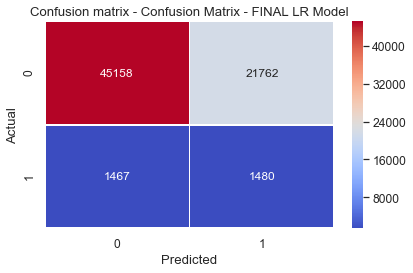


-------------------- SCORES --------------------------
Accuracy Score  : 0.6675
Precision Score : 0.0637
Recall Score    : 0.5022
Sensitivity     : 0.9685
Specificity     : 0.0637
 AUC Score      : 0.5885



---------------- CLASSIFICATION REPORT------------------
              precision    recall  f1-score   support

           0       0.97      0.67      0.80     66920
           1       0.06      0.50      0.11      2947

   micro avg       0.67      0.67      0.67     69867
   macro avg       0.52      0.59      0.45     69867
weighted avg       0.93      0.67      0.77     69867



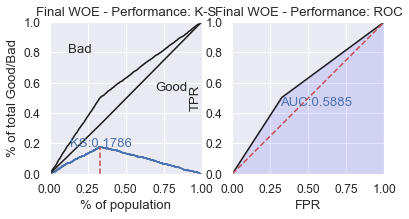

In [1163]:
# print the confusion metrics  
smt_woe_all_cm = metrics.confusion_matrix(df_y_all.values.ravel(),y_all_woe_pred_)
draw_confusion_matrix(smt_woe_all_cm,"Confusion Matrix - FINAL LR Model")

#print the model reports for predictions.
model_report(df_y_all.values.ravel(),y_all_woe_pred_)

# performance ks & roc  
smt_woe_all_perf = sc.perf_eva(df_y_all.values.ravel(),y_all_woe_pred_, title = "Final WOE - Performance")

In [1164]:
# Calculate cards.
woe_all_card_ = sc.scorecard(bins,model_smt,X_columns,points0=400,odds0=1/10,pdo=20)

### Calculate odds and score 

In [1165]:
# Calculate the credit score
final_woe_scores = sc.scorecard_ply(df_X_all, woe_all_card_, print_step=0)

In [1166]:
# WOE Final scores.
df_final_score = pd.concat([pd.Series(y_all_pred_prob_)],axis=1)
df_final_score.rename(columns={0:'predicted_default'},inplace=True)

# Calculate the probability of Non-Default
df_final_score['predicted_nondefault'] = 1 - df_final_score['predicted_default']

#computing odds for good. Since the probability computed is for rejection (bad cusotmers),  Odd(good) =  (1-P(bad))/P(bad)
df_final_score['odds_of_good'] =  df_final_score['predicted_nondefault'] /df_final_score['predicted_default']
df_final_score['ln_odds_of_good'] =  np.log(df_final_score['odds_of_good'])
                                                
#Calculation of scores.
Offset = 400
PDO = 20
Factor = PDO/np.log(2)
Factor

#Using the following formula for computing application score card 
# scorecard = 400 + Factor * (ln(odd(good)) - ln(10)) where Factor is 20/(ln(2)
df_final_score['app_score_card'] = \
             np.floor(df_final_score['ln_odds_of_good'].map(lambda x: 400 + Factor * (x - np.log(10))))

#append original calcuated scores.
df_final_score = pd.concat([df_final_score,final_woe_scores],axis=1)
df_final_score = df_final_score.sort_values(by='predicted_default',ascending=True)
df_final_score.head()

28.85390081777927

,predicted_default,predicted_nondefault,odds_of_good,ln_odds_of_good,app_score_card,score
21838,0.1414,0.8586,6.0745,1.8041,385.0000,367.0000
63275,0.1424,0.8576,6.0223,1.7955,385.0000,312.0000
8084,0.1443,0.8557,5.9294,1.7799,384.0000,375.0000
8137,0.1443,0.8557,5.9294,1.7799,384.0000,375.0000
8759,0.1444,0.8556,5.9256,1.7793,384.0000,397.0000


In [1154]:
df_final_score['app_score_card'].describe()
df_final_score['score'].describe()

count   69,867.0000
mean       342.5289
std         22.9686
min        262.0000
25%        325.0000
50%        347.0000
75%        359.0000
max        385.0000
Name: app_score_card, dtype: float64

count   69,867.0000
mean       342.2228
std         23.1628
min        253.0000
25%        323.0000
50%        349.0000
75%        359.0000
max        420.0000
Name: score, dtype: float64

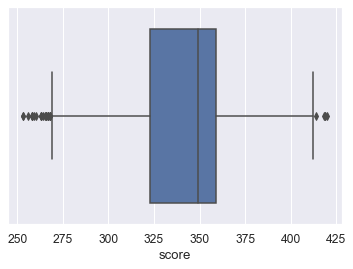

In [1155]:
sns.boxplot(df_final_score['score'])

### Calculation of Application Accepted and Rejected

In [1175]:
print(CUTOFF_SCORE)

333.21518713738794


In [1268]:
df_final_score['appl_accepted_rejected'] =  np.where((df_final_score['score'] <= CUTOFF_SCORE),1, 0)

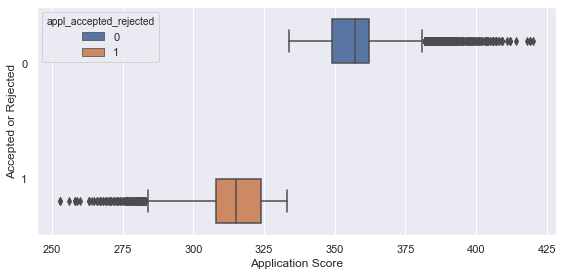

In [1269]:
# Box plot for Scores for Rejected and Accepted Applications.
fig = plt.figure( figsize=(8,4))
fig.subplots_adjust(top=0.88, wspace=0.3)

ax = sns.boxplot(y=df_final_score['appl_accepted_rejected'],
            x=df_final_score['score'],orient='h',
            hue=df_final_score['appl_accepted_rejected'])
ax.set_xlabel("Application Score")
ax.set_ylabel("Accepted or Rejected")
plt.tight_layout()
plt.show();

In [1270]:
### Calculation of Application Accepted and Rejected
df_appl_rejected =  df_final_score.loc[df_final_score['score'] <= CUTOFF_SCORE]
df_appl_accepted =  df_final_score.loc[df_final_score['score'] >  CUTOFF_SCORE]

In [1271]:
# verify the distributions.
df_appl_rejected.describe()
df_appl_accepted.describe()

,predicted_default,predicted_nondefault,odds_of_good,ln_odds_of_good,app_score_card,score,appl_accepted_rejected
count,"23,987.0000","23,987.0000","23,987.0000","23,987.0000","23,987.0000","24,176.0000","24,176.0000"
mean,0.5211,0.4789,1.1274,-0.1049,330.0391,314.8313,1.0000
std,0.1601,0.1601,0.7250,0.7103,20.5017,11.6070,0.0000
min,0.1424,0.0778,0.0843,-2.4732,262.0000,253.0000,1.0000
25%,0.3870,0.3669,0.5796,-0.5455,317.0000,308.0000,1.0000
50%,0.5119,0.4881,0.9533,-0.0478,332.0000,315.0000,1.0000
75%,0.6331,0.6130,1.5839,0.4599,346.0000,324.0000,1.0000
max,0.9222,0.8576,6.0223,1.7955,385.0000,333.0000,1.0000


,predicted_default,predicted_nondefault,odds_of_good,ln_odds_of_good,app_score_card,score,appl_accepted_rejected
count,"45,687.0000","45,687.0000","45,687.0000","45,687.0000","45,687.0000","45,691.0000","45,691.0000"
mean,0.3748,0.6252,2.1839,0.5570,349.1411,356.7161,0.0000
std,0.1663,0.1663,1.2567,0.7414,21.4041,11.9187,0.0000
min,0.1414,0.0963,0.1065,-2.2394,268.0000,334.0000,0.0000
25%,0.2295,0.5141,1.0579,0.0563,335.0000,349.0000,0.0000
50%,0.3211,0.6789,2.1148,0.7489,355.0000,357.0000,0.0000
75%,0.4859,0.7705,3.3566,1.2109,368.0000,362.0000,0.0000
max,0.9037,0.8586,6.0745,1.8041,385.0000,420.0000,0.0000


In [1272]:
df_appl_rejected.shape
df_appl_accepted.shape

(24176, 7)

(45691, 7)

In [1273]:
df_appl_accepted.head()

,predicted_default,predicted_nondefault,odds_of_good,ln_odds_of_good,app_score_card,score,appl_accepted_rejected
21838,0.1414,0.8586,6.0745,1.8041,385.0000,367.0000,0
8084,0.1443,0.8557,5.9294,1.7799,384.0000,375.0000,0
8137,0.1443,0.8557,5.9294,1.7799,384.0000,375.0000,0
8759,0.1444,0.8556,5.9256,1.7793,384.0000,397.0000,0
28405,0.1453,0.8547,5.8813,1.7718,384.0000,381.0000,0


> #### ***Observations***<br>
> - From the distributiion of accepted and rejected applications ;
> - The mean and the median scores for the rejected applications are `314.83` and `315.00` respectively.
> - The mean and the median scores for the accepted applications are `356.71` and `357.00` respectively.
> - Thus mean and median score of approved customers is much higher than those of rejected customers.

In [1274]:
# Number of defaulters and non-defaulters
print('Number of Final defaulters = ', len(df_appl_rejected))
print('Number of Final Non Defaulters = ', len(df_appl_accepted))

Number of Final defaulters =  24176
Number of Final Non Defaulters =  45691



#### **Observations** 
> - The original data prediction run using Final Logistic Regression SMOTE WOE Model.
> - The score card is calculated based on the following assumptions ;
> - Cutoff selected for probability of default for logistic regression model using SMOTE WOE which was `0.503`
> - `CUTOFF_SCORE =  400 + (Factor * (np.log((1-0.503)/0.503) - np.log(10))) where PDO = 20 and Factor = PDO/np.log(2)`
> - `CUTOFF SCORE` is arrived as to `333.21`
> - No.of applicants above score `333.21` and thus their credit card application will be accepted as per our model is `45691`
> - No.of applicants below score `333.21` and thus their credit card application will not be accepted or rejected as per our model is `24176`.

## Financial Benefit Analysis

In [1275]:
def draw_Hist_final(mtitle,xlabel,hcolor,dcolor):
    fig = plt.figure( figsize=(12,4) )
    title = fig.suptitle(mtitle + "  Distribution", fontsize=16, fontweight='bold')
    fig.subplots_adjust(top=0.88, wspace=0.3)
    
    mean=df_final_score[xlabel].mean()
    median=df_final_score[xlabel].median()
    mode=df_final_score[xlabel].mode().get_values()[0]
    
    #===========#
    # Histogram #
    #===========#
    ax1 = fig.add_subplot(1,2,1)
    ax1 = sns.distplot(df_final_score[xlabel],
                       bins=40,
                       hist_kws={"linewidth": 1,'alpha':1},
                       kde=True,
                       color=hcolor,
                      ax =ax1)

    ax1.set(xlabel=xlabel,ylabel='Frequency')
    
    # mean,median and mode,
    ax1.axvline(mean, color='tab:orange', linestyle='--',linewidth=2)
    ax1.axvline(median, color='tab:red', linestyle='-',linewidth=2)
    ax1.axvline(mode, color='tab:pink', linestyle='-',linewidth=2)
    plt.legend({'Mean':mean,'Median':median,'Mode':mode})
        
     
    #==============#
    # Density Plot #
    #==============#
    sns.set(color_codes=True)
    ax2 = fig.add_subplot(1,2,2) 
    ax2.set(xlabel=xlabel,ylabel='Density')
    ax2=sns.kdeplot(df_final_score[xlabel], ax=ax2, shade=True,color=dcolor)
    
    # mean,median and mode,
    ax2.axvline(mean, color='tab:orange', linestyle='--',linewidth=2)
    ax2.axvline(median, color='tab:red', linestyle='-',linewidth=2)
    ax2.axvline(mode, color='tab:pink', linestyle='-',linewidth=2)
    plt.legend({'Mean':mean,'Median':median,'Mode':mode})
    
    #plot 
    plt.tight_layout()
    plt.show();

count   69,867.0000
mean       342.2228
std         23.1628
min        253.0000
1%         290.0000
5%         303.0000
10%        309.0000
20%        318.0000
30%        328.0000
40%        339.0000
50%        349.0000
60%        354.0000
70%        357.0000
80%        361.0000
90%        368.0000
max        420.0000
Name: score, dtype: float64

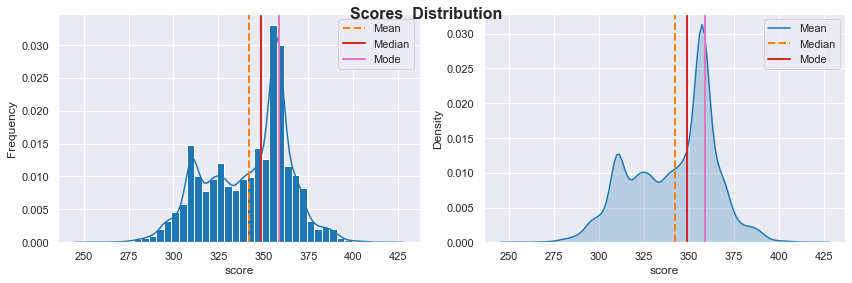

In [1247]:
## Checking the Perecentiles of Score distribution
df_final_score['score'].describe(percentiles = [0.01,.05,.10,.20,.30,.40,.50,.60,.70,.80,.90])

# Total Number of Scores Distribution..
draw_Hist_final("Scores","score","tab:blue","tab:blue")

#### **Observations** 
> -  Observing the quantile of Score distribution we notice that the Optimum Cut-off score of 333
> -  We could reduce the Cut-off score at 20% Quantile cut-off score of 318 and increase the Acceptance model
> - Let's analyse the P&L ratio by using the cut-off scores of 333 and 318 and check the Profit and Loss

In [1276]:
df_final_woe.shape

(69867, 35)

In [1277]:
#Merge Calculated Scores with Original dataframe
df_orig_with_score = pd.concat([df_final_woe,df_final_score],axis=1)
df_orig_with_score.head()

,Age,Gender,Martial_Status,Num_Dependents,Income,Num_Months_Cur_Res,Num_Months_Cur_Comp,Target,Num_90_DPD_6_Months,Num_60_DPD_6_Months,Num_30_DPD_6_Months,Num_90_DPD_12_Months,Num_60_DPD_12_Months,Num_30_DPD_12_Months,Avg_CC_Util_12_Months,Num_Trades_Open_6_Months,Num_Trades_Open_12_Months,Num_PL_Trades_Open_6_Months,Num_PL_Trades_Open_12_Months,Num_Inq_6_Months,Num_Inq_12_Months,Open_Home_Loan,Outstanding_Bal,Total_Trades,Open_Auto_Loan,Education_Bachelor,Education_Masters,Education_Phd,Education_Professional,Profession_SAL,Profession_SE_PROF,Residence_Company provided,Residence_Living with Parents,Residence_Owned,Residence_Rented,predicted_default,predicted_nondefault,odds_of_good,ln_odds_of_good,app_score_card,score,appl_accepted_rejected
0,48.0000,0.0000,1.0000,2.0000,40.0000,113.0000,56.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,4.0000,1.0000,2.0000,0.0000,0.0000,0.0000,0.0000,1.0000,"2,999,395.0000",4.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.2838,0.7162,2.5230,0.9255,360.0000,369.0000,0
1,31.0000,1.0000,1.0000,4.0000,55.0000,112.0000,46.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.0000,1.0000,2.0000,0.0000,0.0000,0.0000,0.0000,0.0000,"3,078.0000",5.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.2681,0.7319,2.7293,1.0040,362.0000,392.0000,0
2,32.0000,1.0000,0.0000,2.0000,46.0000,104.0000,49.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,7.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,"3,004,972.0000",2.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,0.2932,0.7068,2.4101,0.8797,358.0000,357.0000,0
3,43.0000,1.0000,1.0000,1.0000,53.0000,94.0000,53.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,11.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,"3,355,373.0000",4.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.2766,0.7234,2.6150,0.9613,361.0000,352.0000,0
4,35.0000,0.0000,1.0000,5.0000,44.0000,112.0000,43.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,12.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,"3,014,283.0000",4.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.2891,0.7109,2.4586,0.8996,359.0000,369.0000,0


### Calculate Profit & Loss
>- Following are calculated for Financial Benefit Analysis ;
   - ***Approval Rate*** - The Rate at which number of customers application considered for Credit Card 
   - ***Total Outstanding Balance of Rejected Applicants*** - Net Credit Loss incurred by losing the customer by rejecting application.

#### Approval Rate & Outstanding Balance - without any ScoreCard

In [1278]:
# Original Approval Rate  
original_approval_rate = round(((len(df_orig_with_score['Target'].index) - df_orig_with_score['Target'].sum()) / \
                                                                     len(df_orig_with_score['Target'].index)*100),0)
print("Approval Rate in the Original Population dataset        : {:.2f}%".format(original_approval_rate))

# all Applicants's OutStanding Balance
default_accepted_outstanding_balance = df_orig_with_score.loc[df_orig_with_score['Target'] == 0]['Outstanding_Bal'].sum()
print("Total Default Outstanding Balance of Accepted Applicants: %.2f" % default_accepted_outstanding_balance)

default_rejected_outstanding_balance = df_orig_with_score.loc[df_orig_with_score['Target'] == 1]['Outstanding_Bal'].sum()
print("Total Default Outstanding Balance of Rejected Applicants: %.2f" % default_rejected_outstanding_balance)

# Net Credit Loss
print("Default Net Credit Loss of all Applicants               : %.2f" % default_rejected_outstanding_balance)

Approval Rate in the Original Population dataset        : 96.00%
Total Default Outstanding Balance of Accepted Applicants: 83727731375.00
Total Default Outstanding Balance of Rejected Applicants: 3711178158.00
Default Net Credit Loss of all Applicants               : 3711178158.00


#### Approval Rate & Outstanding Balances -  With Score at  333 - Conservative Cut off

In [1279]:
# Conservative Approval Rate.
conservative_approval_rate = \
    round(((len(df_orig_with_score['appl_accepted_rejected'].index) - df_orig_with_score['appl_accepted_rejected'].sum()) / \
                                                         len(df_orig_with_score['appl_accepted_rejected'].index)*100),0)
# 
print("Conservative Net Approval Rate                                            : {:.2f}%".format(conservative_approval_rate))

# Sum of all  Accepted Applicants's OutStanding Balance at Cut-off 333
accepted_outstanding_balance_333 = df_orig_with_score.query("appl_accepted_rejected==0")["Outstanding_Bal"].sum()
print("Total Outstanding Balance of Accepted Applicants/Profit @cut off 333      : %.2f" % accepted_outstanding_balance_333)

# Sum of all  Rejected Applicants's OutStanding Balance at Cut-off 333
rejected_outstanding_balance_333 = df_orig_with_score.query("appl_accepted_rejected==1")["Outstanding_Bal"].sum()
print("Total Outstanding Balance of Rejected Applicants/Credit Loss @cut off 333 : %.2f" % rejected_outstanding_balance_333)

Conservative Net Approval Rate                                            : 65.00%
Total Outstanding Balance of Accepted Applicants/Profit @cut off 333      : 56027836200.00
Total Outstanding Balance of Rejected Applicants/Credit Loss @cut off 333 : 31411073333.00


#### Approval Rate & Outstanding Balances -With Score at 318 (revised cut-off at 20 percentile) - Balanced Cut off

In [1280]:
## At cut-off score of 318 (20 percentile) - Calcuate applicants accepted and rejected
df_orig_with_score['appl_cut_318'] = df_orig_with_score.score.map(lambda x: 1 if x <= 318 else 0)

## Check revised approval after the model Cutoff score of @ 318 -- 80%:20%
df_orig_with_score.appl_cut_318.value_counts()

0    55834
1    14226
Name: appl_cut_318, dtype: int64

In [1281]:
# Balanced Approval Rate @318.
Balanced_approval_rate = \
    round(((len(df_orig_with_score['appl_cut_318'].index) - df_orig_with_score['appl_cut_318'].sum()) / \
                                                         len(df_orig_with_score['appl_cut_318'].index)*100),0)
# 
print("Balanced Net Approval Rate                                                : {:.2f}%".format(Balanced_approval_rate))

# Sum of all Accepted Applicants's OutStanding Balance at Cut-off 318
accepted_outstanding_balance_318 = df_orig_with_score.query('appl_cut_318==0')['Outstanding_Bal'].sum()
print("Total Outstanding Balance of Accepted Applicants/Net profit @cut off 318  : %.2f" % accepted_outstanding_balance_318)

# Sum of all  Rejected Applicants's OutStanding Balance at Cut-off 318
rejected_outstanding_balance_318 = df_orig_with_score.query('appl_cut_318==1')['Outstanding_Bal'].sum()
print("Total Outstanding Balance of Rejected Applicants/Credit Loss @cut off 318 : %.2f" % rejected_outstanding_balance_318)

Balanced Net Approval Rate                                                : 80.00%
Total Outstanding Balance of Accepted Applicants/Net profit @cut off 318  : 71027114302.00
Total Outstanding Balance of Rejected Applicants/Credit Loss @cut off 318 : 16411795231.00


#### Net Profit & Net Credit Loss

In [1286]:
### Net Profit -- Difference of Outstanding Balances of Rejected applicants @333 and @318
Net_Profit = accepted_outstanding_balance_318 - accepted_outstanding_balance_333
print("Final Net Profit after revised balanced cut off       : %.2f" % Net_Profit)

### Net Credit Loss - Difference of Outstanding Balances of accepted applicants @333 an @318
Net_Credit_Loss = rejected_outstanding_balance_333 - rejected_outstanding_balance_318
print("Final Net Credit Loss after revised balanced cut off  : %.2f" % Net_Credit_Loss)

Final Net Profit after revised balanced cut off       : 14999278102.00
Final Net Credit Loss after revised balanced cut off  : 14999278102.00


#### **Observations** 
>- ***With `Cut of Score as 333 - Conservative cut off Rate` - Although net credit loss is lesser, the Approval rate also goes down sharply (from 96% to 65%), Which in turn could cause less sales. Hence there is Trade-off between sales and risk of acquiring new customers.***<br>

>- ***With strategy of `revised Bank's acceptance rate - (Currently we are taking 80:20 ratio)` - we could afford to be less conservative in terms of score cut off. from percentile distribution and box plot we observe that by setting `cut off to 318 (20th Percentile)` we can cover much higher sales, with a balanced risk on both Profit & Loss.***

>- So the final approval rate is 80% , with cut-off score 318 we can achieve balanced P & L of `14999278102.00`